# Instalando Spark e iniciando sessão

In [ ]:
!pip install pyspark

In [ ]:
from pyspark.sql import SparkSession

spark = SparkSession.builder \
    .master("local[*]") \
    .appName("Colab") \
    .config("spark.driver.memory", "4g") \
    .config("spark.executor.memory", "4g") \
    .config("spark.serializer", "org.apache.spark.serializer.KryoSerializer") \
    .config("spark.kryo.registrationRequired", "false") \
    .config("spark.sql.inMemoryColumnarStorage.batchSize", "10000") \
    .getOrCreate()

# Importando e instanciado o dataframe

In [ ]:
from google.colab import drive
drive.mount('/content/drive') #Muda de acordo com o usuario
file_path = "/content/drive/MyDrive/2024-5/liver_data_normalizado2.csv"

MessageError: Error: credential propagation was unsuccessful

In [ ]:
file_path = "/content/liver_data.csv" #para caso nao deseje conectar ao drive, é outra maneira de importar

In [ ]:
df = spark.read.csv(file_path, header=True, inferSchema=True)
df.show()

+-------+----------+------------+-------+------------+-------------+------------+-------------+--------------+---------------+----------------+-----------------+---------+----+------------+--------------------+------------------------+-------------------------+-----------+------------+------+----------+------+----------+--------+-------+-------+--------+-------------+------------+------------+--------+---------+------------------------+-------------------------+-----------------+------------------+-------+-----------+-----------+--------------+-------------+-----------+---------+---------------+-----------------------+------------------------+-------------------------+--------------------------+---------------------------+----------------------------+--------------------+-------------------+--------------------+----------------------------+-----------------------------+
|PT_CODE|   TX_DATE|PX_STAT_DATE|PX_STAT|INIT_ALBUMIN|FINAL_ALBUMIN|INIT_ASCITES|FINAL_ASCITES|INIT_BILIRUBIN|FINAL_B

## Outras importações

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt


# Importando o DF com pandas


In [ ]:
import pandas as pd

# Lendo o arquivo CSV original
df_pandas = pd.read_csv('/content/drive/MyDrive/2024-5/liver_data_normalizado2.csv')




# Selecionando variáveis independentes e dependente

In [ ]:
# Definir as variáveis independentes (X) e dependente (y)
variaveis_independentes = [
     "INIT_ALBUMIN", "FINAL_ALBUMIN", "INIT_ASCITES", "FINAL_ASCITES", "INIT_BILIRUBIN", "FINAL_BILIRUBIN",
    "INIT_SERUM_CREAT", "FINAL_SERUM_CREAT", "CREAT_DON", "DIAB", "DIABETES_DON", "HIST_INSULIN_DEP_DON",
    "INIT_DIALYSIS_PRIOR_WEEK", "FINAL_DIALYSIS_PRIOR_WEEK", "INIT_ENCEPH", "FINAL_ENCEPH", "ETHCAT",
    "ETHCAT_DON", "GENDER", "GENDER_DON", "INIT_AGE", "AGE_DON", "DGN_TCR", "INIT_BMI_CALC", "END_BMI_CALC",
    "BMI_DON_CALC", "INIT_INR", "FINAL_INR", "INIT_MELD_PELD_LAB_SCORE", "FINAL_MELD_PELD_LAB_SCORE",
    "INIT_SERUM_SODIUM", "FINAL_SERUM_SODIUM", "PREV_TX", "PREV_TX_ANY", "NUM_PREV_TX", "COD_CAD_DON", "COLD_ISCH"
]
X = df_pandas[variaveis_independentes]
y = df_pandas["tempo_sobrevida"]


NameError: name 'df_pandas' is not defined

# Modas e médias

In [ ]:

from pyspark.sql.functions import mean, count, col

# Selecionar colunas
colunas = input("Digite as colunas separadas por vírgula: ").split(',')
colunas = [col.strip() for col in colunas]

# Calcular média e moda
def calcular_media_moda(df, colunas):
    resultado = {}
    for coluna in colunas:
        if coluna in df.columns:
            media = df.select(mean(coluna).alias("media")).collect()[0]["media"]
            moda_df = df.groupBy(coluna).count().orderBy("count", ascending=False)
            moda = moda_df.select(coluna).limit(1).collect()
            moda_valor = moda[0][0] if moda else None
            moda_percent_df = moda_df.select((col("count") / df.count() * 100).alias("percent")).limit(1).collect()
            moda_porcentagem = moda_percent_df[0]["percent"] if moda_percent_df else None
            resultado[coluna] = {"Média": media, "Moda": moda_valor, "Moda %": moda_porcentagem}
        else:
            resultado[coluna] = "Coluna não encontrada"
    return resultado

# Exibir resultados
resultados = calcular_media_moda(df, colunas)
print("\nResultados:")
for coluna, valores in resultados.items():
    print(f"Coluna: {coluna}")
    print(valores)


Digite as colunas separadas por vírgula: PSTATUS,DAYSWAIT_CHRON,FINAL_MELD_PELD_LAB_SCORE,DGN_TCR,INIT_AGE,GENDER,tempo_sobrevida

Resultados:
Coluna: PSTATUS
Coluna não encontrada
Coluna: DAYSWAIT_CHRON
{'Média': 202.83794460107356, 'Moda': 2, 'Moda %': 3.564772781574043}
Coluna: FINAL_MELD_PELD_LAB_SCORE
{'Média': 22.467068061993277, 'Moda': 18.0, 'Moda %': 3.7017569009732245}
Coluna: DGN_TCR
{'Média': 4064.7703763877607, 'Moda': 4204.0, 'Moda %': 25.979197527914494}
Coluna: INIT_AGE
{'Média': 54.26151224096462, 'Moda': 57, 'Moda %': 4.845415014096622}
Coluna: GENDER
{'Média': 0.3324572721046176, 'Moda': 0, 'Moda %': 66.75427278953823}
Coluna: tempo_sobrevida
{'Média': 85.29360793870757, 'Moda': 0, 'Moda %': 3.6061865851133303}


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.gridspec import GridSpec

# Set basic style parameters
plt.rcParams['font.size'] = 10
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['figure.facecolor'] = 'white'

# Create figure
fig = plt.figure(figsize=(15, 8))
gs = GridSpec(2, 2, figure=fig)

# Define colors
colors = ['#2563eb', '#64748b']

# 1. Gender Distribution Pie Chart
ax1 = fig.add_subplot(gs[0, 0])
gender_data = [66, 34]
gender_labels = ['Masculino', 'Feminino']
wedges, texts, autotexts = ax1.pie(gender_data, labels=gender_labels, colors=colors, autopct='%1.1f%%')
for autotext in autotexts:
    autotext.set_color('white')
ax1.set_title('Distribuição por Gênero', pad=20)

# 2. Key Metrics
metrics = {
    'Total de Pacientes': '62.781',
    'Idade Média': '54 anos',
    'MELD Médio': '22',
    'Sobrevida Média': '7 anos',
    'Tempo de Espera Médio': '202 dias',
    'Cirrose por HCV': '25% dos casos'
}

# Create text box for metrics
ax2 = fig.add_subplot(gs[0, 1])
ax2.axis('off')
y_pos = 0.8
for metric, value in metrics.items():
    ax2.text(0.1, y_pos, f'{metric}:', fontweight='bold')
    ax2.text(0.6, y_pos, value)
    y_pos -= 0.15

# Main title
fig.suptitle('Dashboard de Transplante Hepático', fontsize=16, y=0.95)

# Adjust layout
plt.tight_layout()

# Save plot
plt.savefig('transplant_dashboard.png', dpi=300, bbox_inches='tight')
plt.close()

# Gráficos de dispersão

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.90      1.00      0.95     20335
           1       0.00      0.00      0.00      2200

    accuracy                           0.90     22535
   macro avg       0.45      0.50      0.47     22535
weighted avg       0.81      0.90      0.86     22535

Matriz de Confusão:
 [[20335     0]
 [ 2200     0]]


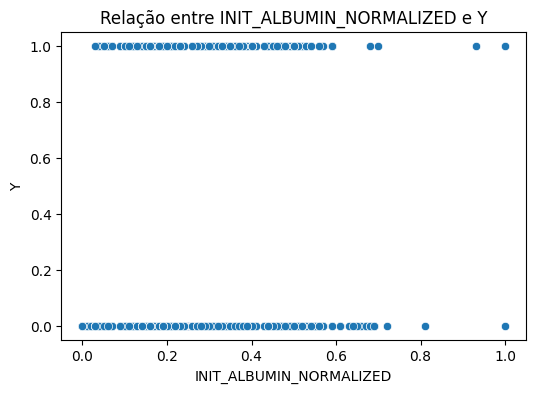

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Criando um alvo binário baseado em 'tempo_sobrevida_meses' (exemplo: maior que 6 meses)
df_pandas["Y"] = (df_pandas["tempo_sobrevida"] <= 6).astype(int)

# Separando variáveis independentes (X) e dependentes (Y)
X = df_pandas[["INIT_ALBUMIN_NORMALIZED"]]
y = df_pandas["Y"]

# Dividindo os dados em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Criando o modelo de regressão logística
model = LogisticRegression()
model.fit(X_train, y_train)

# Fazendo previsões no conjunto de teste
y_pred = model.predict(X_test)

# Avaliação do modelo
print("Relatório de Classificação:\n", classification_report(y_test, y_pred))
print("Matriz de Confusão:\n", confusion_matrix(y_test, y_pred))

# Visualizando a relação entre INIT_ALBUMIN_NORMALIZED e Y
plt.figure(figsize=(6, 4))
sns.scatterplot(x=df_pandas["INIT_ALBUMIN_NORMALIZED"], y=df_pandas["Y"])
plt.title("Relação entre INIT_ALBUMIN_NORMALIZED e Y")
plt.xlabel("INIT_ALBUMIN_NORMALIZED")
plt.ylabel("Y")
plt.show()

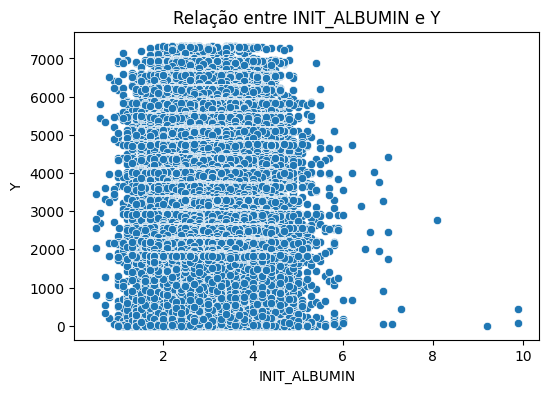

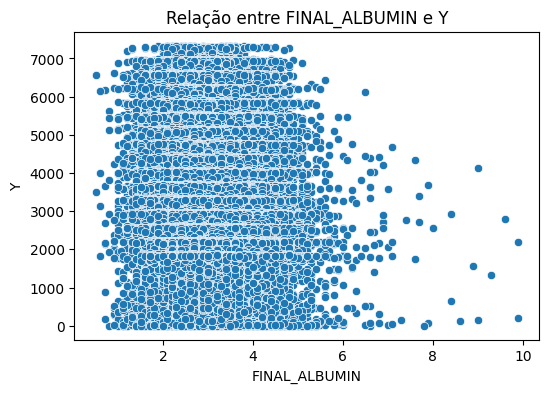

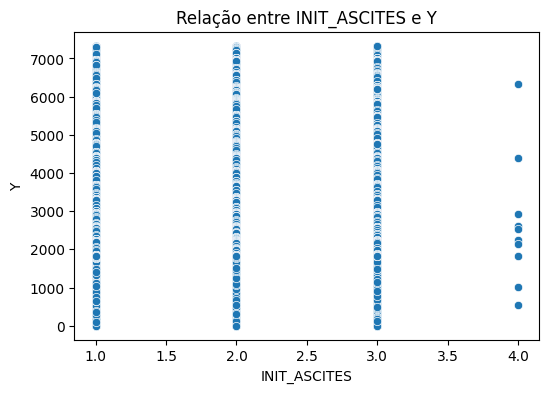

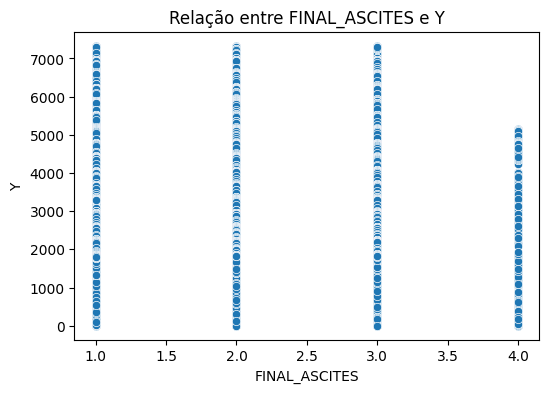

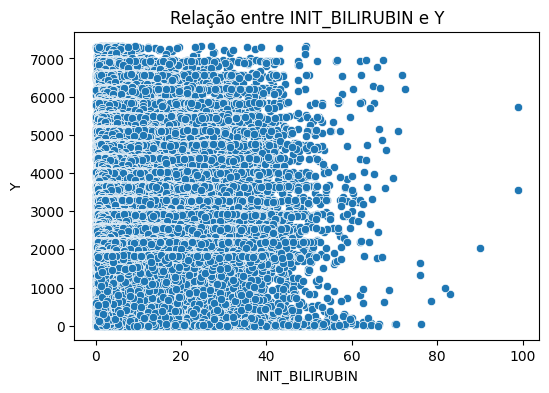

...

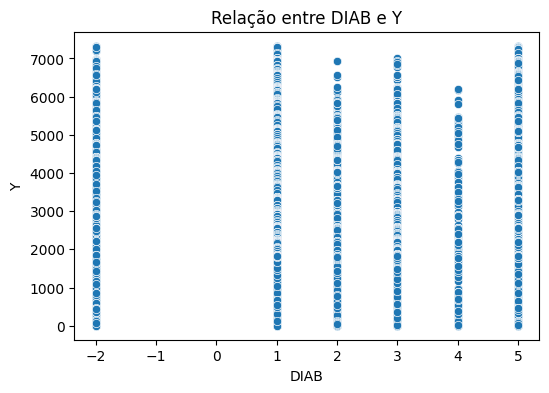

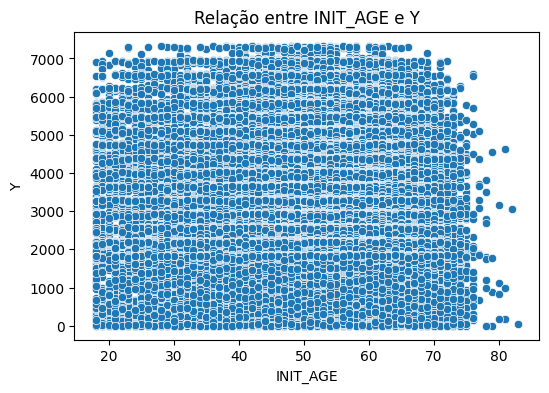

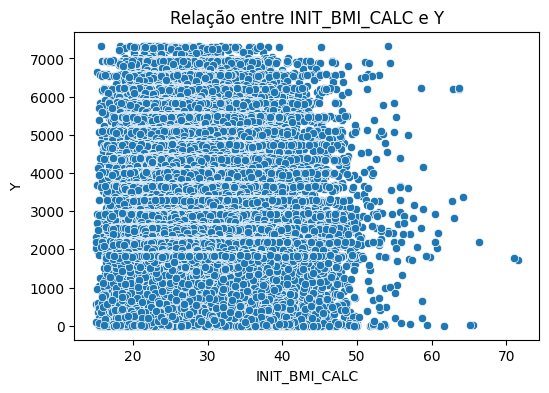

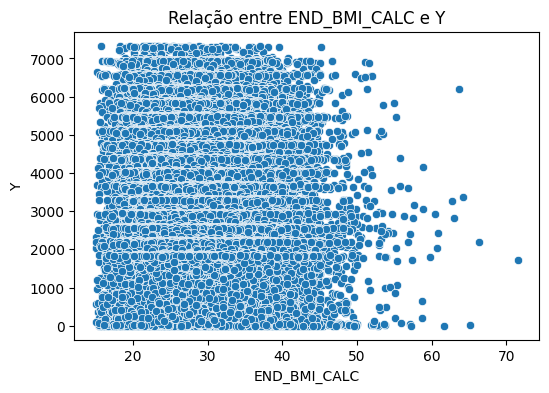

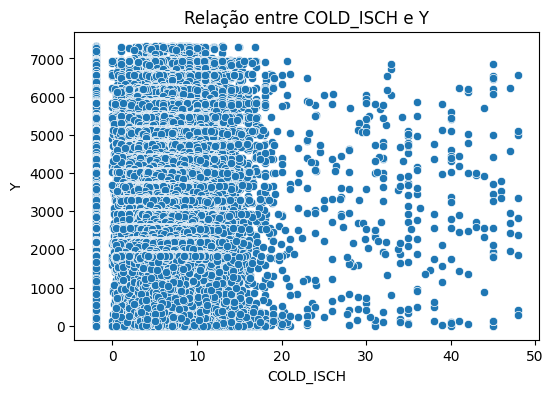

In [ ]:
# Loop para plotar a relação entre cada variável independente e a variável dependente
for coluna in variaveis_independentes:
    plt.figure(figsize=(6, 4))
    sns.scatterplot(x=df_pandas[coluna], y=df_pandas["tempo_sobrevida"])  # Substitua "Y" pelo nome da variável dependente
    plt.title(f"Relação entre {coluna} e Y")
    plt.xlabel(coluna)
    plt.ylabel("Y")
    plt.show()

# Gráficos de distribuição de cada variável

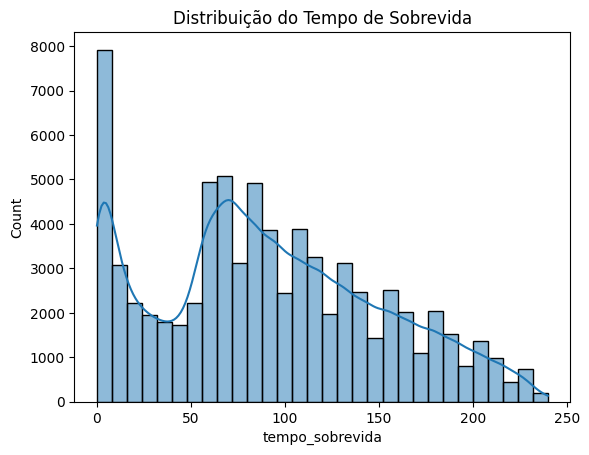

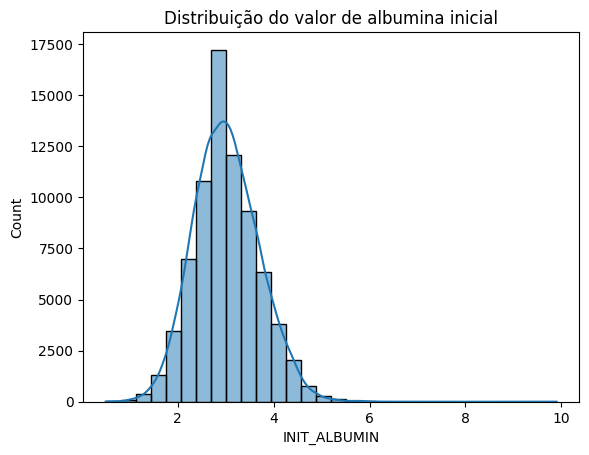

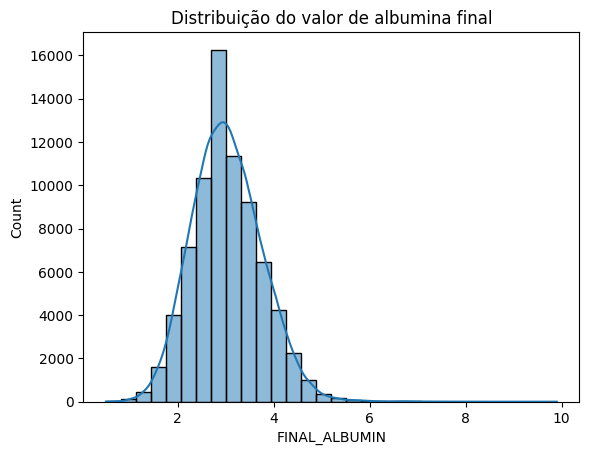

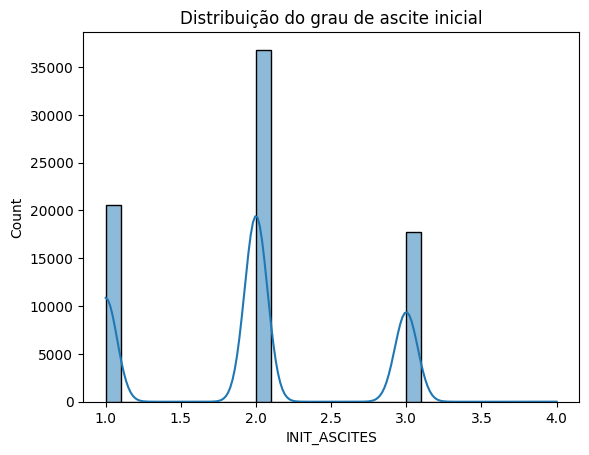

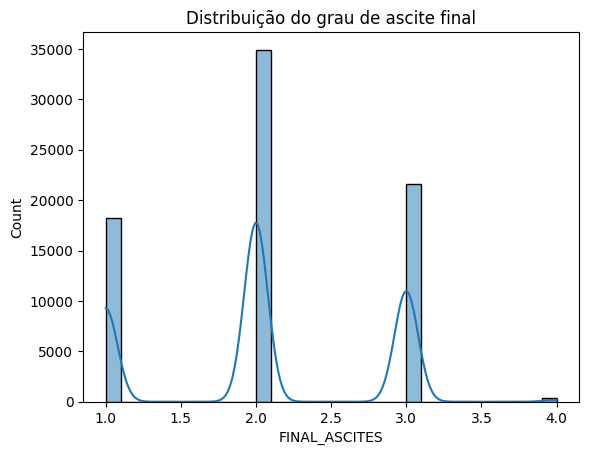

...

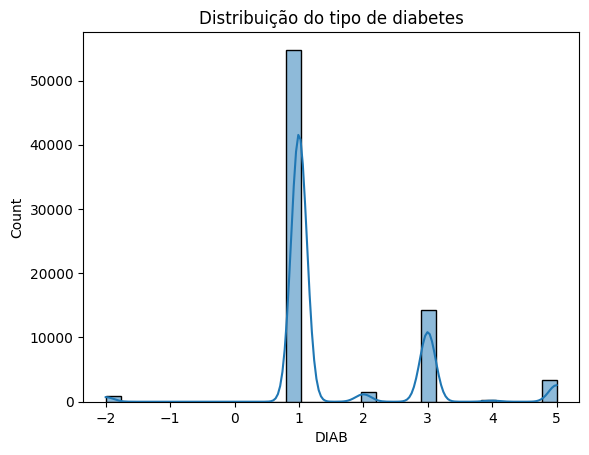

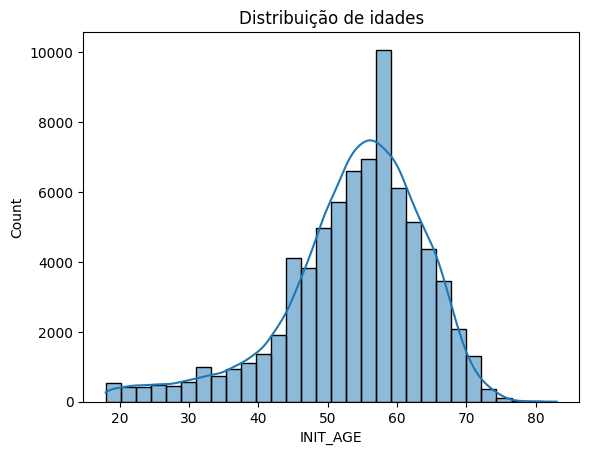

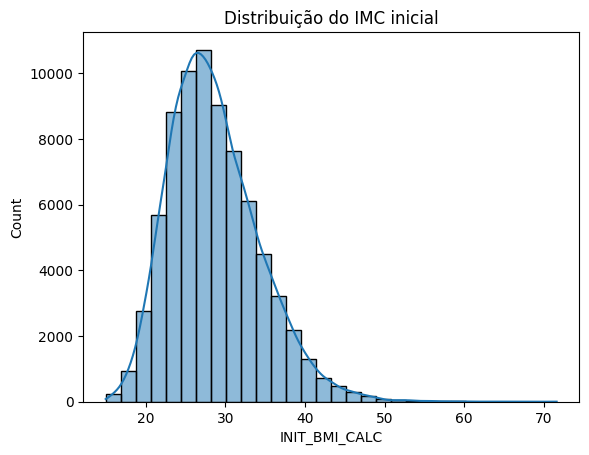

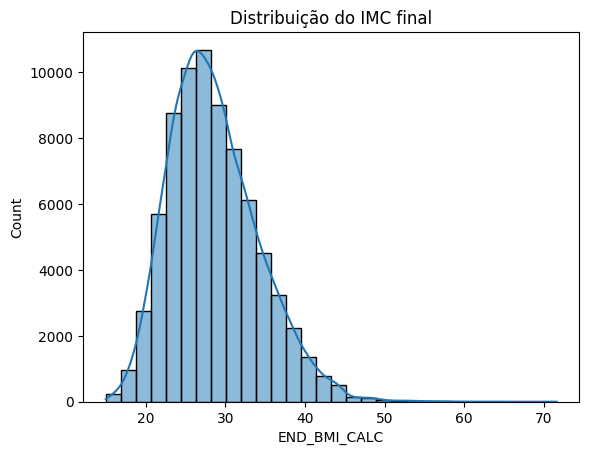

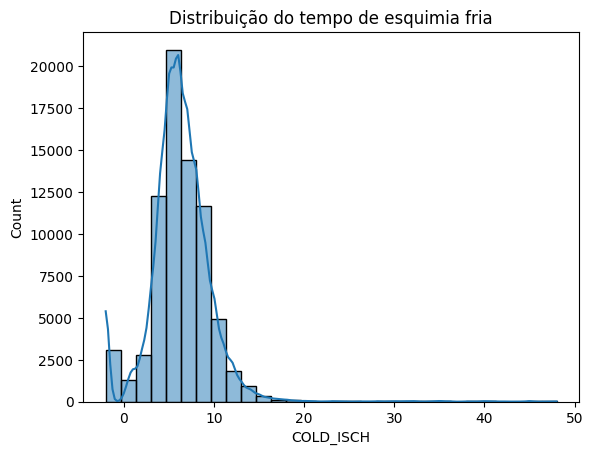

In [ ]:
sns.histplot(df_pandas["tempo_sobrevida"], bins=30, kde=True)
plt.title("Distribuição do Tempo de Sobrevida")
plt.show()

sns.histplot(df_pandas["INIT_ALBUMIN"], bins=30, kde=True)
plt.title("Distribuição do valor de albumina inicial")
plt.show()

sns.histplot(df_pandas["FINAL_ALBUMIN"], bins=30, kde=True)
plt.title("Distribuição do valor de albumina final")
plt.show()

sns.histplot(df_pandas["INIT_ASCITES"], bins=30, kde=True)
plt.title("Distribuição do grau de ascite inicial")
plt.show()

sns.histplot(df_pandas["FINAL_ASCITES"], bins=30, kde=True)
plt.title("Distribuição do grau de ascite final")
plt.show()

sns.histplot(df_pandas["INIT_BILIRUBIN"], bins=30, kde=True)
plt.title("Distribuição do valor de bilirrubina inicial")
plt.show()

sns.histplot(df_pandas["FINAL_BILIRUBIN"], bins=30, kde=True)
plt.title("Distribuição do valor de bilirrubina final")
plt.show()

sns.histplot(df_pandas["INIT_SERUM_CREAT"], bins=30, kde=True)
plt.title("Distribuição do valor de creatinina inicial")
plt.show()

sns.histplot(df_pandas["FINAL_SERUM_CREAT"], bins=30, kde=True)
plt.title("Distribuição do valor de creatinina inicial")
plt.show()

sns.histplot(df_pandas["DIAB"], bins=30, kde=True)
plt.title("Distribuição do tipo de diabetes")
plt.show()

sns.histplot(df_pandas["INIT_AGE"], bins=30, kde=True)
plt.title("Distribuição de idades")
plt.show()

sns.histplot(df_pandas["INIT_BMI_CALC"], bins=30, kde=True)
plt.title("Distribuição do IMC inicial")
plt.show()

sns.histplot(df_pandas["END_BMI_CALC"], bins=30, kde=True)
plt.title("Distribuição do IMC final")
plt.show()

sns.histplot(df_pandas["COLD_ISCH"], bins=30, kde=True)
plt.title("Distribuição do tempo de esquimia fria")
plt.show()



# Matriz de Correlação

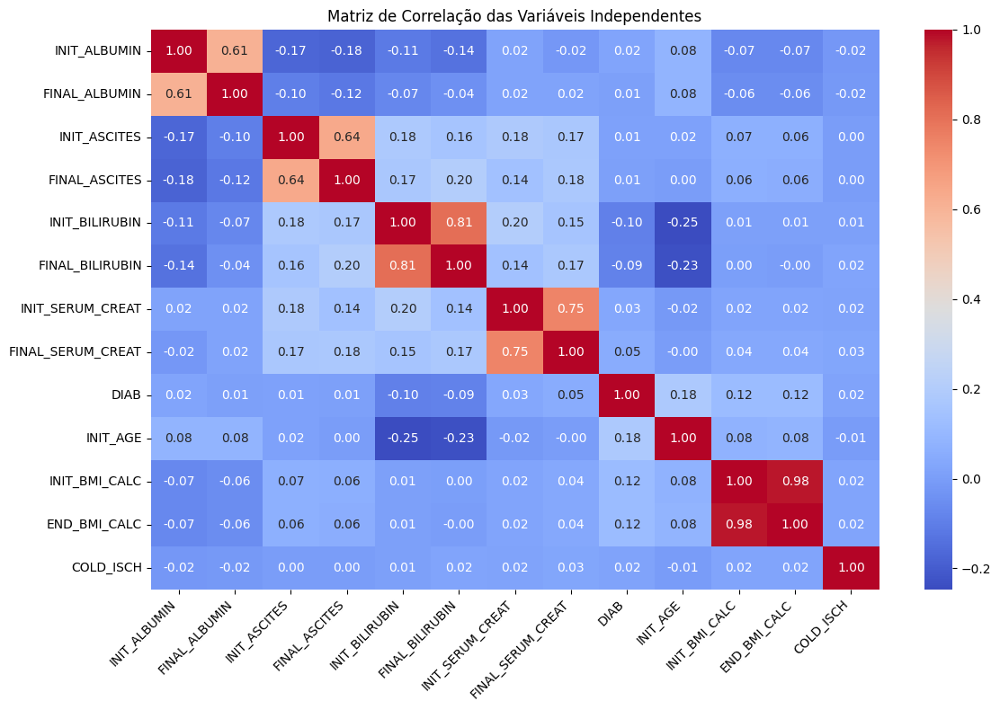

In [ ]:
# Calcular a matriz de correlação
correlacao = X.corr()

# Criar o gráfico da matriz de correlação
plt.figure(figsize=(12, 8))
sns.heatmap(correlacao, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Matriz de Correlação das Variáveis Independentes")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Exibir o gráfico
plt.show()

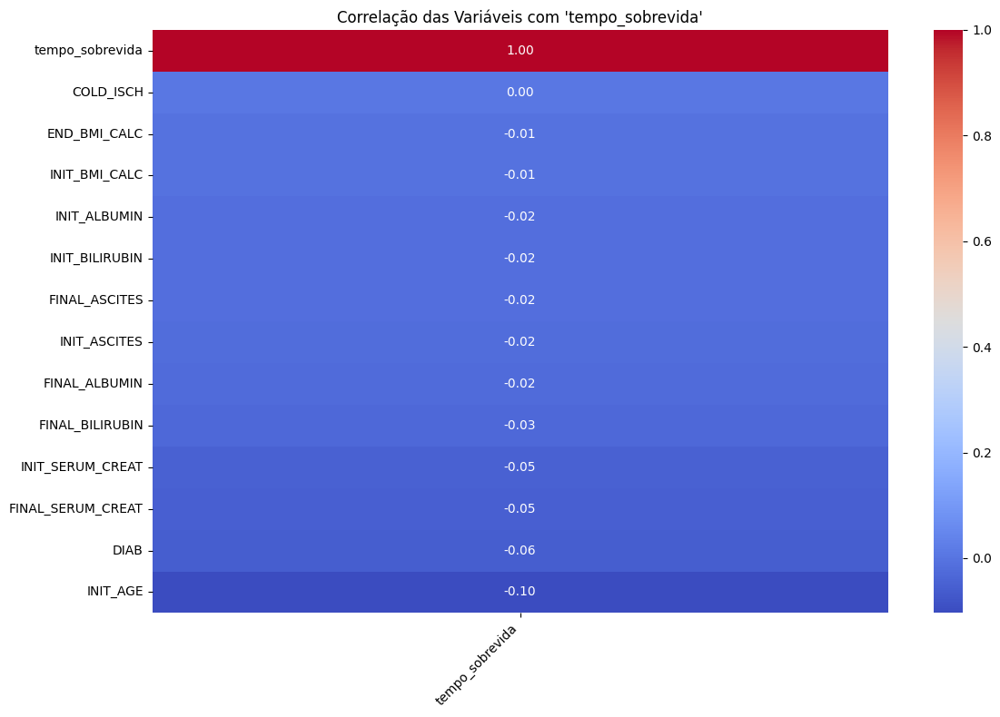

In [ ]:
# Adicionar a variável dependente
variaveis = variaveis_independentes + ["tempo_sobrevida"]

# Selecionar as variáveis no DataFrame
df_selecionado = df_pandas[variaveis]

# Calcular a matriz de correlação
correlacao = df_selecionado.corr()

# Criar o gráfico da matriz de correlação
plt.figure(figsize=(12, 8))
sns.heatmap(correlacao[["tempo_sobrevida"]].sort_values(by="tempo_sobrevida", ascending=False),
            annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Correlação das Variáveis com 'tempo_sobrevida'")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Exibir o gráfico
plt.show()

# Regressão logistica simples

## Com SMOTE


Analisando a variável: INIT_ALBUMIN
Distribuição de classes antes do SMOTE para INIT_ALBUMIN:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para INIT_ALBUMIN:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.92      0.54      0.68     17058
           1       0.11      0.53      0.18      1777

    accuracy                           0.54     18835
   macro avg       0.51      0.53      0.43     18835
weighted avg       0.84      0.54      0.63     18835

Matriz de Confusão:
 [[9149 7909]
 [ 838  939]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


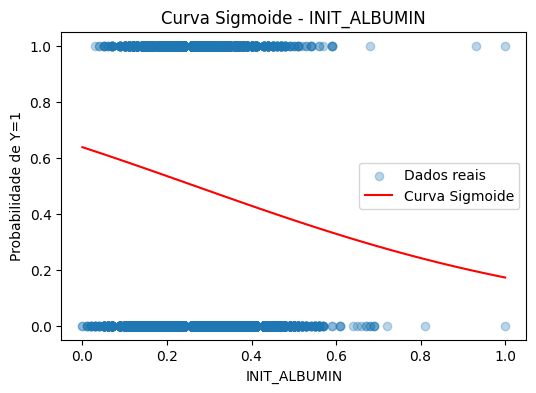

Analisando a variável: FINAL_ALBUMIN
Distribuição de classes antes do SMOTE para FINAL_ALBUMIN:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para FINAL_ALBUMIN:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      0.49      0.64     17058
           1       0.10      0.54      0.17      1777

    accuracy                           0.49     18835
   macro avg       0.50      0.51      0.40     18835
weighted avg       0.83      0.49      0.59     18835

Matriz de Confusão:
 [[8328 8730]
 [ 820  957]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


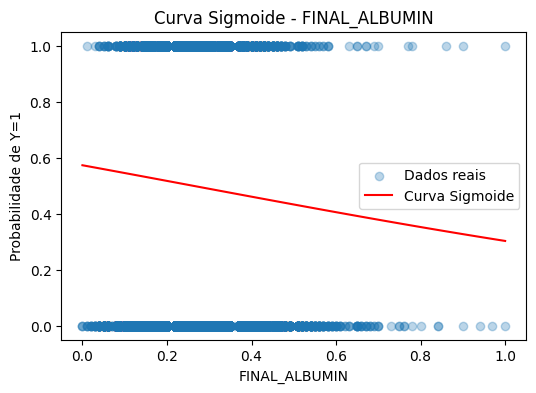

Analisando a variável: INIT_ASCITES
Distribuição de classes antes do SMOTE para INIT_ASCITES:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para INIT_ASCITES:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      0.76      0.83     17058
           1       0.11      0.29      0.16      1777

    accuracy                           0.72     18835
   macro avg       0.51      0.53      0.50     18835
weighted avg       0.84      0.72      0.77     18835

Matriz de Confusão:
 [[13034  4024]
 [ 1266   511]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


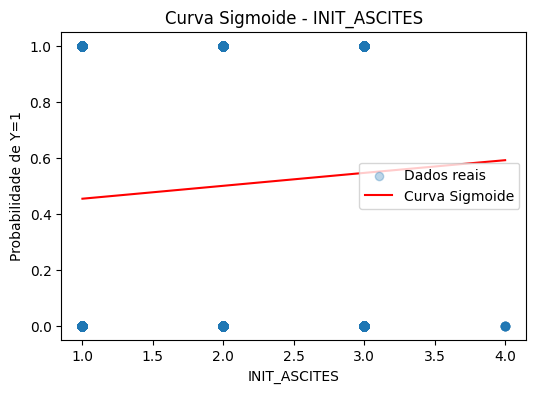

Analisando a variável: FINAL_ASCITES
Distribuição de classes antes do SMOTE para FINAL_ASCITES:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para FINAL_ASCITES:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      0.72      0.80     17058
           1       0.12      0.36      0.17      1777

    accuracy                           0.68     18835
   macro avg       0.52      0.54      0.49     18835
weighted avg       0.84      0.68      0.74     18835

Matriz de Confusão:
 [[12201  4857]
 [ 1142   635]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


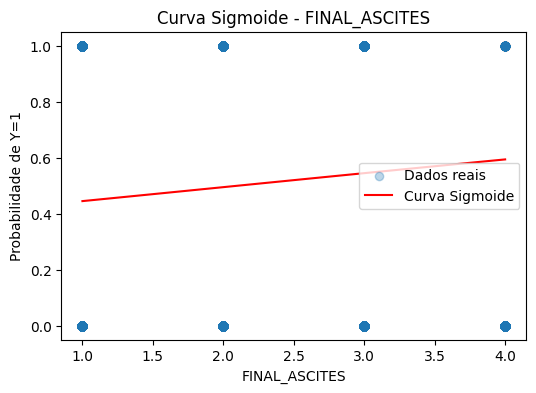

Analisando a variável: INIT_BILIRUBIN
Distribuição de classes antes do SMOTE para INIT_BILIRUBIN:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para INIT_BILIRUBIN:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.92      0.77      0.84     17058
           1       0.13      0.32      0.18      1777

    accuracy                           0.73     18835
   macro avg       0.52      0.55      0.51     18835
weighted avg       0.84      0.73      0.77     18835

Matriz de Confusão:
 [[13095  3963]
 [ 1204   573]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


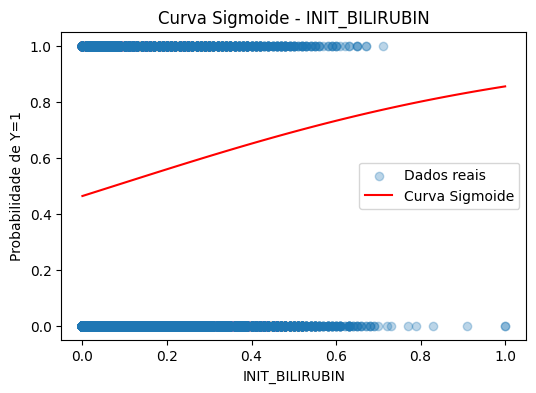

Analisando a variável: FINAL_BILIRUBIN
Distribuição de classes antes do SMOTE para FINAL_BILIRUBIN:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para FINAL_BILIRUBIN:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.92      0.75      0.83     17058
           1       0.13      0.36      0.19      1777

    accuracy                           0.71     18835
   macro avg       0.52      0.56      0.51     18835
weighted avg       0.84      0.71      0.77     18835

Matriz de Confusão:
 [[12828  4230]
 [ 1139   638]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


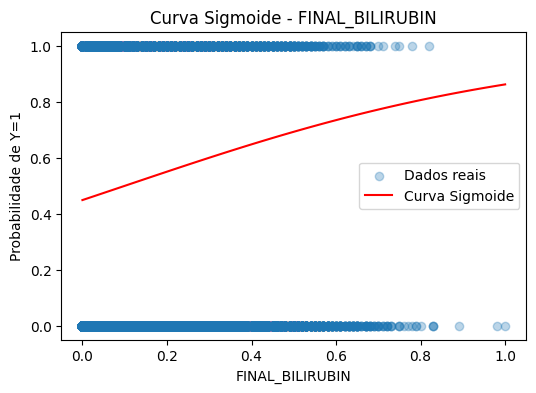

Analisando a variável: INIT_SERUM_CREAT
Distribuição de classes antes do SMOTE para INIT_SERUM_CREAT:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para INIT_SERUM_CREAT:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.92      0.77      0.84     17058
           1       0.13      0.33      0.19      1777

    accuracy                           0.73     18835
   macro avg       0.52      0.55      0.51     18835
weighted avg       0.84      0.73      0.77     18835

Matriz de Confusão:
 [[13104  3954]
 [ 1189   588]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


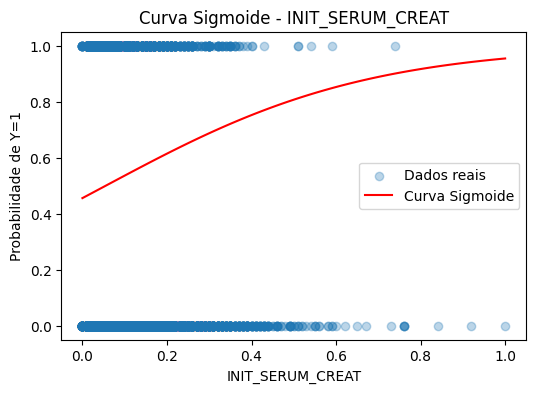

Analisando a variável: FINAL_SERUM_CREAT
Distribuição de classes antes do SMOTE para FINAL_SERUM_CREAT:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para FINAL_SERUM_CREAT:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.92      0.77      0.83     17058
           1       0.13      0.34      0.19      1777

    accuracy                           0.73     18835
   macro avg       0.52      0.55      0.51     18835
weighted avg       0.84      0.73      0.77     18835

Matriz de Confusão:
 [[13061  3997]
 [ 1176   601]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


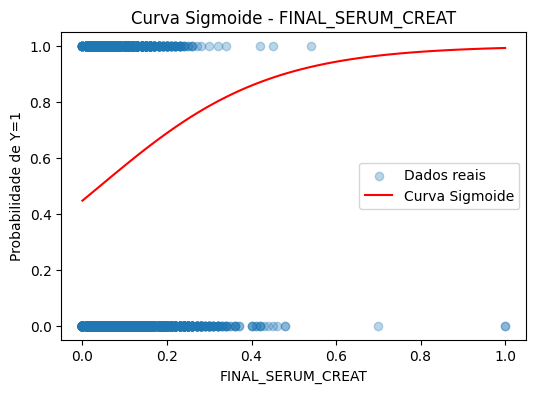

Analisando a variável: CREAT_DON
Distribuição de classes antes do SMOTE para CREAT_DON:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para CREAT_DON:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      0.73      0.81     17058
           1       0.10      0.28      0.14      1777

    accuracy                           0.68     18835
   macro avg       0.50      0.50      0.48     18835
weighted avg       0.83      0.68      0.74     18835

Matriz de Confusão:
 [[12393  4665]
 [ 1277   500]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


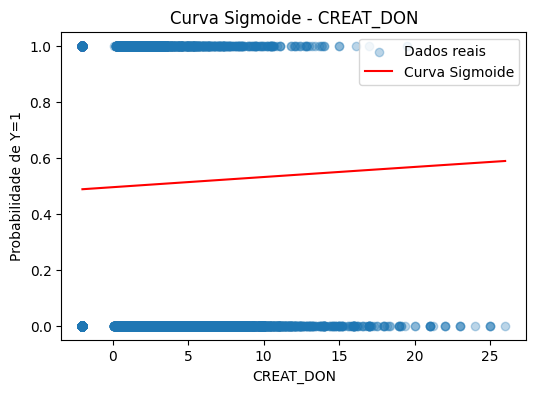

Analisando a variável: DIAB
Distribuição de classes antes do SMOTE para DIAB:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para DIAB:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      0.74      0.82     17058
           1       0.10      0.28      0.15      1777

    accuracy                           0.70     18835
   macro avg       0.50      0.51      0.48     18835
weighted avg       0.83      0.70      0.75     18835

Matriz de Confusão:
 [[12613  4445]
 [ 1277   500]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


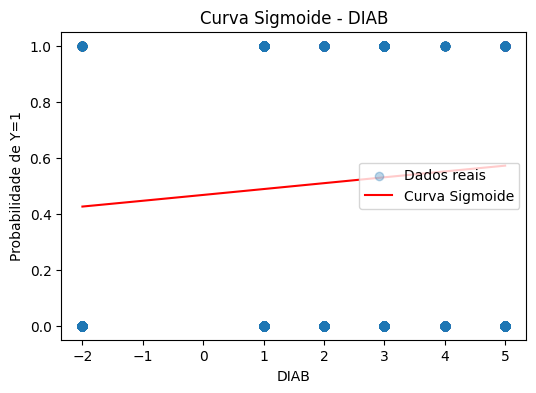

Analisando a variável: DIABETES_DON
Distribuição de classes antes do SMOTE para DIABETES_DON:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para DIABETES_DON:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      0.89      0.90     17058
           1       0.10      0.11      0.10      1777

    accuracy                           0.82     18835
   macro avg       0.50      0.50      0.50     18835
weighted avg       0.83      0.82      0.82     18835

Matriz de Confusão:
 [[15263  1795]
 [ 1586   191]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


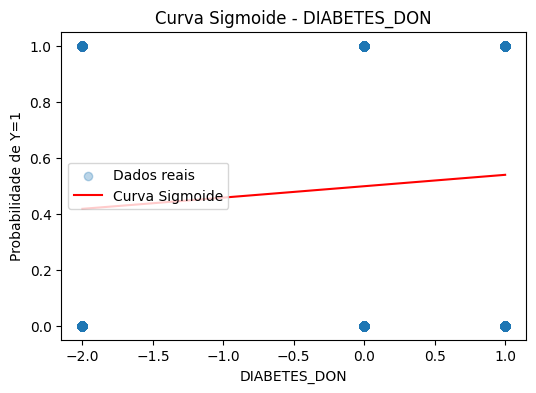

Analisando a variável: HIST_INSULIN_DEP_DON
Distribuição de classes antes do SMOTE para HIST_INSULIN_DEP_DON:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para HIST_INSULIN_DEP_DON:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      0.90      0.90     17058
           1       0.10      0.10      0.10      1777

    accuracy                           0.82     18835
   macro avg       0.50      0.50      0.50     18835
weighted avg       0.83      0.82      0.83     18835

Matriz de Confusão:
 [[15351  1707]
 [ 1597   180]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


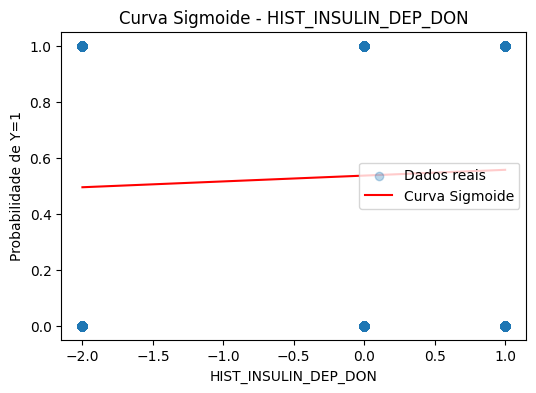

Analisando a variável: INIT_DIALYSIS_PRIOR_WEEK
Distribuição de classes antes do SMOTE para INIT_DIALYSIS_PRIOR_WEEK:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para INIT_DIALYSIS_PRIOR_WEEK:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      0.93      0.92     17058
           1       0.16      0.12      0.13      1777

    accuracy                           0.86     18835
   macro avg       0.53      0.53      0.53     18835
weighted avg       0.84      0.86      0.85     18835

Matriz de Confusão:
 [[15942  1116]
 [ 1568   209]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


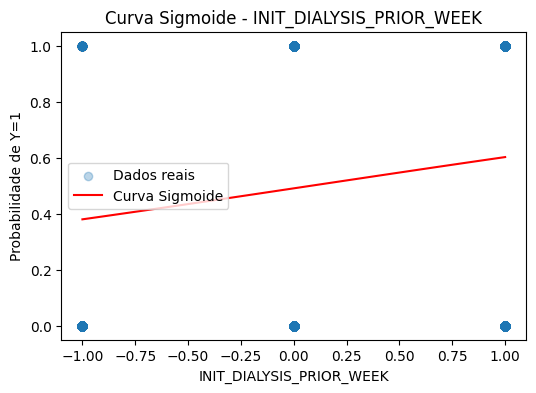

Analisando a variável: FINAL_DIALYSIS_PRIOR_WEEK
Distribuição de classes antes do SMOTE para FINAL_DIALYSIS_PRIOR_WEEK:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para FINAL_DIALYSIS_PRIOR_WEEK:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      0.87      0.89     17058
           1       0.15      0.22      0.18      1777

    accuracy                           0.81     18835
   macro avg       0.53      0.55      0.54     18835
weighted avg       0.84      0.81      0.83     18835

Matriz de Confusão:
 [[14918  2140]
 [ 1386   391]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


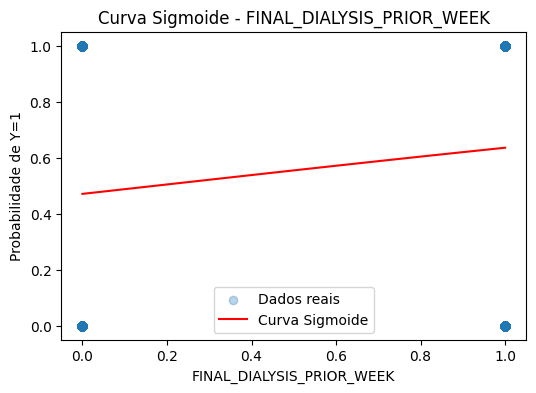

Analisando a variável: INIT_ENCEPH
Distribuição de classes antes do SMOTE para INIT_ENCEPH:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para INIT_ENCEPH:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.92      0.41      0.57     17058
           1       0.10      0.64      0.18      1777

    accuracy                           0.43     18835
   macro avg       0.51      0.53      0.37     18835
weighted avg       0.84      0.43      0.53     18835

Matriz de Confusão:
 [[ 6970 10088]
 [  633  1144]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


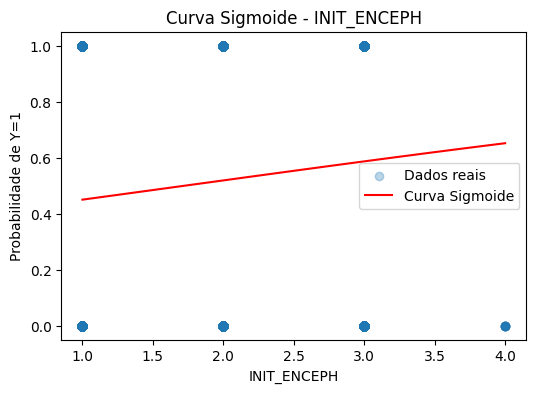

Analisando a variável: FINAL_ENCEPH
Distribuição de classes antes do SMOTE para FINAL_ENCEPH:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para FINAL_ENCEPH:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.92      0.37      0.53     17058
           1       0.10      0.70      0.18      1777

    accuracy                           0.40     18835
   macro avg       0.51      0.54      0.36     18835
weighted avg       0.84      0.40      0.50     18835

Matriz de Confusão:
 [[ 6372 10686]
 [  538  1239]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


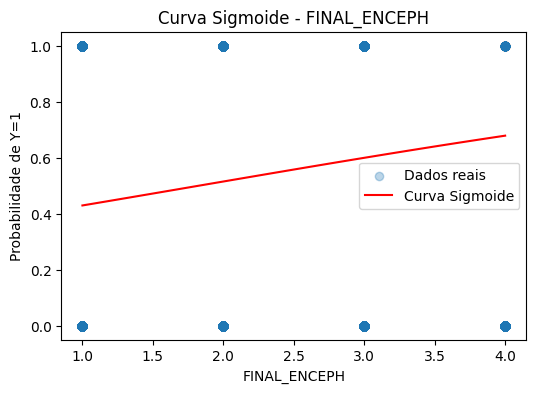

Analisando a variável: ETHCAT
Distribuição de classes antes do SMOTE para ETHCAT:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para ETHCAT:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.90      0.28      0.43     17058
           1       0.09      0.71      0.16      1777

    accuracy                           0.32     18835
   macro avg       0.50      0.50      0.30     18835
weighted avg       0.83      0.32      0.40     18835

Matriz de Confusão:
 [[ 4800 12258]
 [  516  1261]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


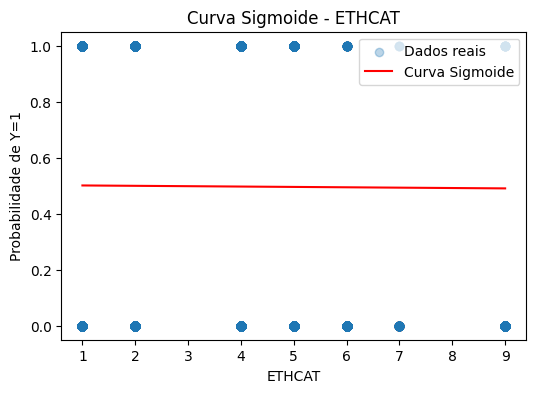

Analisando a variável: ETHCAT_DON
Distribuição de classes antes do SMOTE para ETHCAT_DON:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para ETHCAT_DON:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      0.66      0.76     17058
           1       0.10      0.35      0.15      1777

    accuracy                           0.63     18835
   macro avg       0.50      0.50      0.46     18835
weighted avg       0.83      0.63      0.71     18835

Matriz de Confusão:
 [[11273  5785]
 [ 1160   617]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


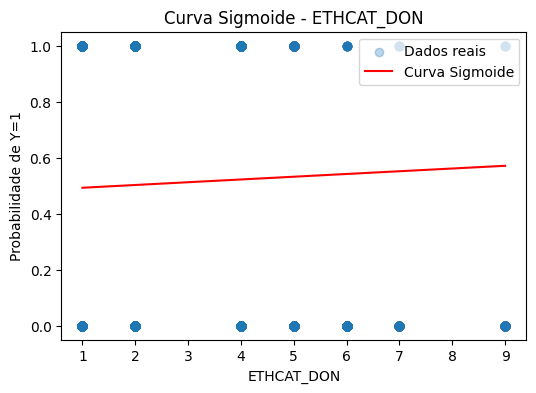

Analisando a variável: GENDER
Distribuição de classes antes do SMOTE para GENDER:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para GENDER:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      0.67      0.77     17058
           1       0.10      0.36      0.16      1777

    accuracy                           0.64     18835
   macro avg       0.51      0.51      0.46     18835
weighted avg       0.83      0.64      0.71     18835

Matriz de Confusão:
 [[11360  5698]
 [ 1131   646]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


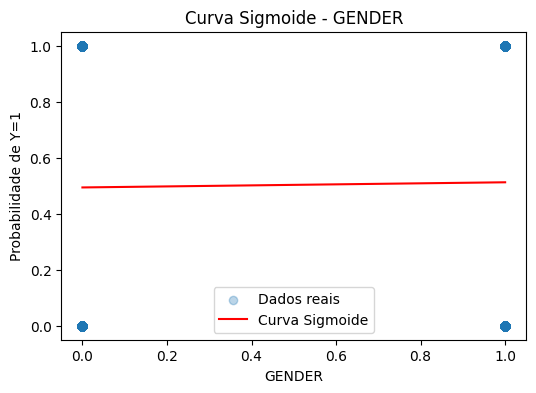

Analisando a variável: GENDER_DON
Distribuição de classes antes do SMOTE para GENDER_DON:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para GENDER_DON:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      0.60      0.72     17058
           1       0.09      0.40      0.15      1777

    accuracy                           0.58     18835
   macro avg       0.50      0.50      0.44     18835
weighted avg       0.83      0.58      0.67     18835

Matriz de Confusão:
 [[10182  6876]
 [ 1058   719]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


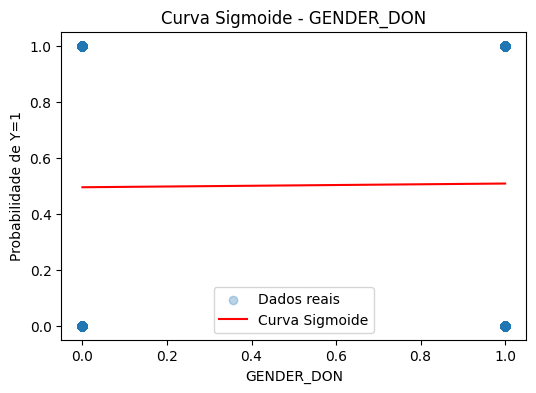

Analisando a variável: INIT_AGE
Distribuição de classes antes do SMOTE para INIT_AGE:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para INIT_AGE:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      0.45      0.60     17058
           1       0.10      0.59      0.17      1777

    accuracy                           0.46     18835
   macro avg       0.51      0.52      0.39     18835
weighted avg       0.84      0.46      0.56     18835

Matriz de Confusão:
 [[7622 9436]
 [ 732 1045]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


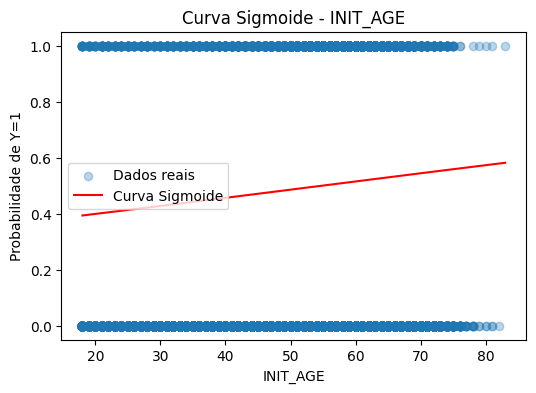

Analisando a variável: AGE_DON
Distribuição de classes antes do SMOTE para AGE_DON:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para AGE_DON:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      0.51      0.65     17058
           1       0.10      0.52      0.17      1777

    accuracy                           0.51     18835
   macro avg       0.51      0.52      0.41     18835
weighted avg       0.83      0.51      0.61     18835

Matriz de Confusão:
 [[8707 8351]
 [ 848  929]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


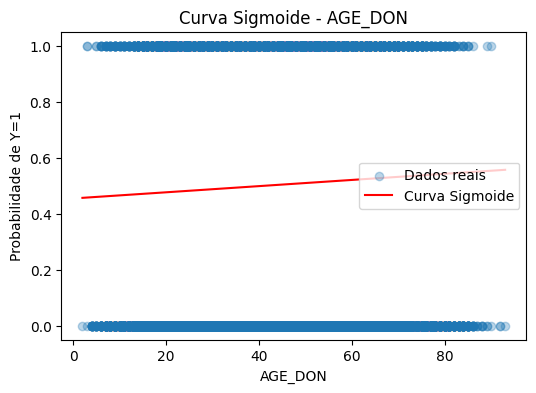

Analisando a variável: DGN_TCR
Distribuição de classes antes do SMOTE para DGN_TCR:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para DGN_TCR:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      0.95      0.93     17058
           1       0.17      0.10      0.13      1777

    accuracy                           0.87     18835
   macro avg       0.54      0.52      0.53     18835
weighted avg       0.84      0.87      0.85     18835

Matriz de Confusão:
 [[16221   837]
 [ 1602   175]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


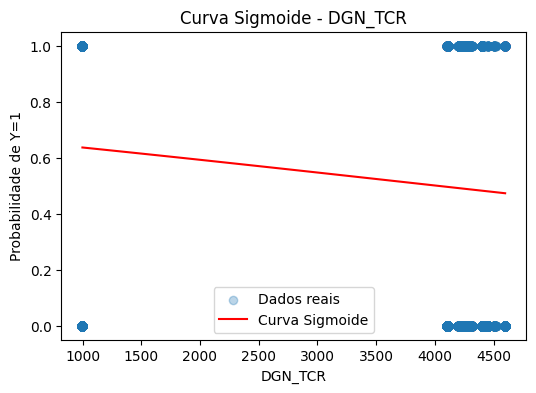

Analisando a variável: INIT_BMI_CALC
Distribuição de classes antes do SMOTE para INIT_BMI_CALC:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para INIT_BMI_CALC:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      0.46      0.61     17058
           1       0.10      0.57      0.17      1777

    accuracy                           0.47     18835
   macro avg       0.51      0.51      0.39     18835
weighted avg       0.83      0.47      0.57     18835

Matriz de Confusão:
 [[7766 9292]
 [ 757 1020]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


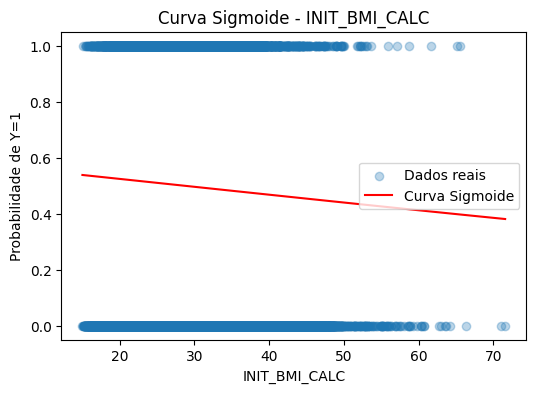

Analisando a variável: END_BMI_CALC
Distribuição de classes antes do SMOTE para END_BMI_CALC:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para END_BMI_CALC:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      0.46      0.61     17058
           1       0.10      0.57      0.17      1777

    accuracy                           0.47     18835
   macro avg       0.51      0.51      0.39     18835
weighted avg       0.83      0.47      0.57     18835

Matriz de Confusão:
 [[7898 9160]
 [ 771 1006]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


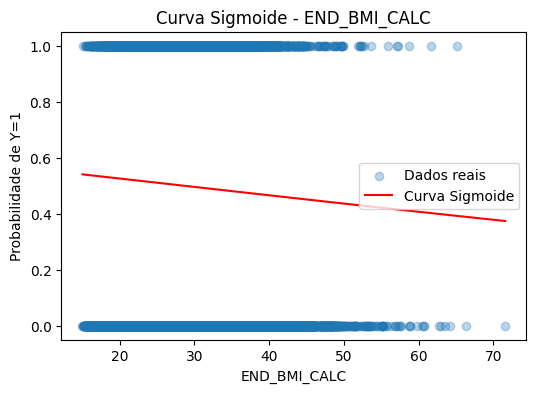

Analisando a variável: BMI_DON_CALC
Distribuição de classes antes do SMOTE para BMI_DON_CALC:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para BMI_DON_CALC:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.90      0.57      0.70     17058
           1       0.09      0.41      0.15      1777

    accuracy                           0.56     18835
   macro avg       0.50      0.49      0.42     18835
weighted avg       0.83      0.56      0.65     18835

Matriz de Confusão:
 [[9726 7332]
 [1042  735]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


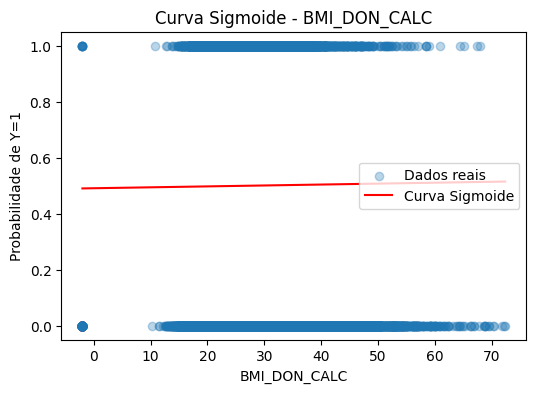

Analisando a variável: INIT_INR
Distribuição de classes antes do SMOTE para INIT_INR:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para INIT_INR:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      0.78      0.84     17058
           1       0.12      0.30      0.17      1777

    accuracy                           0.73     18835
   macro avg       0.52      0.54      0.51     18835
weighted avg       0.84      0.73      0.78     18835

Matriz de Confusão:
 [[13231  3827]
 [ 1242   535]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


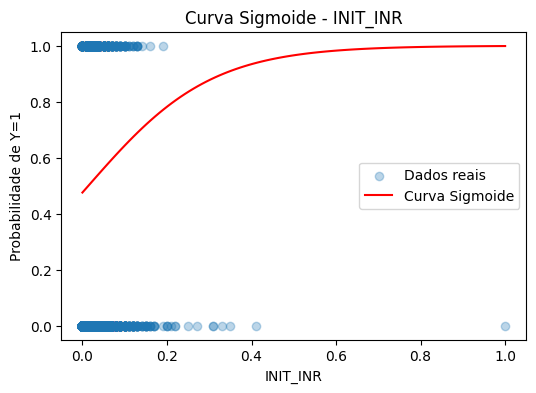

Analisando a variável: FINAL_INR
Distribuição de classes antes do SMOTE para FINAL_INR:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para FINAL_INR:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.92      0.68      0.78     17058
           1       0.12      0.41      0.18      1777

    accuracy                           0.65     18835
   macro avg       0.52      0.54      0.48     18835
weighted avg       0.84      0.65      0.72     18835

Matriz de Confusão:
 [[11517  5541]
 [ 1046   731]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


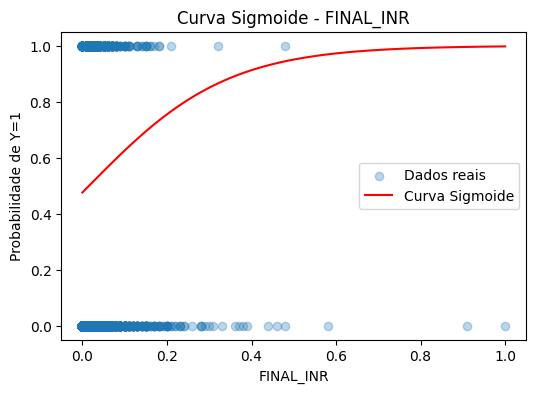

Analisando a variável: INIT_MELD_PELD_LAB_SCORE
Distribuição de classes antes do SMOTE para INIT_MELD_PELD_LAB_SCORE:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para INIT_MELD_PELD_LAB_SCORE:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.92      0.64      0.75     17058
           1       0.12      0.47      0.19      1777

    accuracy                           0.62     18835
   macro avg       0.52      0.56      0.47     18835
weighted avg       0.85      0.62      0.70     18835

Matriz de Confusão:
 [[10908  6150]
 [  935   842]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


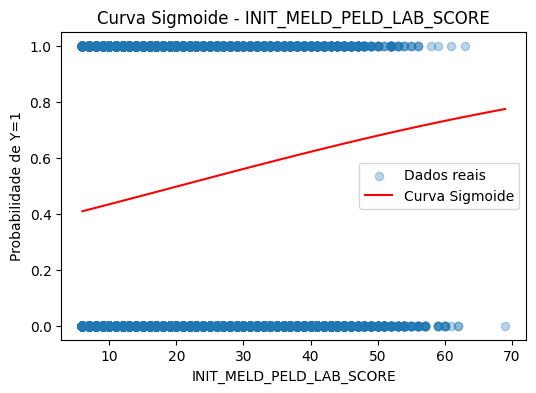

Analisando a variável: FINAL_MELD_PELD_LAB_SCORE
Distribuição de classes antes do SMOTE para FINAL_MELD_PELD_LAB_SCORE:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para FINAL_MELD_PELD_LAB_SCORE:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.93      0.60      0.73     17058
           1       0.13      0.56      0.21      1777

    accuracy                           0.59     18835
   macro avg       0.53      0.58      0.47     18835
weighted avg       0.85      0.59      0.68     18835

Matriz de Confusão:
 [[10156  6902]
 [  785   992]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


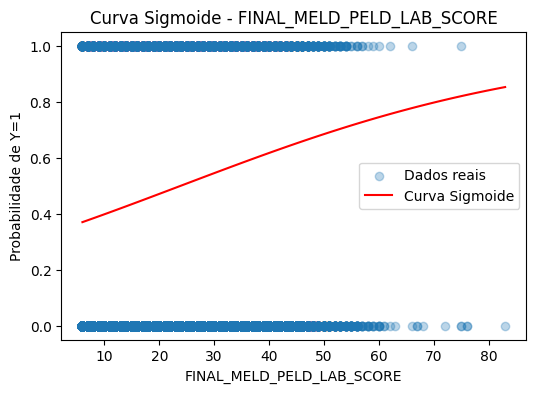

Analisando a variável: INIT_SERUM_SODIUM
Distribuição de classes antes do SMOTE para INIT_SERUM_SODIUM:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para INIT_SERUM_SODIUM:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

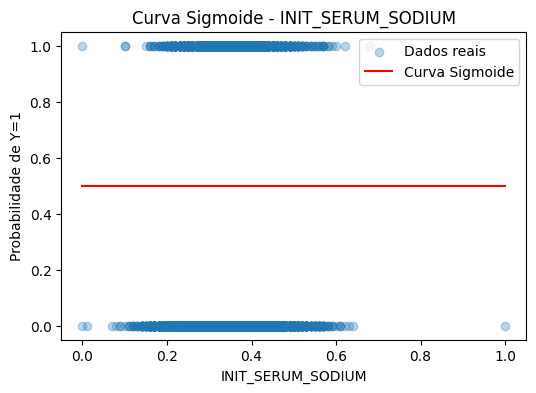

Analisando a variável: FINAL_SERUM_SODIUM
Distribuição de classes antes do SMOTE para FINAL_SERUM_SODIUM:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para FINAL_SERUM_SODIUM:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      0.50      0.64     17058
           1       0.10      0.53      0.17      1777

    accuracy                           0.50     18835
   macro avg       0.51      0.51      0.40     18835
weighted avg       0.83      0.50      0.60     18835

Matriz de Confusão:
 [[8449 8609]
 [ 828  949]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


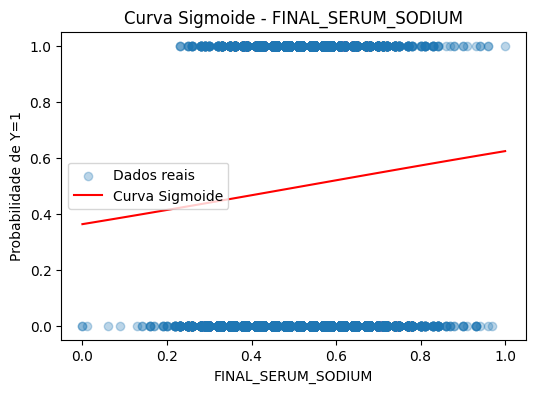

Analisando a variável: PREV_TX
Distribuição de classes antes do SMOTE para PREV_TX:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para PREV_TX:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      0.94      0.93     17058
           1       0.23      0.15      0.18      1777

    accuracy                           0.87     18835
   macro avg       0.57      0.55      0.56     18835
weighted avg       0.85      0.87      0.86     18835

Matriz de Confusão:
 [[16118   940]
 [ 1502   275]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


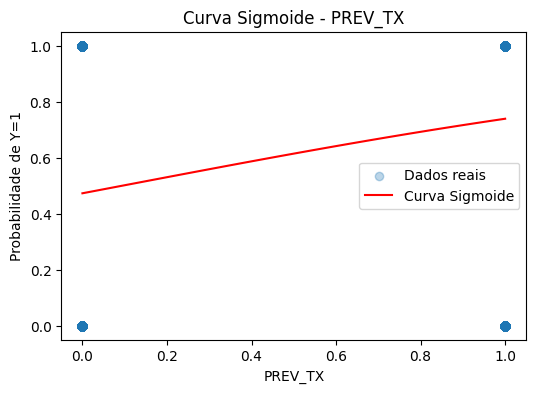

Analisando a variável: PREV_TX_ANY
Distribuição de classes antes do SMOTE para PREV_TX_ANY:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para PREV_TX_ANY:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.92      0.94      0.93     17058
           1       0.22      0.17      0.19      1777

    accuracy                           0.87     18835
   macro avg       0.57      0.55      0.56     18835
weighted avg       0.85      0.87      0.86     18835

Matriz de Confusão:
 [[16038  1020]
 [ 1481   296]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


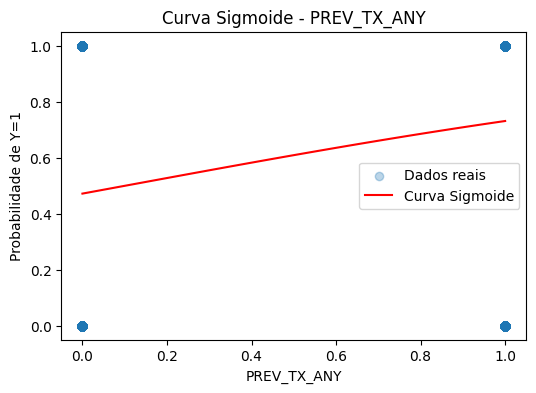

Analisando a variável: NUM_PREV_TX
Distribuição de classes antes do SMOTE para NUM_PREV_TX:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para NUM_PREV_TX:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      0.94      0.93     17058
           1       0.22      0.16      0.18      1777

    accuracy                           0.87     18835
   macro avg       0.57      0.55      0.56     18835
weighted avg       0.85      0.87      0.86     18835

Matriz de Confusão:
 [[16062   996]
 [ 1499   278]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


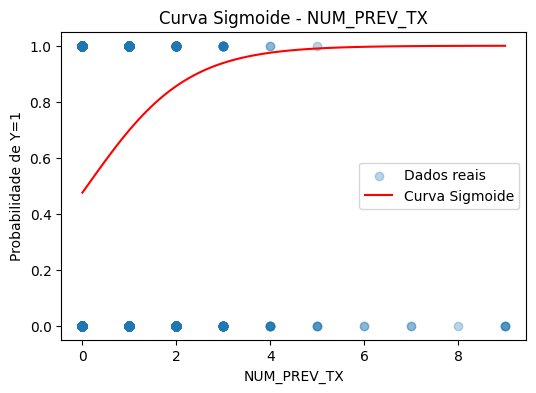

Analisando a variável: COD_CAD_DON
Distribuição de classes antes do SMOTE para COD_CAD_DON:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para COD_CAD_DON:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      0.31      0.46     17058
           1       0.10      0.72      0.17      1777

    accuracy                           0.35     18835
   macro avg       0.51      0.51      0.32     18835
weighted avg       0.84      0.35      0.43     18835

Matriz de Confusão:
 [[ 5220 11838]
 [  497  1280]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


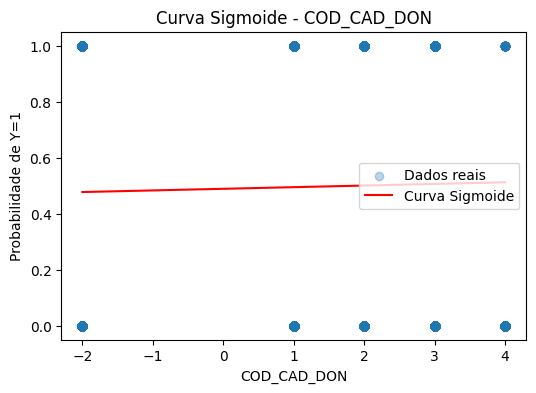

Analisando a variável: COLD_ISCH
Distribuição de classes antes do SMOTE para COLD_ISCH:
 Y
0    56939
1     5842
Name: count, dtype: int64
Distribuição de classes após o SMOTE para COLD_ISCH:
 Y
0    39881
1    39881
Name: count, dtype: int64
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      0.57      0.70     17058
           1       0.11      0.49      0.17      1777

    accuracy                           0.56     18835
   macro avg       0.51      0.53      0.44     18835
weighted avg       0.84      0.56      0.65     18835

Matriz de Confusão:
 [[9648 7410]
 [ 906  871]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


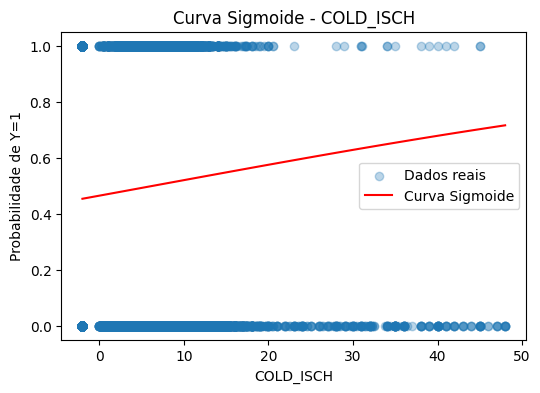

In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np


# Criando o DataFrame (caso ainda não esteja carregado)
df_pandas = pd.read_csv("/content/drive/MyDrive/2024-5/liver_data_normalizado2.csv")

# Criando o alvo binário baseado no tempo de sobrevida (exemplo: maior que 6 meses)
df_pandas["Y"] = (df_pandas["tempo_sobrevida"] <= 6).astype(int)  # 6 meses = 180 dias

# Variáveis independentes
variaveis_independentes = [
     "INIT_ALBUMIN", "FINAL_ALBUMIN", "INIT_ASCITES", "FINAL_ASCITES", "INIT_BILIRUBIN", "FINAL_BILIRUBIN",
    "INIT_SERUM_CREAT", "FINAL_SERUM_CREAT", "CREAT_DON", "DIAB", "DIABETES_DON", "HIST_INSULIN_DEP_DON",
    "INIT_DIALYSIS_PRIOR_WEEK", "FINAL_DIALYSIS_PRIOR_WEEK", "INIT_ENCEPH", "FINAL_ENCEPH", "ETHCAT",
    "ETHCAT_DON", "GENDER", "GENDER_DON", "INIT_AGE", "AGE_DON", "DGN_TCR", "INIT_BMI_CALC", "END_BMI_CALC",
    "BMI_DON_CALC", "INIT_INR", "FINAL_INR", "INIT_MELD_PELD_LAB_SCORE", "FINAL_MELD_PELD_LAB_SCORE",
    "INIT_SERUM_SODIUM", "FINAL_SERUM_SODIUM", "PREV_TX", "PREV_TX_ANY", "NUM_PREV_TX", "COD_CAD_DON", "COLD_ISCH"
]

# Loop para criar uma regressão logística simples para cada variável
for var in variaveis_independentes:
    print(f"Analisando a variável: {var}")

    # Selecionando a variável independente
    X = df_pandas[[var]].dropna()
    y = df_pandas.loc[X.index, "Y"]

    # Verificando a distribuição de classes antes do SMOTE
    print(f"Distribuição de classes antes do SMOTE para {var}:\n", y.value_counts())

    # Dividindo os dados em treino e teste
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # Aplicando o SMOTE para fazer oversampling nos dados de treino
    smote = SMOTE(random_state=42)
    X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

    # Verificando a distribuição de classes após o SMOTE
    print(f"Distribuição de classes após o SMOTE para {var}:\n", y_train_res.value_counts())

    # Criando o modelo de regressão logística
    logistic_model = LogisticRegression(max_iter=1000, random_state=42)
    logistic_model.fit(X_train_res, y_train_res)

    # Avaliação do modelo
    y_pred = logistic_model.predict(X_test)
    print("Relatório de Classificação:\n", classification_report(y_test, y_pred))
    print("Matriz de Confusão:\n", confusion_matrix(y_test, y_pred))

    # Criando curva sigmoide
    X_values = np.linspace(X[var].min(), X[var].max(), 100).reshape(-1, 1)
    y_prob = logistic_model.predict_proba(X_values)[:, 1]

    plt.figure(figsize=(6, 4))
    plt.scatter(X[var], y, alpha=0.3, label="Dados reais")
    plt.plot(X_values, y_prob, color='red', label="Curva Sigmoide")
    plt.xlabel(var)
    plt.ylabel("Probabilidade de Y=1")
    plt.title(f"Curva Sigmoide - {var}")
    plt.legend()
    plt.show()


## Sem SMOTE


Analisando a variável: INIT_ALBUMIN
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

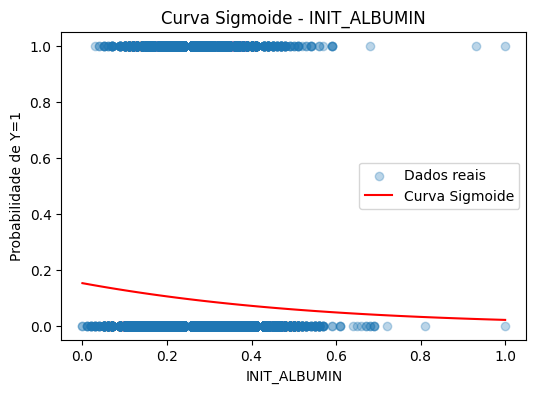

Analisando a variável: FINAL_ALBUMIN


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


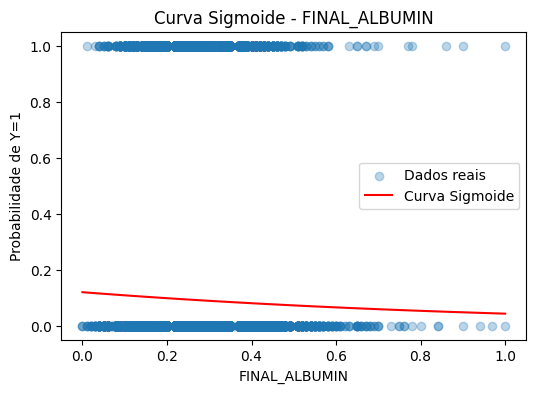

Analisando a variável: INIT_ASCITES
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

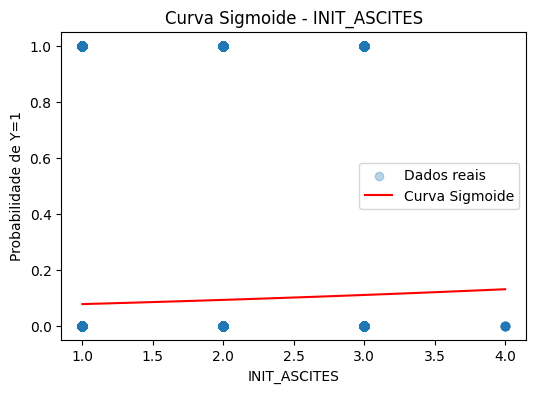

Analisando a variável: FINAL_ASCITES
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

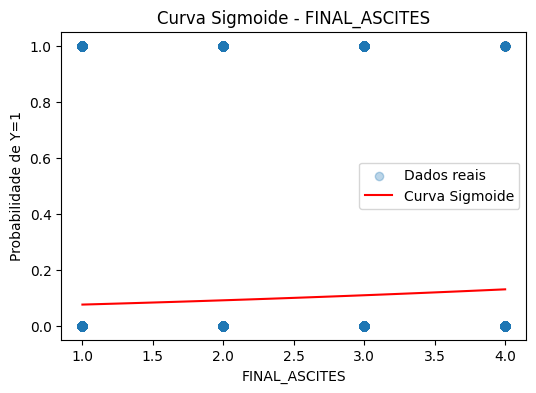

Analisando a variável: INIT_BILIRUBIN
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

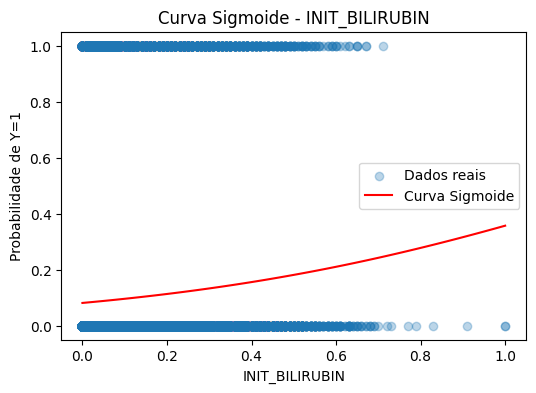

Analisando a variável: FINAL_BILIRUBIN


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


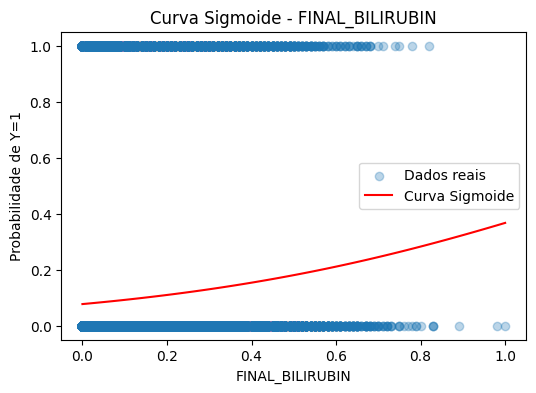

Analisando a variável: INIT_SERUM_CREAT
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17057     1]
 [ 1777     0]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


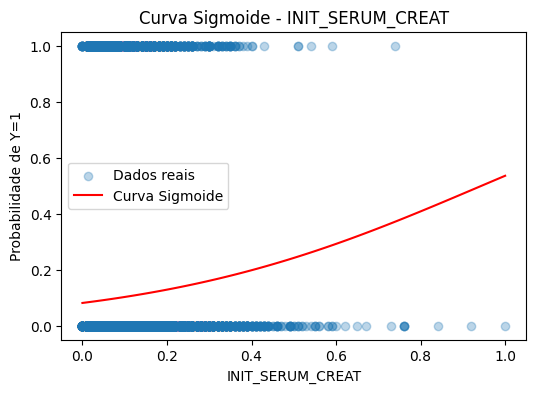

Analisando a variável: FINAL_SERUM_CREAT
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17057     1]
 [ 1777     0]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


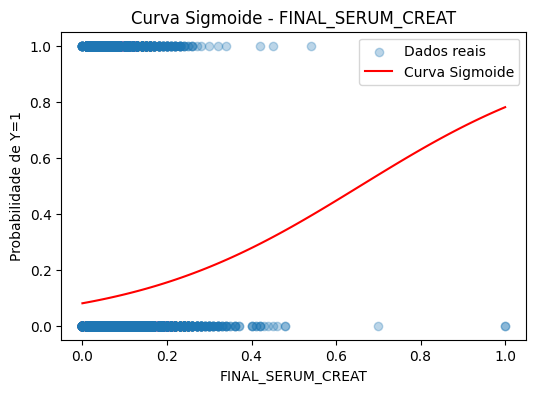

Analisando a variável: CREAT_DON
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

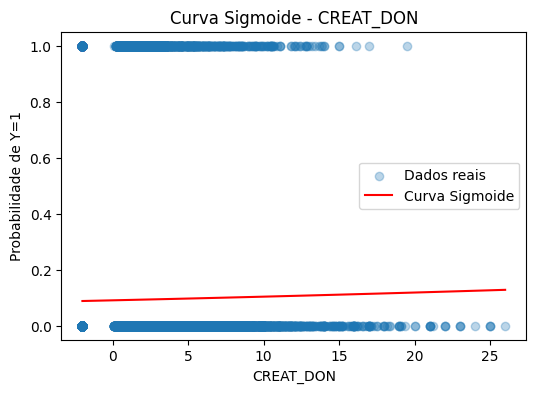

Analisando a variável: DIAB
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

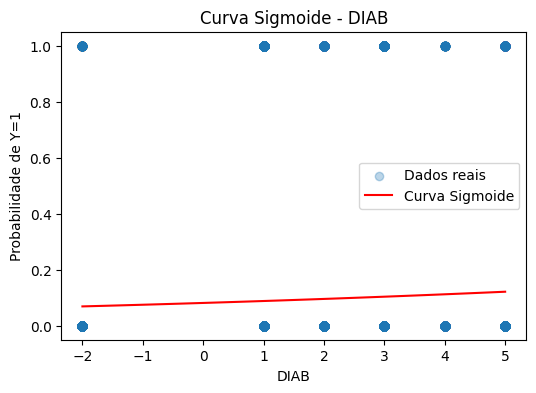

Analisando a variável: DIABETES_DON
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

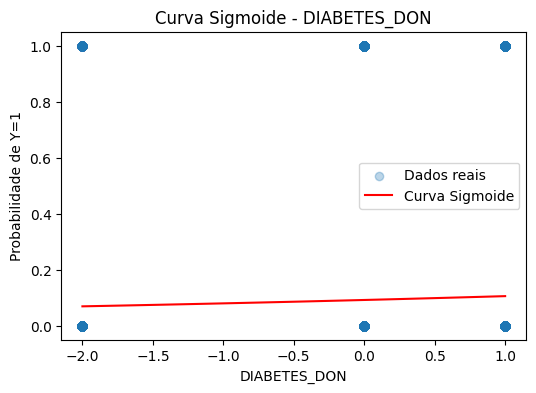

Analisando a variável: HIST_INSULIN_DEP_DON
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

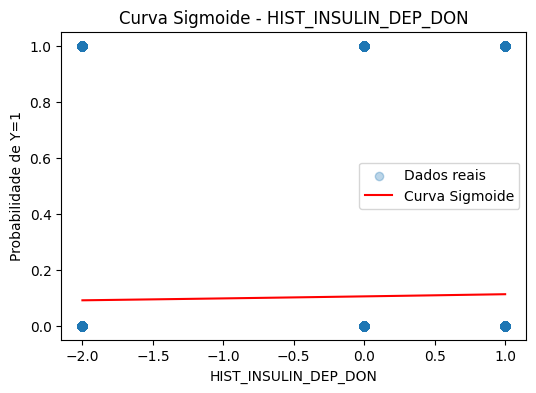

Analisando a variável: INIT_DIALYSIS_PRIOR_WEEK
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

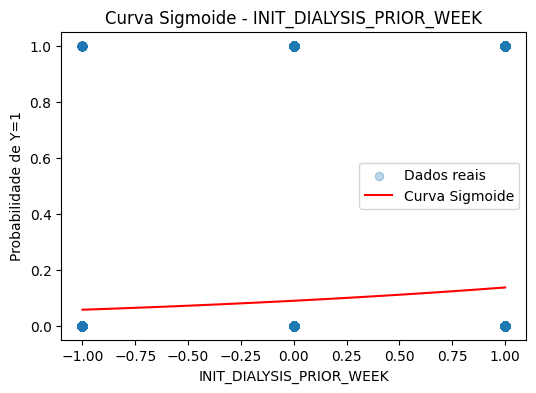

Analisando a variável: FINAL_DIALYSIS_PRIOR_WEEK
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

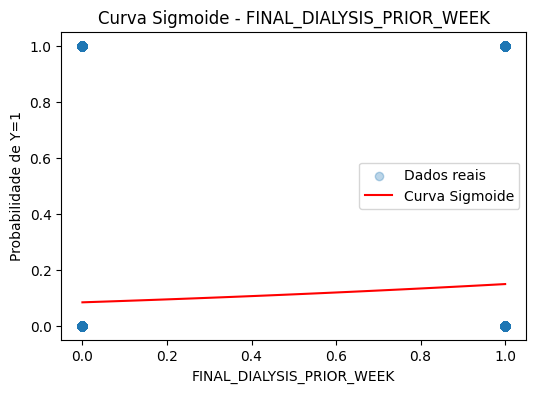

Analisando a variável: INIT_ENCEPH
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

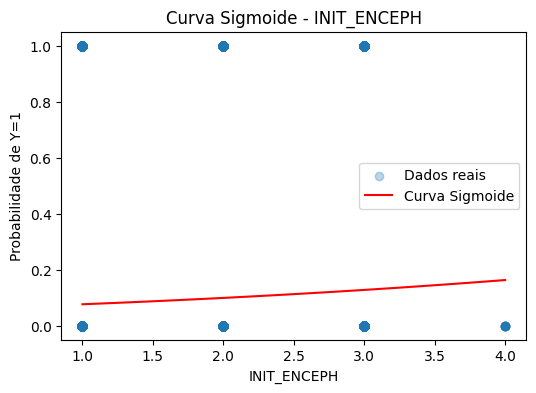

Analisando a variável: FINAL_ENCEPH
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

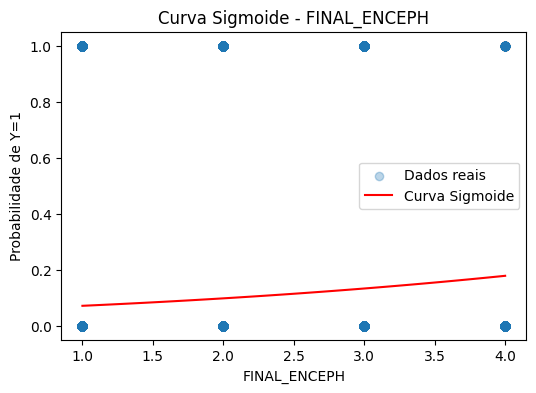

Analisando a variável: ETHCAT
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

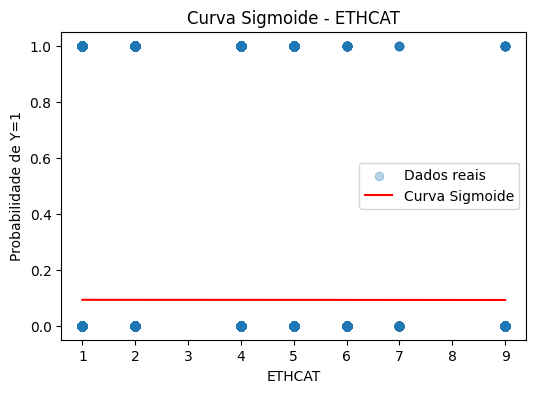

Analisando a variável: ETHCAT_DON
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

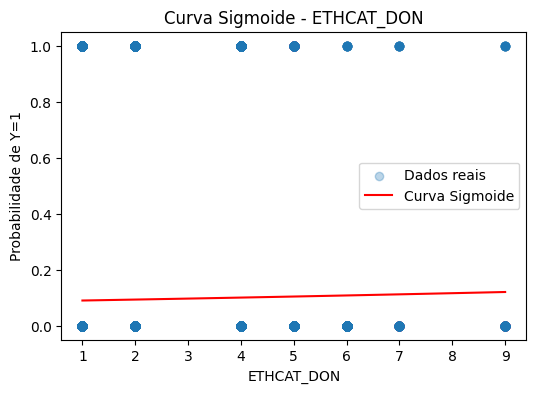

Analisando a variável: GENDER
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

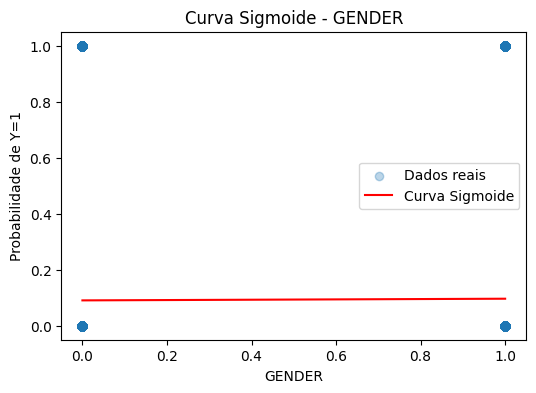

Analisando a variável: GENDER_DON
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

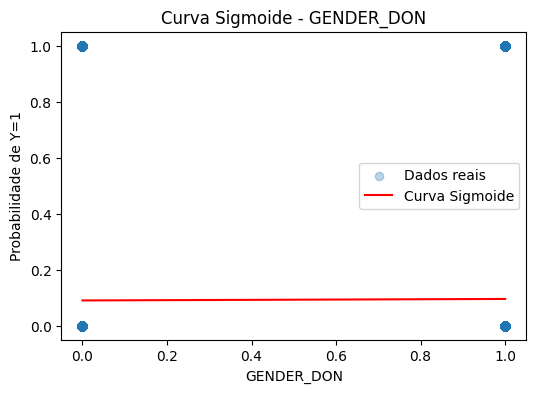

Analisando a variável: INIT_AGE
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

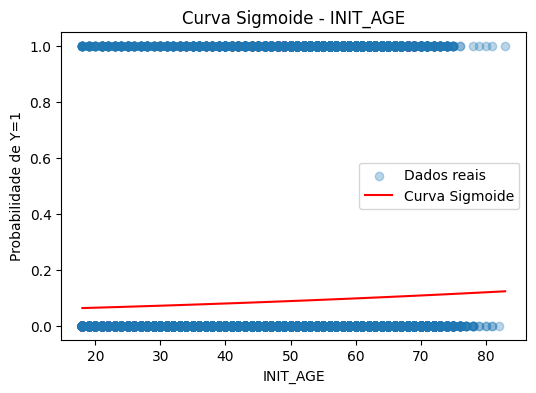

Analisando a variável: AGE_DON
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

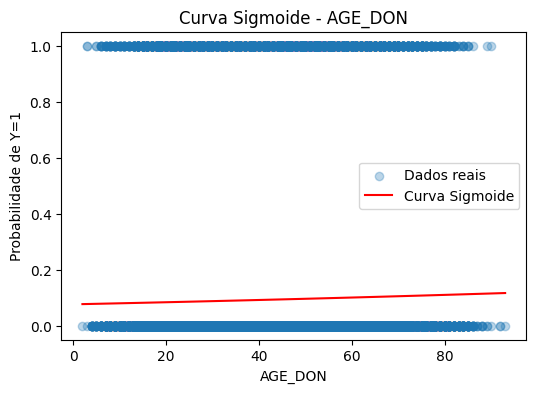

Analisando a variável: DGN_TCR


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


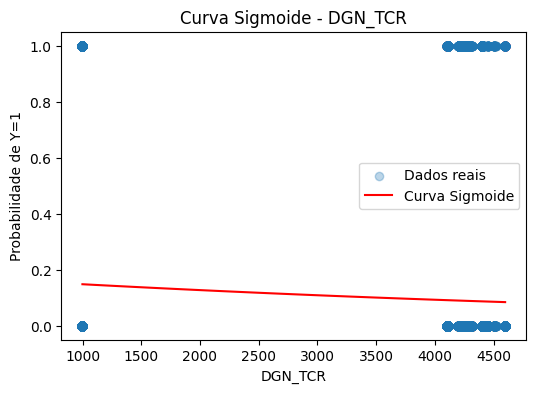

Analisando a variável: INIT_BMI_CALC
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

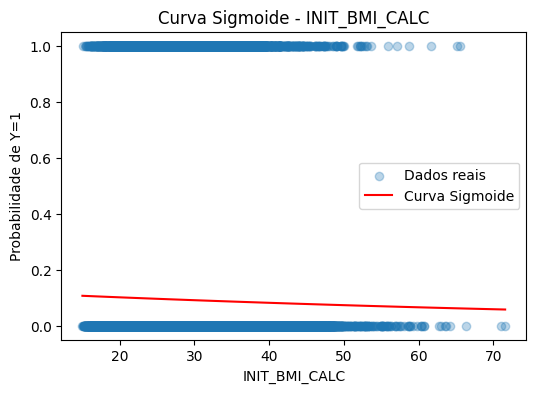

Analisando a variável: END_BMI_CALC


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


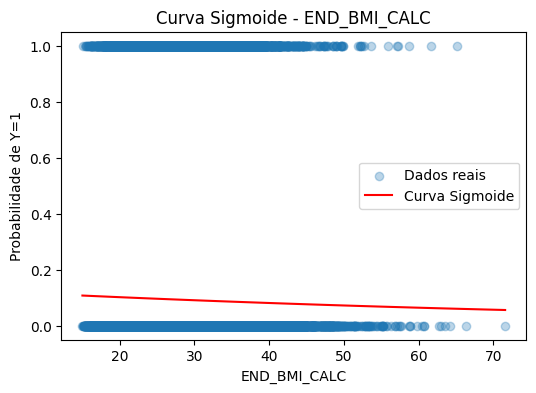

Analisando a variável: BMI_DON_CALC
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

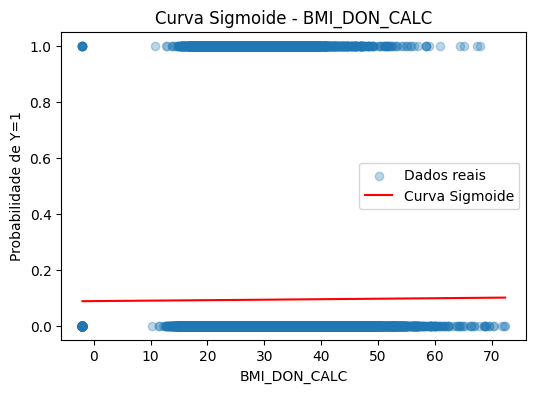

Analisando a variável: INIT_INR
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

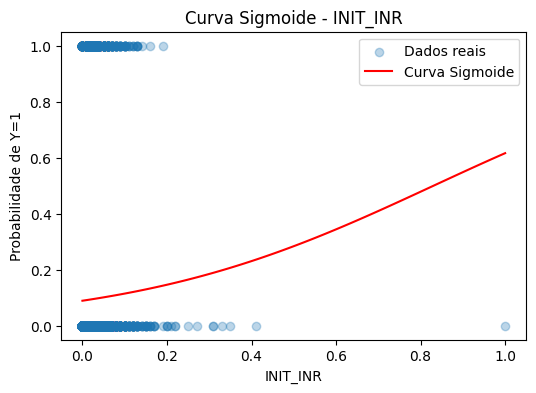

Analisando a variável: FINAL_INR


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


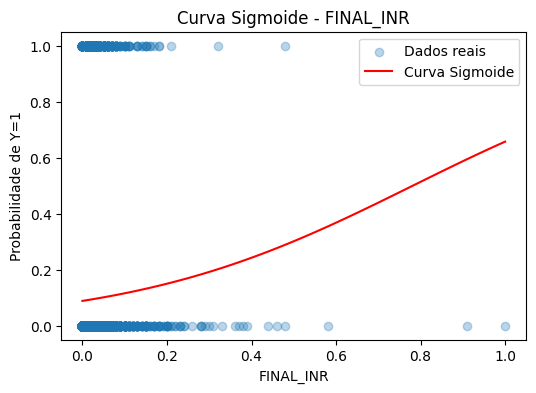

Analisando a variável: INIT_MELD_PELD_LAB_SCORE
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


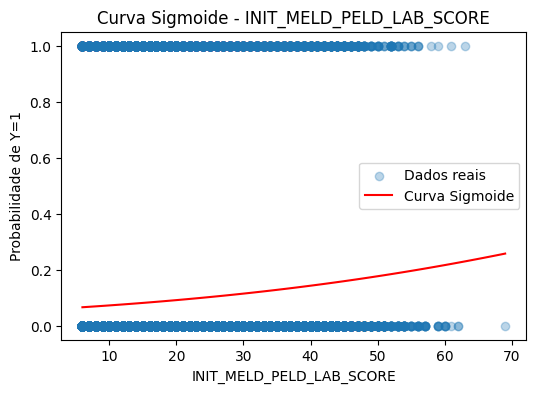

Analisando a variável: FINAL_MELD_PELD_LAB_SCORE
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


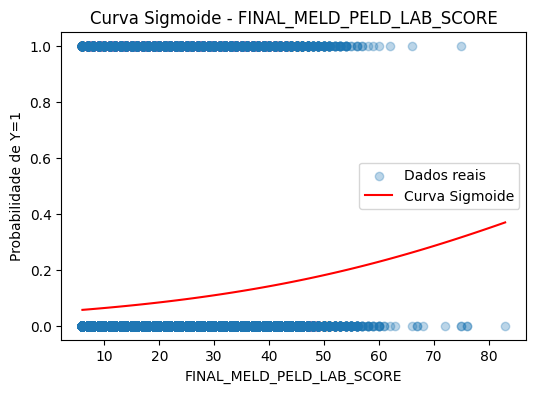

Analisando a variável: INIT_SERUM_SODIUM
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

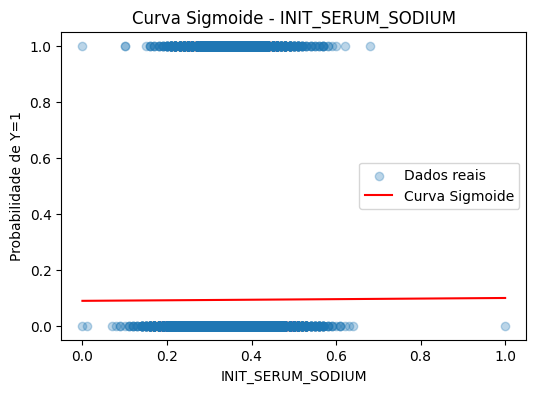

Analisando a variável: FINAL_SERUM_SODIUM
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

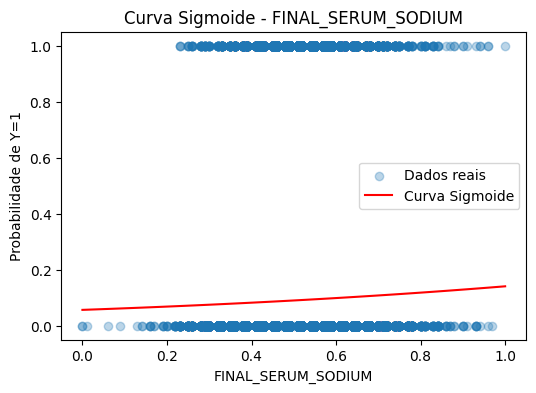

Analisando a variável: PREV_TX
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

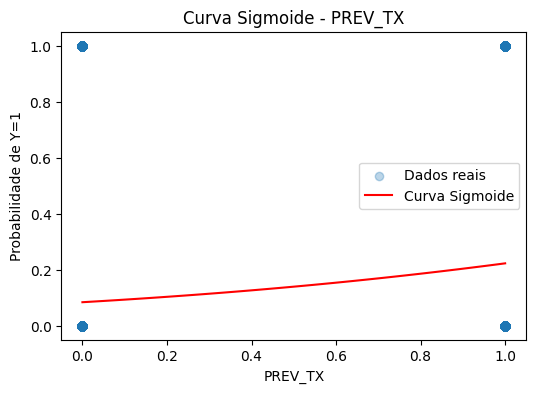

Analisando a variável: PREV_TX_ANY
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

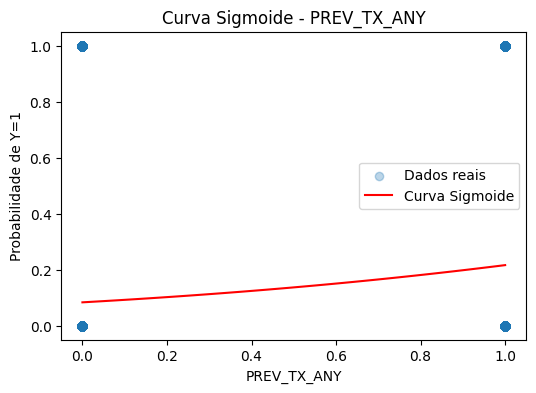

Analisando a variável: NUM_PREV_TX
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.16      0.00      0.00      1777

    accuracy                           0.90     18835
   macro avg       0.53      0.50      0.48     18835
weighted avg       0.84      0.90      0.86     18835

Matriz de Confusão:
 [[17037    21]
 [ 1773     4]]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


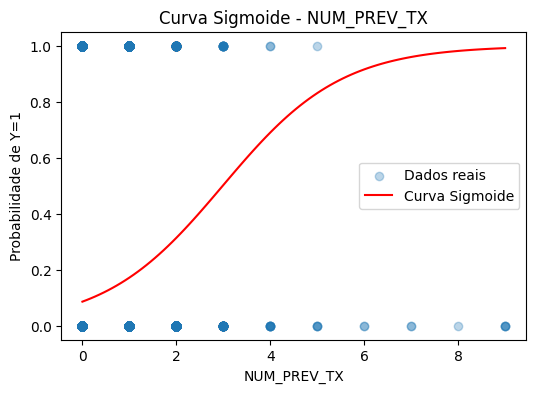

Analisando a variável: COD_CAD_DON
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

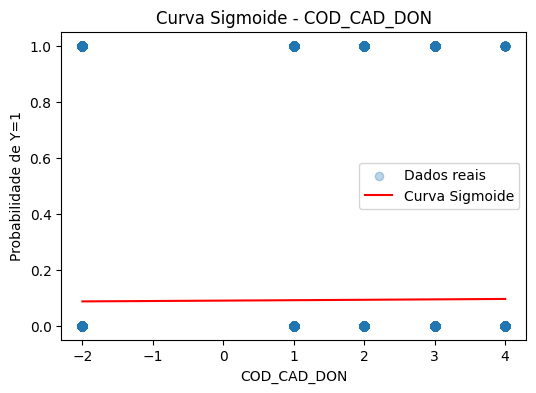

Analisando a variável: COLD_ISCH
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.00      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.45      0.50      0.48     18835
weighted avg       0.82      0.91      0.86     18835

Matriz de Confusão:
 [[17058     0]
 [ 1777     0]]


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/u

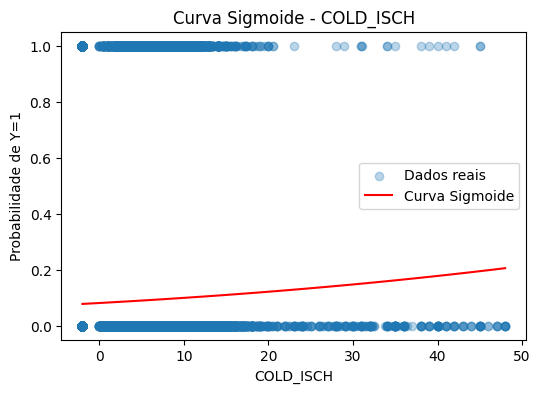

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np


# Criando o DataFrame (caso ainda não esteja carregado)
df_pandas = pd.read_csv("/content/drive/MyDrive/2024-5/liver_data_normalizado2.csv")

# Criando o alvo binário baseado no tempo de sobrevida (exemplo: maior que 6 meses)
df_pandas["Y"] = (df_pandas["tempo_sobrevida"] <= 6).astype(int)  # 6 meses = 180 dias

# Variáveis independentes
variaveis_independentes = [
     "INIT_ALBUMIN", "FINAL_ALBUMIN", "INIT_ASCITES", "FINAL_ASCITES", "INIT_BILIRUBIN", "FINAL_BILIRUBIN",
    "INIT_SERUM_CREAT", "FINAL_SERUM_CREAT", "CREAT_DON", "DIAB", "DIABETES_DON", "HIST_INSULIN_DEP_DON",
    "INIT_DIALYSIS_PRIOR_WEEK", "FINAL_DIALYSIS_PRIOR_WEEK", "INIT_ENCEPH", "FINAL_ENCEPH", "ETHCAT",
    "ETHCAT_DON", "GENDER", "GENDER_DON", "INIT_AGE", "AGE_DON", "DGN_TCR", "INIT_BMI_CALC", "END_BMI_CALC",
    "BMI_DON_CALC", "INIT_INR", "FINAL_INR", "INIT_MELD_PELD_LAB_SCORE", "FINAL_MELD_PELD_LAB_SCORE",
    "INIT_SERUM_SODIUM", "FINAL_SERUM_SODIUM", "PREV_TX", "PREV_TX_ANY", "NUM_PREV_TX", "COD_CAD_DON", "COLD_ISCH"
]


# Loop para criar uma regressão logística simples para cada variável
for var in variaveis_independentes:
    print(f"Analisando a variável: {var}")

    # Selecionando a variável independente
    X = df_pandas[[var]].dropna()
    y = df_pandas.loc[X.index, "Y"]

    # Dividindo os dados em treino e teste
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # Criando o modelo de regressão logística
    logistic_model = LogisticRegression(max_iter=1000, random_state=42)
    logistic_model.fit(X_train, y_train)

    # Avaliação do modelo
    y_pred = logistic_model.predict(X_test)
    print("Relatório de Classificação:\n", classification_report(y_test, y_pred))
    print("Matriz de Confusão:\n", confusion_matrix(y_test, y_pred))

    # Criando curva sigmoide
    X_values = np.linspace(X[var].min(), X[var].max(), 100).reshape(-1, 1)
    y_prob = logistic_model.predict_proba(X_values)[:, 1]

    plt.figure(figsize=(6, 4))
    plt.scatter(X[var], y, alpha=0.3, label="Dados reais")
    plt.plot(X_values, y_prob, color='red', label="Curva Sigmoide")
    plt.xlabel(var)
    plt.ylabel("Probabilidade de Y=1")
    plt.title(f"Curva Sigmoide - {var}")
    plt.legend()
    plt.show()

# Regressão Logística Múltipla


## Até 6 meses

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     17058
           1       0.29      0.00      0.00      1777

    accuracy                           0.91     18835
   macro avg       0.60      0.50      0.48     18835
weighted avg       0.85      0.91      0.86     18835

Matriz de Confusão:
 [[17053     5]
 [ 1775     2]]


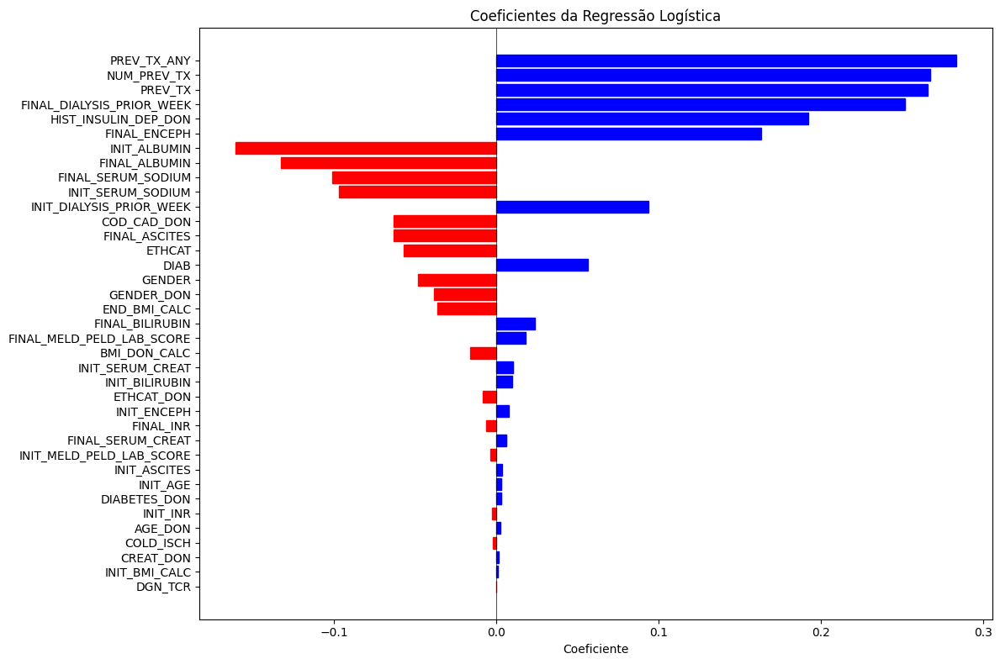

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Criando o alvo binário baseado no tempo de sobrevida
df_pandas["Y"] = (df_pandas["tempo_sobrevida"] <= 12).astype(int)  # 6 meses = 180 dias

# Variáveis independentes
variaveis_independentes = [
    "INIT_ALBUMIN", "FINAL_ALBUMIN", "INIT_ASCITES", "FINAL_ASCITES",
    "INIT_BILIRUBIN", "FINAL_BILIRUBIN", "INIT_SERUM_CREAT", "FINAL_SERUM_CREAT",
    "CREAT_DON", "DIAB", "DIABETES_DON", "HIST_INSULIN_DEP_DON",
    "INIT_DIALYSIS_PRIOR_WEEK", "FINAL_DIALYSIS_PRIOR_WEEK", "INIT_ENCEPH",
    "FINAL_ENCEPH", "ETHCAT", "ETHCAT_DON", "GENDER", "GENDER_DON", "INIT_AGE",
    "AGE_DON", "DGN_TCR", "INIT_BMI_CALC", "END_BMI_CALC", "BMI_DON_CALC",
    "INIT_INR", "FINAL_INR", "INIT_MELD_PELD_LAB_SCORE", "FINAL_MELD_PELD_LAB_SCORE",
    "INIT_SERUM_SODIUM", "FINAL_SERUM_SODIUM", "PREV_TX", "PREV_TX_ANY",
    "NUM_PREV_TX", "COD_CAD_DON", "COLD_ISCH"
]

X = df_pandas[variaveis_independentes]
y = df_pandas["Y"]

# Dividindo os dados em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Criando o modelo de regressão logística
logistic_model = LogisticRegression(max_iter=1000, random_state=42)
logistic_model.fit(X_train, y_train)

# Fazendo previsões no conjunto de teste
y_pred = logistic_model.predict(X_test)

# Avaliação do modelo
print("Relatório de Classificação:\n", classification_report(y_test, y_pred))
print("Matriz de Confusão:\n", confusion_matrix(y_test, y_pred))

# Visualizando os coeficientes (importância das variáveis)
coefficients = logistic_model.coef_[0]

# Criando um DataFrame com as variáveis e seus coeficientes
import pandas as pd
coef_df = pd.DataFrame({
    'Variável': variaveis_independentes,
    'Coeficiente': coefficients
})

# Ordenando por valor absoluto do coeficiente para destacar as variáveis mais importantes
coef_df['abs_coef'] = abs(coef_df['Coeficiente'])
coef_df = coef_df.sort_values('abs_coef', ascending=True)

# Plotando o gráfico
plt.figure(figsize=(12, 8))
bars = plt.barh(y=range(len(coef_df)), width=coef_df['Coeficiente'])

# Adicionando cores diferentes para coeficientes positivos e negativos
for i, bar in enumerate(bars):
    if bar.get_width() < 0:
        bar.set_color('red')
    else:
        bar.set_color('blue')

# Customizando o gráfico
plt.yticks(range(len(coef_df)), coef_df['Variável'])
plt.xlabel('Coeficiente')
plt.title('Coeficientes da Regressão Logística')

# Ajustando o layout para evitar cortes
plt.tight_layout()

# Adicionando uma linha vertical em x=0 para referência
plt.axvline(x=0, color='black', linestyle='-', linewidth=0.5)

plt.show()

## Até 1 ano

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no pre

Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.79      1.00      0.88     14896
           1       0.00      0.00      0.00      3939

    accuracy                           0.79     18835
   macro avg       0.40      0.50      0.44     18835
weighted avg       0.63      0.79      0.70     18835

Matriz de Confusão:
 [[14896     0]
 [ 3939     0]]


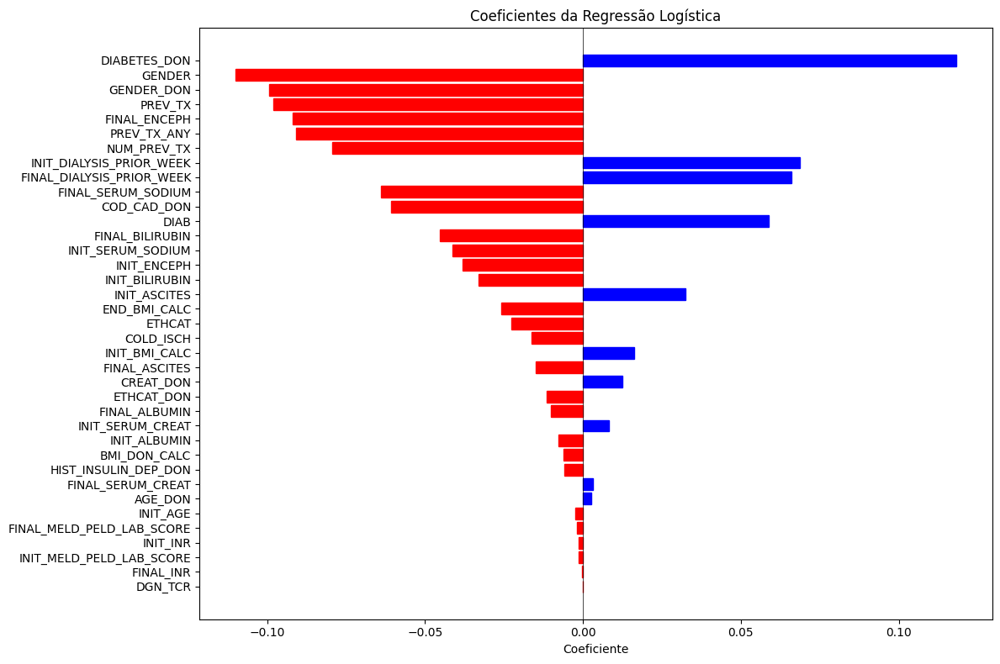

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

df_pandas["Y_12m"] = (df_pandas["tempo_sobrevida"] <= 12).astype(int)

# Variáveis independentes
variaveis_independentes = [
    "INIT_ALBUMIN", "FINAL_ALBUMIN", "INIT_ASCITES", "FINAL_ASCITES",
    "INIT_BILIRUBIN", "FINAL_BILIRUBIN", "INIT_SERUM_CREAT", "FINAL_SERUM_CREAT",
    "CREAT_DON", "DIAB", "DIABETES_DON", "HIST_INSULIN_DEP_DON",
    "INIT_DIALYSIS_PRIOR_WEEK", "FINAL_DIALYSIS_PRIOR_WEEK", "INIT_ENCEPH",
    "FINAL_ENCEPH", "ETHCAT", "ETHCAT_DON", "GENDER", "GENDER_DON", "INIT_AGE",
    "AGE_DON", "DGN_TCR", "INIT_BMI_CALC", "END_BMI_CALC", "BMI_DON_CALC",
    "INIT_INR", "FINAL_INR", "INIT_MELD_PELD_LAB_SCORE", "FINAL_MELD_PELD_LAB_SCORE",
    "INIT_SERUM_SODIUM", "FINAL_SERUM_SODIUM", "PREV_TX", "PREV_TX_ANY",
    "NUM_PREV_TX", "COD_CAD_DON", "COLD_ISCH"
]

X = df_pandas[variaveis_independentes]
y = df_pandas["Y"]

# Dividindo os dados em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Criando o modelo de regressão logística
logistic_model = LogisticRegression(max_iter=1000, random_state=42)
logistic_model.fit(X_train, y_train)

# Fazendo previsões no conjunto de teste
y_pred = logistic_model.predict(X_test)

# Avaliação do modelo
print("Relatório de Classificação:\n", classification_report(y_test, y_pred))
print("Matriz de Confusão:\n", confusion_matrix(y_test, y_pred))

# Visualizando os coeficientes (importância das variáveis)
coefficients = logistic_model.coef_[0]

# Criando um DataFrame com as variáveis e seus coeficientes
import pandas as pd
coef_df = pd.DataFrame({
    'Variável': variaveis_independentes,
    'Coeficiente': coefficients
})

# Ordenando por valor absoluto do coeficiente para destacar as variáveis mais importantes
coef_df['abs_coef'] = abs(coef_df['Coeficiente'])
coef_df = coef_df.sort_values('abs_coef', ascending=True)

# Plotando o gráfico
plt.figure(figsize=(12, 8))
bars = plt.barh(y=range(len(coef_df)), width=coef_df['Coeficiente'])

# Adicionando cores diferentes para coeficientes positivos e negativos
for i, bar in enumerate(bars):
    if bar.get_width() < 0:
        bar.set_color('red')
    else:
        bar.set_color('blue')

# Customizando o gráfico
plt.yticks(range(len(coef_df)), coef_df['Variável'])
plt.xlabel('Coeficiente')
plt.title('Coeficientes da Regressão Logística')

# Ajustando o layout para evitar cortes
plt.tight_layout()

# Adicionando uma linha vertical em x=0 para referência
plt.axvline(x=0, color='black', linestyle='-', linewidth=0.5)

plt.show()

## Até 5 anos

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no pre

Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.79      1.00      0.88     14896
           1       0.00      0.00      0.00      3939

    accuracy                           0.79     18835
   macro avg       0.40      0.50      0.44     18835
weighted avg       0.63      0.79      0.70     18835

Matriz de Confusão:
 [[14896     0]
 [ 3939     0]]


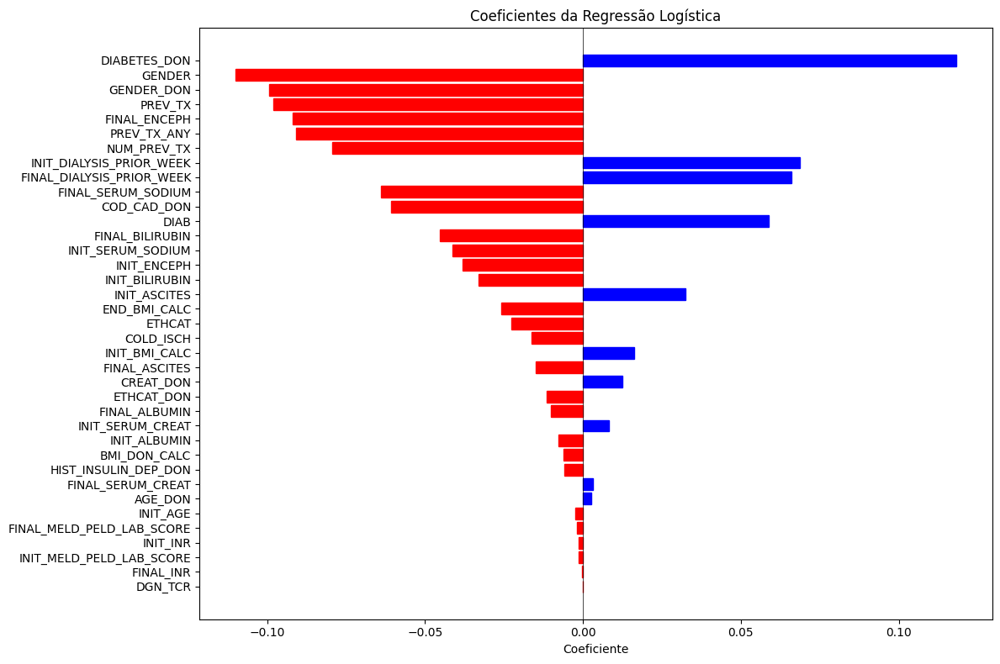

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

df_pandas["Y_60m"] = (df_pandas["tempo_sobrevida"] <= 60).astype(int)

# Variáveis independentes
variaveis_independentes = [
    "INIT_ALBUMIN", "FINAL_ALBUMIN", "INIT_ASCITES", "FINAL_ASCITES",
    "INIT_BILIRUBIN", "FINAL_BILIRUBIN", "INIT_SERUM_CREAT", "FINAL_SERUM_CREAT",
    "CREAT_DON", "DIAB", "DIABETES_DON", "HIST_INSULIN_DEP_DON",
    "INIT_DIALYSIS_PRIOR_WEEK", "FINAL_DIALYSIS_PRIOR_WEEK", "INIT_ENCEPH",
    "FINAL_ENCEPH", "ETHCAT", "ETHCAT_DON", "GENDER", "GENDER_DON", "INIT_AGE",
    "AGE_DON", "DGN_TCR", "INIT_BMI_CALC", "END_BMI_CALC", "BMI_DON_CALC",
    "INIT_INR", "FINAL_INR", "INIT_MELD_PELD_LAB_SCORE", "FINAL_MELD_PELD_LAB_SCORE",
    "INIT_SERUM_SODIUM", "FINAL_SERUM_SODIUM", "PREV_TX", "PREV_TX_ANY",
    "NUM_PREV_TX", "COD_CAD_DON", "COLD_ISCH"
]

X = df_pandas[variaveis_independentes]
y = df_pandas["Y"]

# Dividindo os dados em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Criando o modelo de regressão logística
logistic_model = LogisticRegression(max_iter=1000, random_state=42)
logistic_model.fit(X_train, y_train)

# Fazendo previsões no conjunto de teste
y_pred = logistic_model.predict(X_test)

# Avaliação do modelo
print("Relatório de Classificação:\n", classification_report(y_test, y_pred))
print("Matriz de Confusão:\n", confusion_matrix(y_test, y_pred))

# Visualizando os coeficientes (importância das variáveis)
coefficients = logistic_model.coef_[0]

# Criando um DataFrame com as variáveis e seus coeficientes
import pandas as pd
coef_df = pd.DataFrame({
    'Variável': variaveis_independentes,
    'Coeficiente': coefficients
})

# Ordenando por valor absoluto do coeficiente para destacar as variáveis mais importantes
coef_df['abs_coef'] = abs(coef_df['Coeficiente'])
coef_df = coef_df.sort_values('abs_coef', ascending=True)

# Plotando o gráfico
plt.figure(figsize=(12, 8))
bars = plt.barh(y=range(len(coef_df)), width=coef_df['Coeficiente'])

# Adicionando cores diferentes para coeficientes positivos e negativos
for i, bar in enumerate(bars):
    if bar.get_width() < 0:
        bar.set_color('red')
    else:
        bar.set_color('blue')

# Customizando o gráfico
plt.yticks(range(len(coef_df)), coef_df['Variável'])
plt.xlabel('Coeficiente')
plt.title('Coeficientes da Regressão Logística')

# Ajustando o layout para evitar cortes
plt.tight_layout()

# Adicionando uma linha vertical em x=0 para referência
plt.axvline(x=0, color='black', linestyle='-', linewidth=0.5)

plt.show()

# Regressão Cox

In [ ]:
!pip install lifelines


  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 349.3/349.3 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.7/115.7 kB 9.6 MB/s eta 0:00:00
  Created wheel for autograd-gamma: filename=autograd_gamma-0.5.0-py3-none-any.whl size=4030 sha256=86a043f1d3dd0c73bc8d2035d9f63e82db8dd358412d0e16cead59993d29b362
  Stored in directory: /root/.cache/pip/wheels/8b/67/f4/2caaae2146198dcb824f31a303833b07b14a5ec863fb3acd7b
Successfully built autograd-gamma


Analisando a variável: INIT_ALBUMIN

                  coef  exp(coef)  se(coef)  coef lower 95%  coef upper 95%  \
covariate                                                                     
INIT_ALBUMIN -2.177741   0.113297  0.180778       -2.532059       -1.823423   

              exp(coef) lower 95%  exp(coef) upper 95%  cmp to        z  \
covariate                                                                 
INIT_ALBUMIN             0.079495             0.161472     0.0 -12.0465   

                         p    -log2(p)  
covariate                               
INIT_ALBUMIN  2.023622e-33  108.606687  


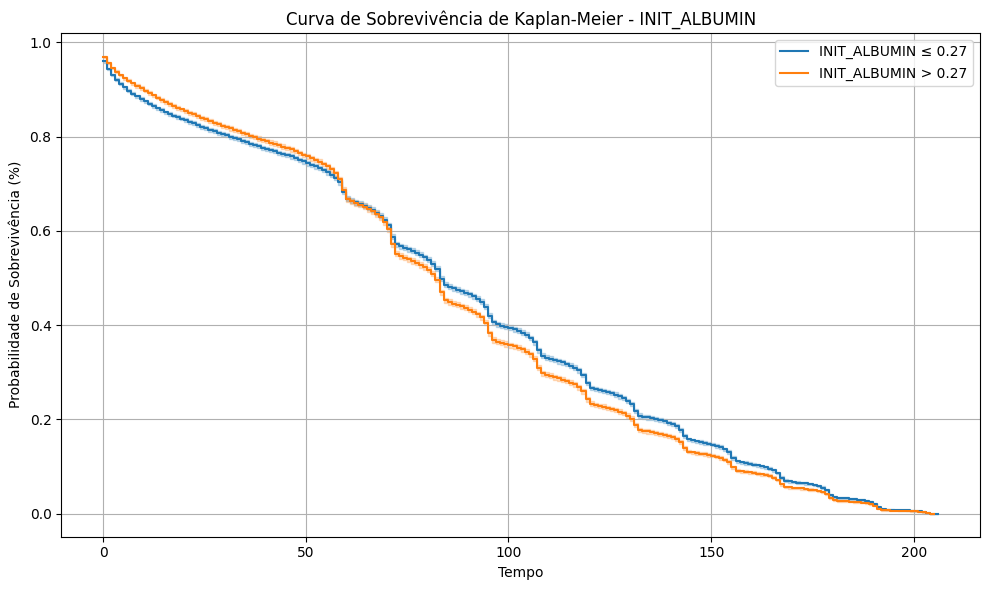

-------------------------------------------------- 

Analisando a variável: FINAL_ALBUMIN

                   coef  exp(coef)  se(coef)  coef lower 95%  coef upper 95%  \
covariate                                                                      
FINAL_ALBUMIN -0.982055   0.374541  0.167653       -1.310649       -0.653461   

               exp(coef) lower 95%  exp(coef) upper 95%  cmp to         z  \
covariate                                                                   
FINAL_ALBUMIN             0.269645             0.520242     0.0 -5.857657   

                          p   -log2(p)  
covariate                               
FINAL_ALBUMIN  4.694419e-09  27.666406  


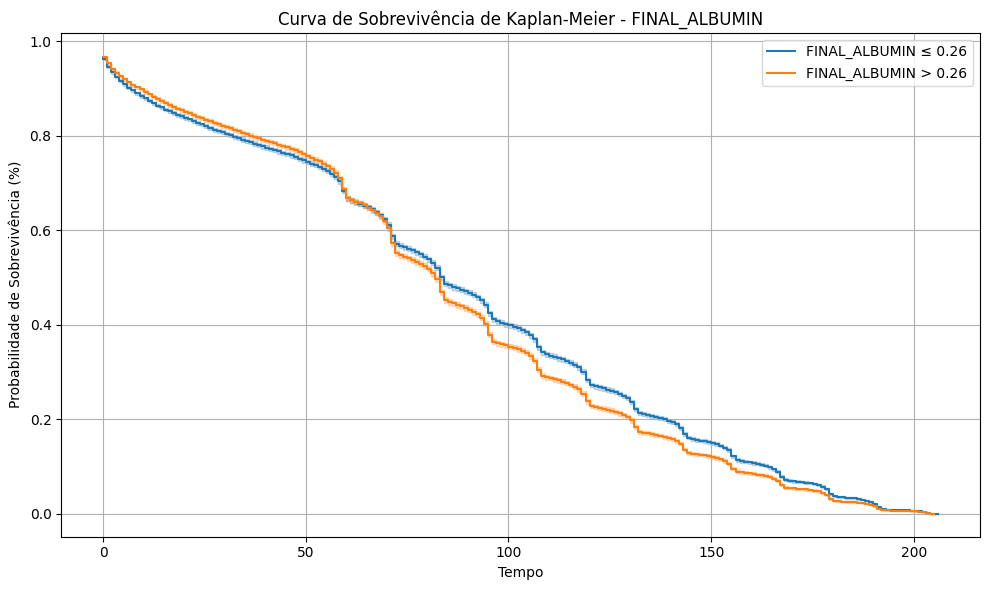

-------------------------------------------------- 

Analisando a variável: INIT_ASCITES

                  coef  exp(coef)  se(coef)  coef lower 95%  coef upper 95%  \
covariate                                                                     
INIT_ASCITES  0.167679   1.182557  0.018086        0.132231        0.203127   

              exp(coef) lower 95%  exp(coef) upper 95%  cmp to         z  \
covariate                                                                  
INIT_ASCITES             1.141372             1.225228     0.0  9.271185   

                         p  -log2(p)  
covariate                             
INIT_ASCITES  1.840888e-20  65.55816  


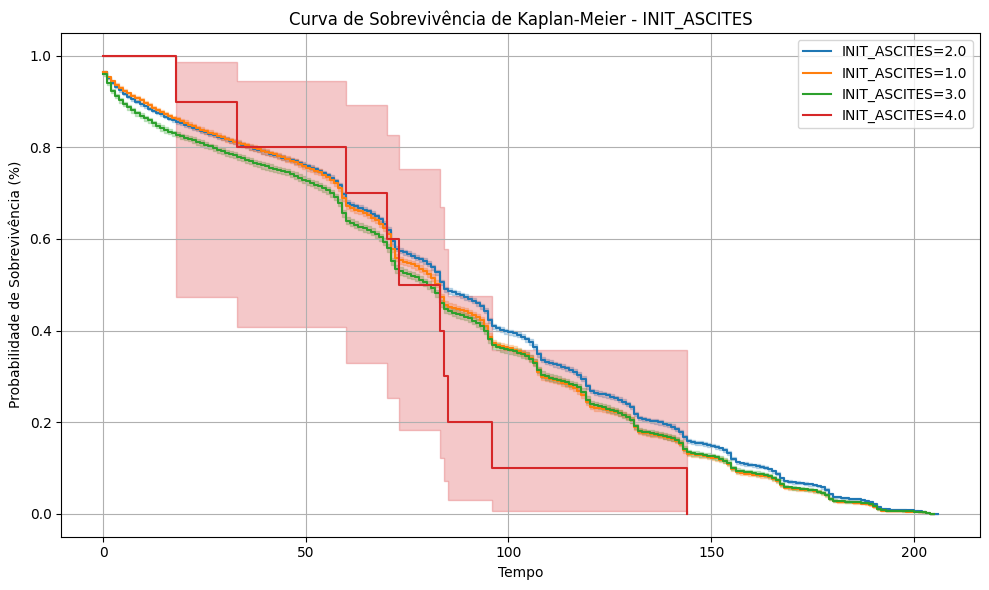

-------------------------------------------------- 

Analisando a variável: FINAL_ASCITES

                   coef  exp(coef)  se(coef)  coef lower 95%  coef upper 95%  \
covariate                                                                      
FINAL_ASCITES  0.194568   1.214786  0.017516        0.160237        0.228899   

               exp(coef) lower 95%  exp(coef) upper 95%  cmp to          z  \
covariate                                                                    
FINAL_ASCITES             1.173789             1.257216     0.0  11.107838   

                          p   -log2(p)  
covariate                               
FINAL_ASCITES  1.149083e-28  92.813503  


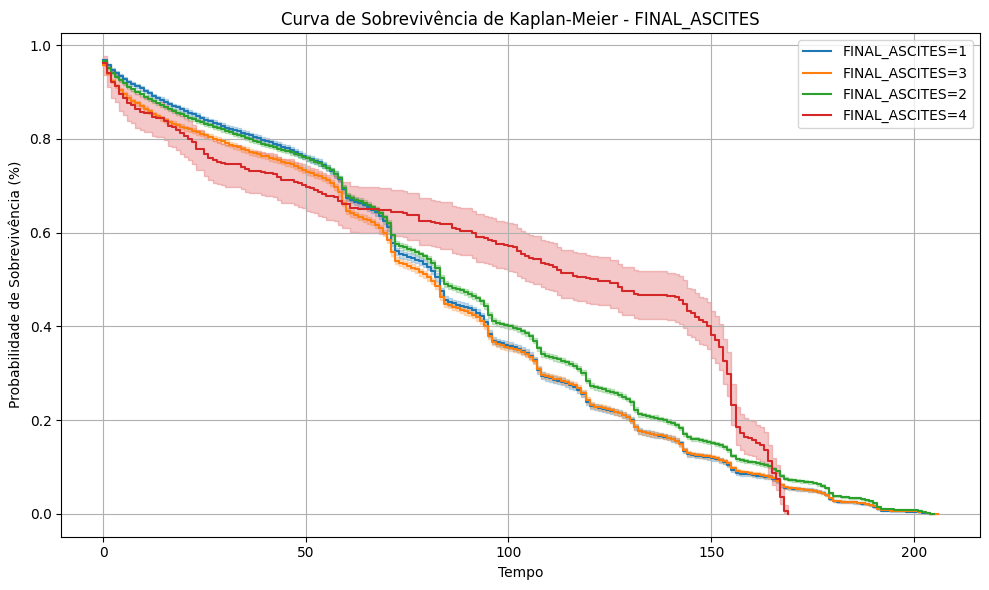

-------------------------------------------------- 

Analisando a variável: INIT_BILIRUBIN

                    coef  exp(coef)  se(coef)  coef lower 95%  coef upper 95%  \
covariate                                                                       
INIT_BILIRUBIN  1.773809   5.893255  0.112449        1.553413        1.994204   

                exp(coef) lower 95%  exp(coef) upper 95%  cmp to         z  \
covariate                                                                    
INIT_BILIRUBIN             4.727579             7.346353     0.0  15.77438   

                           p    -log2(p)  
covariate                                 
INIT_BILIRUBIN  4.669595e-56  183.804676  


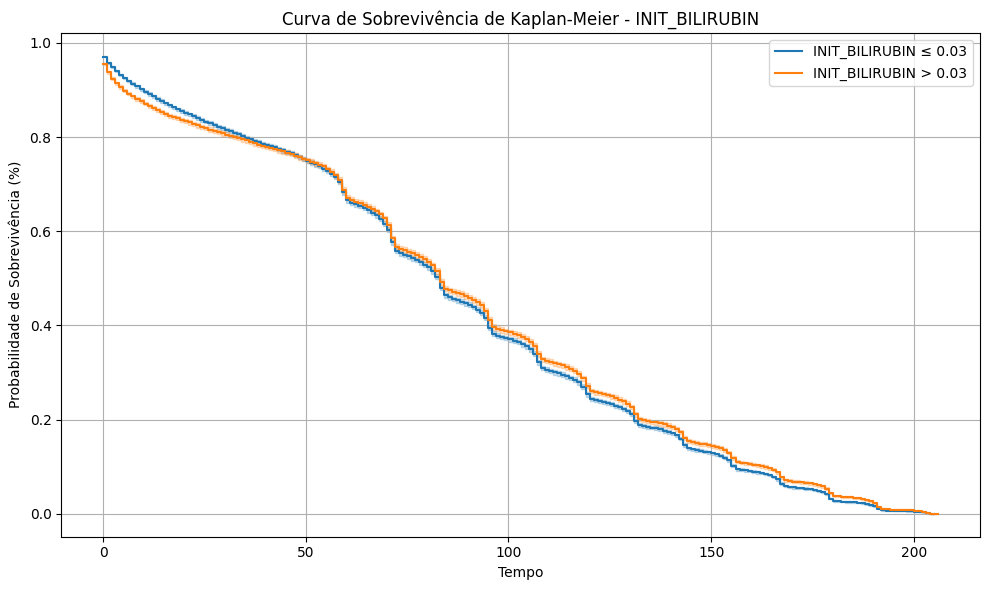

-------------------------------------------------- 

Analisando a variável: FINAL_BILIRUBIN

                     coef  exp(coef)  se(coef)  coef lower 95%  \
covariate                                                        
FINAL_BILIRUBIN  1.823029   6.190581  0.092819        1.641108   

                 coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%  \
covariate                                                                   
FINAL_BILIRUBIN         2.00495             5.160883             7.425724   

                 cmp to          z             p    -log2(p)  
covariate                                                     
FINAL_BILIRUBIN     0.0  19.640757  6.935712e-86  282.891772  


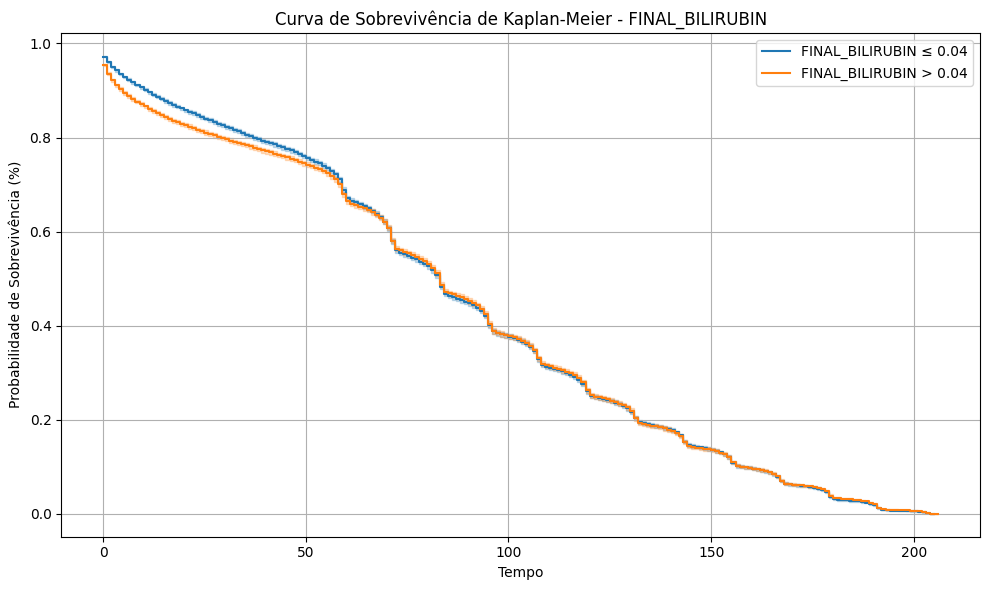

-------------------------------------------------- 

Analisando a variável: INIT_SERUM_CREAT

                      coef  exp(coef)  se(coef)  coef lower 95%  \
covariate                                                         
INIT_SERUM_CREAT  2.557568   12.90439  0.192965        2.179363   

                  coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%  \
covariate                                                                    
INIT_SERUM_CREAT        2.935772             8.840669            18.836048   

                  cmp to          z             p    -log2(p)  
covariate                                                      
INIT_SERUM_CREAT     0.0  13.254031  4.276054e-40  130.780844  


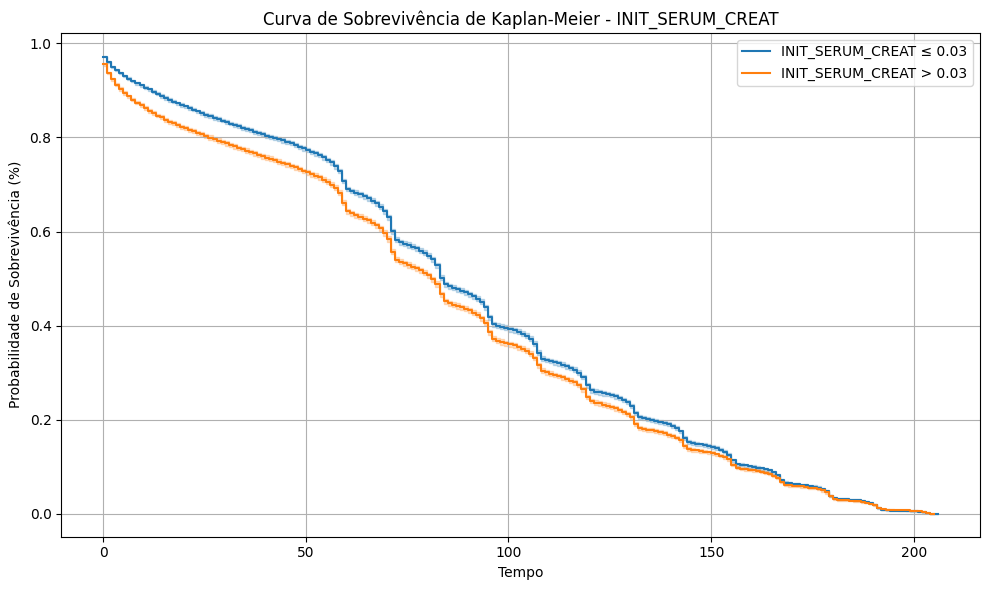

-------------------------------------------------- 

Analisando a variável: FINAL_SERUM_CREAT

                       coef  exp(coef)  se(coef)  coef lower 95%  \
covariate                                                          
FINAL_SERUM_CREAT  3.668734  39.202244   0.23885        3.200597   

                   coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%  \
covariate                                                                     
FINAL_SERUM_CREAT        4.136871            24.547169            62.606644   

                   cmp to         z             p    -log2(p)  
covariate                                                      
FINAL_SERUM_CREAT     0.0  15.35999  3.036191e-53  174.459926  


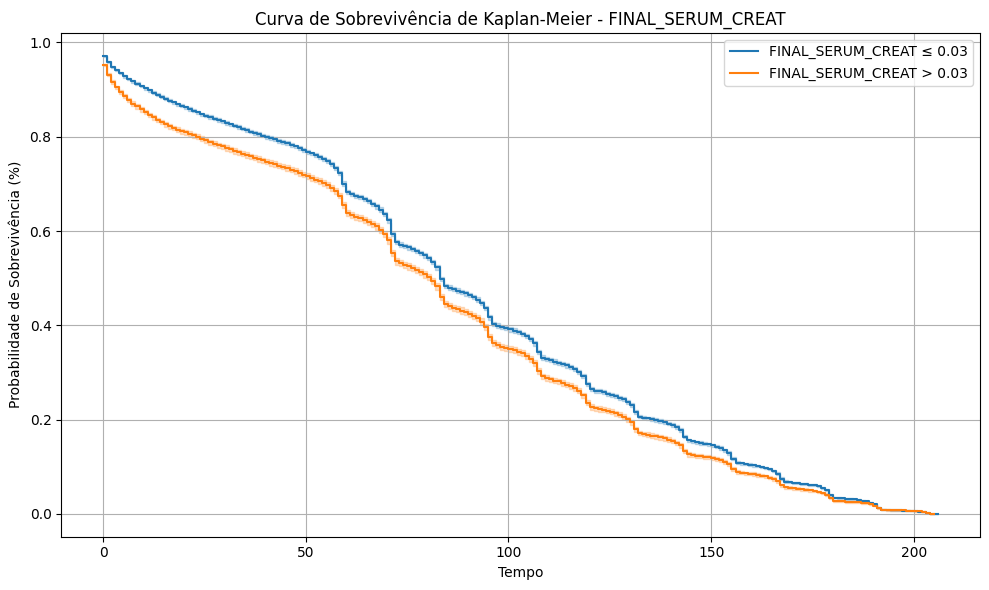

-------------------------------------------------- 

Analisando a variável: CREAT_DON

               coef  exp(coef)  se(coef)  coef lower 95%  coef upper 95%  \
covariate                                                                  
CREAT_DON  0.009489   1.009534   0.00732       -0.004858        0.023835   

           exp(coef) lower 95%  exp(coef) upper 95%  cmp to         z  \
covariate                                                               
CREAT_DON             0.995154             1.024121     0.0  1.296307   

                 p  -log2(p)  
covariate                     
CREAT_DON  0.19487  2.359417  


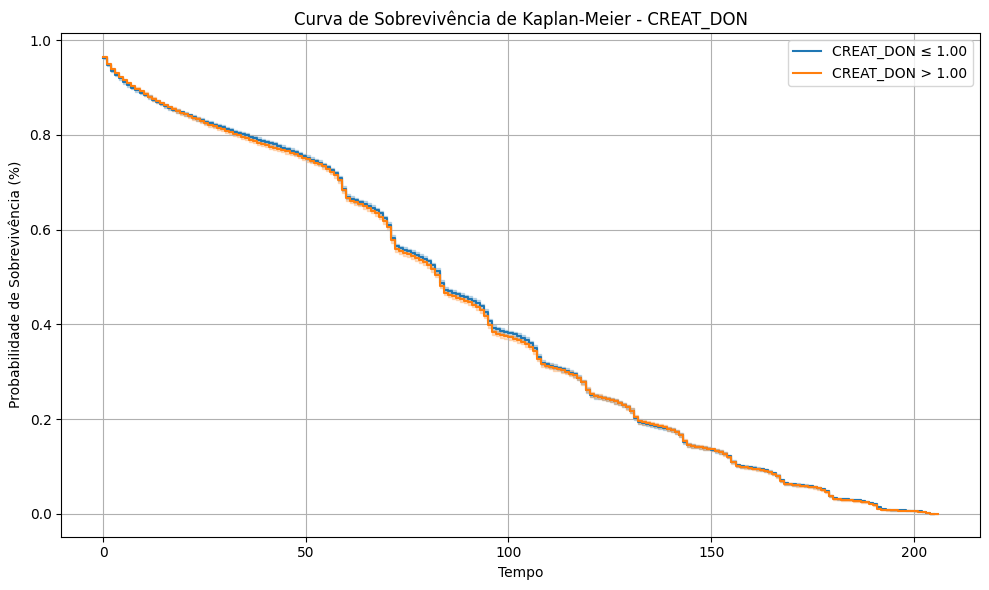

-------------------------------------------------- 

Analisando a variável: DIAB

              coef  exp(coef)  se(coef)  coef lower 95%  coef upper 95%  \
covariate                                                                 
DIAB       0.06242   1.064409  0.012342         0.03823        0.086609   

           exp(coef) lower 95%  exp(coef) upper 95%  cmp to         z  \
covariate                                                               
DIAB                   1.03897              1.09047     0.0  5.057563   

                      p   -log2(p)  
covariate                           
DIAB       4.246472e-07  21.167232  


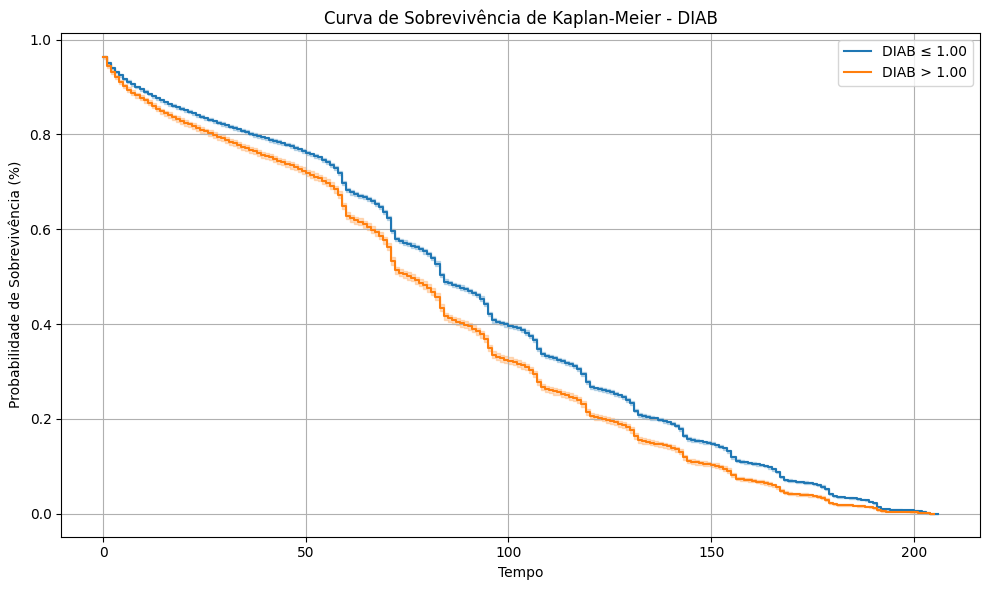

-------------------------------------------------- 

Analisando a variável: DIABETES_DON

                  coef  exp(coef)  se(coef)  coef lower 95%  coef upper 95%  \
covariate                                                                     
DIABETES_DON  0.111242   1.117665  0.026842        0.058632        0.163852   

              exp(coef) lower 95%  exp(coef) upper 95%  cmp to         z  \
covariate                                                                  
DIABETES_DON             1.060385              1.17804     0.0  4.144304   

                     p   -log2(p)  
covariate                          
DIABETES_DON  0.000034  14.840513  


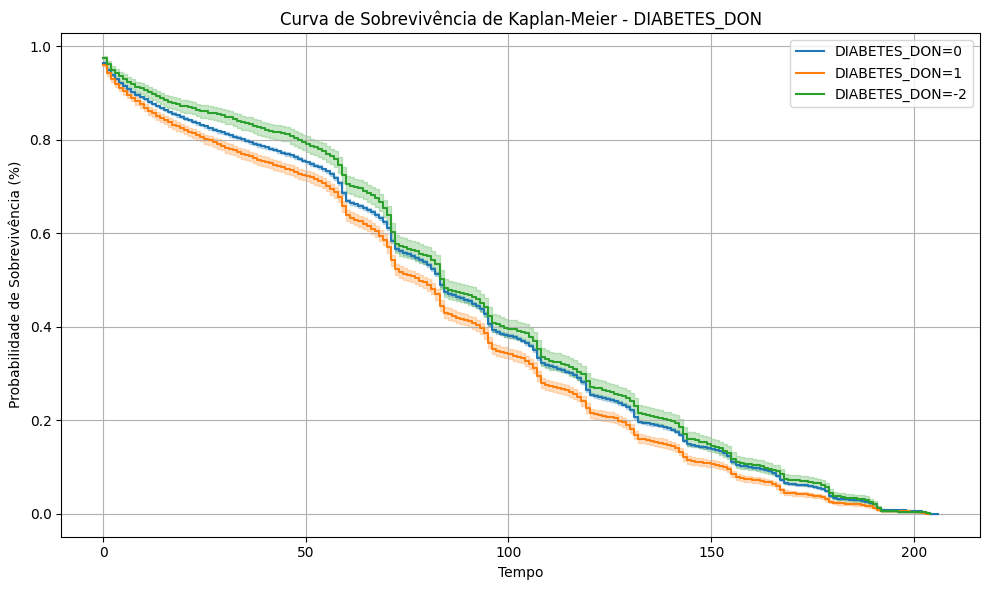

-------------------------------------------------- 

Analisando a variável: HIST_INSULIN_DEP_DON

                          coef  exp(coef)  se(coef)  coef lower 95%  \
covariate                                                             
HIST_INSULIN_DEP_DON  0.058291   1.060023  0.016404        0.026139   

                      coef upper 95%  exp(coef) lower 95%  \
covariate                                                   
HIST_INSULIN_DEP_DON        0.090442             1.026484   

                      exp(coef) upper 95%  cmp to         z        p  -log2(p)  
covariate                                                                       
HIST_INSULIN_DEP_DON             1.094658     0.0  3.553448  0.00038  11.36089  


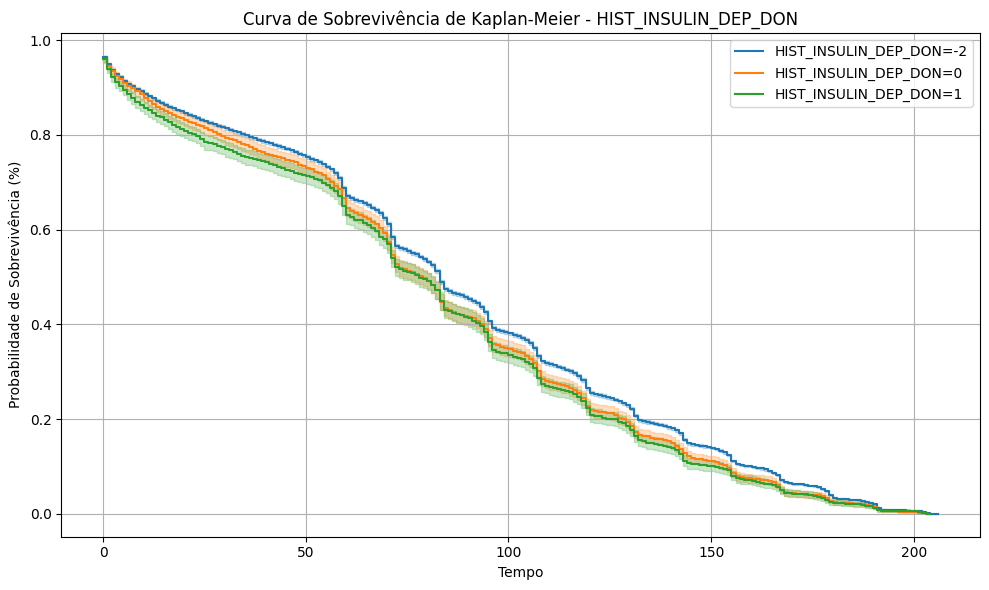

-------------------------------------------------- 

Analisando a variável: INIT_DIALYSIS_PRIOR_WEEK

                              coef  exp(coef)  se(coef)  coef lower 95%  \
covariate                                                                 
INIT_DIALYSIS_PRIOR_WEEK  0.487678    1.62853  0.041138        0.407049   

                          coef upper 95%  exp(coef) lower 95%  \
covariate                                                       
INIT_DIALYSIS_PRIOR_WEEK        0.568306             1.502378   

                          exp(coef) upper 95%  cmp to          z  \
covariate                                                          
INIT_DIALYSIS_PRIOR_WEEK             1.765274     0.0  11.854805   

                                     p    -log2(p)  
covariate                                           
INIT_DIALYSIS_PRIOR_WEEK  2.031974e-32  105.278817  


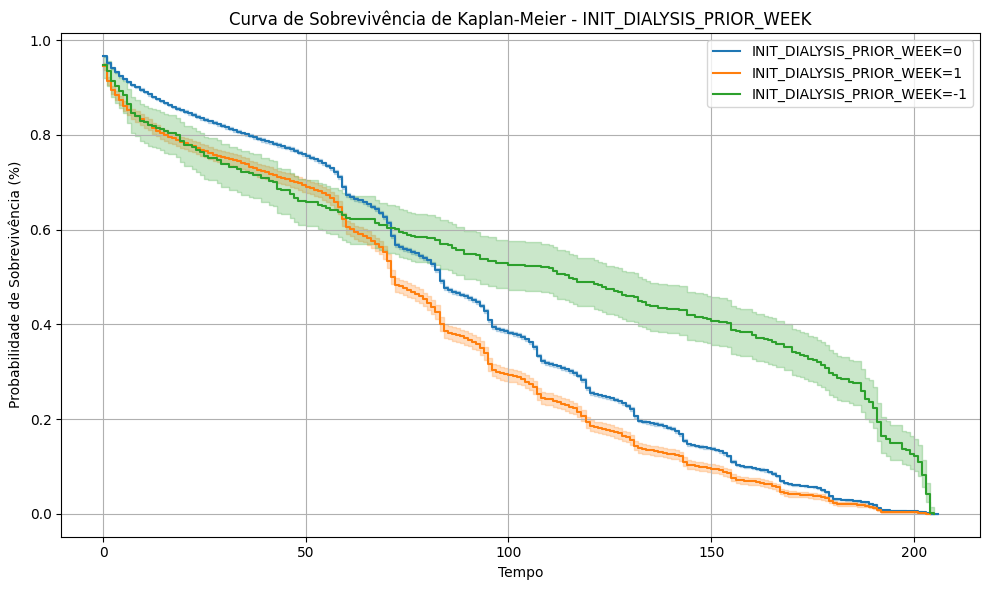

-------------------------------------------------- 

Analisando a variável: FINAL_DIALYSIS_PRIOR_WEEK

                               coef  exp(coef)  se(coef)  coef lower 95%  \
covariate                                                                  
FINAL_DIALYSIS_PRIOR_WEEK  0.621479   1.861679  0.031561        0.559621   

                           coef upper 95%  exp(coef) lower 95%  \
covariate                                                        
FINAL_DIALYSIS_PRIOR_WEEK        0.683336              1.75001   

                           exp(coef) upper 95%  cmp to          z  \
covariate                                                           
FINAL_DIALYSIS_PRIOR_WEEK             1.980475     0.0  19.691608   

                                      p    -log2(p)  
covariate                                            
FINAL_DIALYSIS_PRIOR_WEEK  2.544841e-86  284.338241  


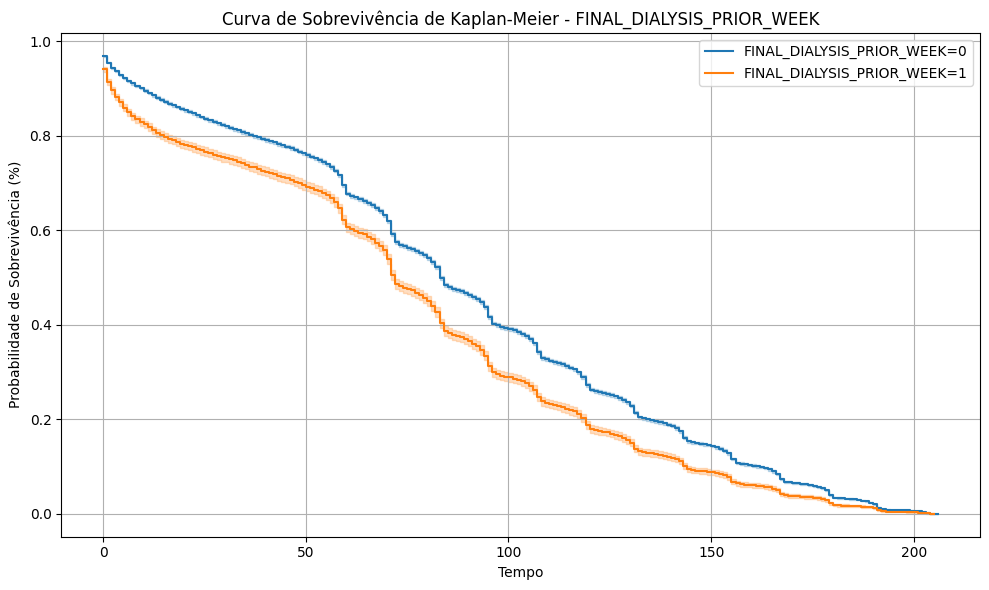

-------------------------------------------------- 

Analisando a variável: INIT_ENCEPH

                 coef  exp(coef)  se(coef)  coef lower 95%  coef upper 95%  \
covariate                                                                    
INIT_ENCEPH  0.282446    1.32637   0.02081        0.241659        0.323233   

             exp(coef) lower 95%  exp(coef) upper 95%  cmp to          z  \
covariate                                                                  
INIT_ENCEPH              1.27336             1.381588     0.0  13.572496   

                        p    -log2(p)  
covariate                              
INIT_ENCEPH  5.830236e-42  136.977426  


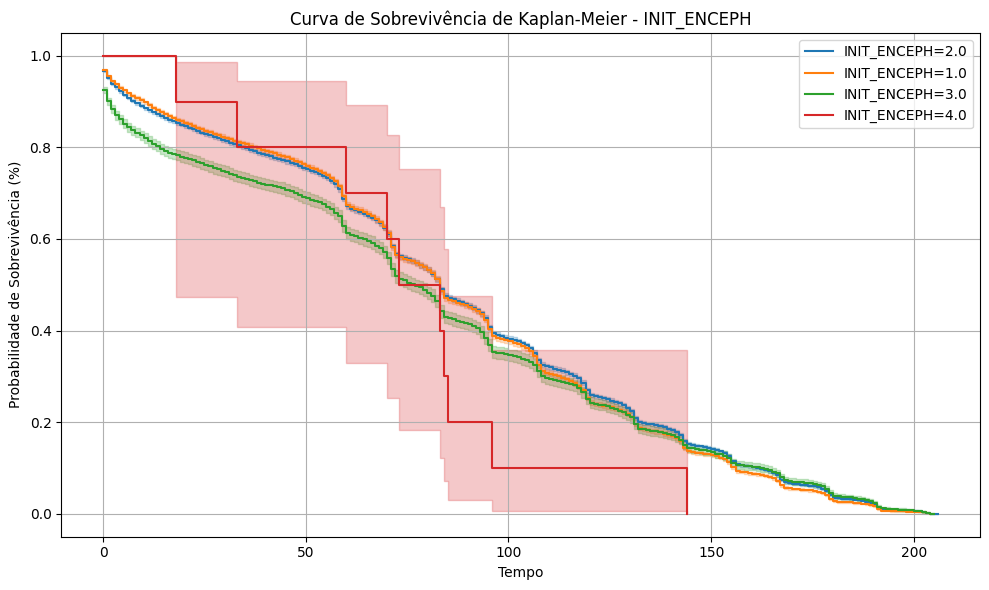

-------------------------------------------------- 

Analisando a variável: FINAL_ENCEPH

                  coef  exp(coef)  se(coef)  coef lower 95%  coef upper 95%  \
covariate                                                                     
FINAL_ENCEPH  0.345342   1.412473  0.018742        0.308609        0.382075   

              exp(coef) lower 95%  exp(coef) upper 95%  cmp to          z  \
covariate                                                                   
FINAL_ENCEPH              1.36153             1.465322     0.0  18.426399   

                         p    -log2(p)  
covariate                               
FINAL_ENCEPH  8.067783e-76  249.454363  


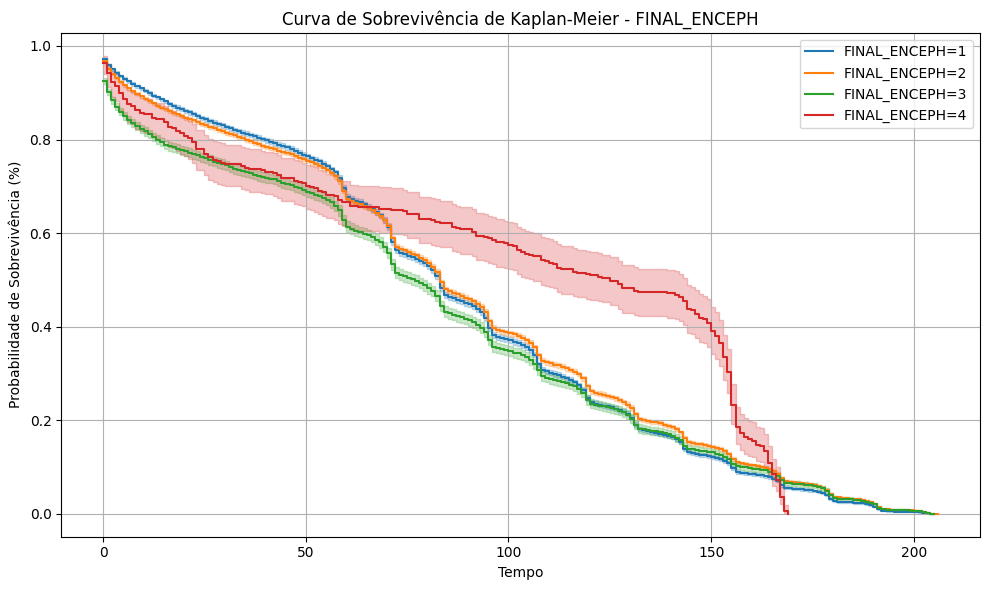

-------------------------------------------------- 

Analisando a variável: ETHCAT

              coef  exp(coef)  se(coef)  coef lower 95%  coef upper 95%  \
covariate                                                                 
ETHCAT    -0.00124   0.998761  0.009517       -0.019893        0.017414   

           exp(coef) lower 95%  exp(coef) upper 95%  cmp to         z  \
covariate                                                               
ETHCAT                0.980303             1.017566     0.0 -0.130251   

                  p  -log2(p)  
covariate                      
ETHCAT     0.896368  0.157837  


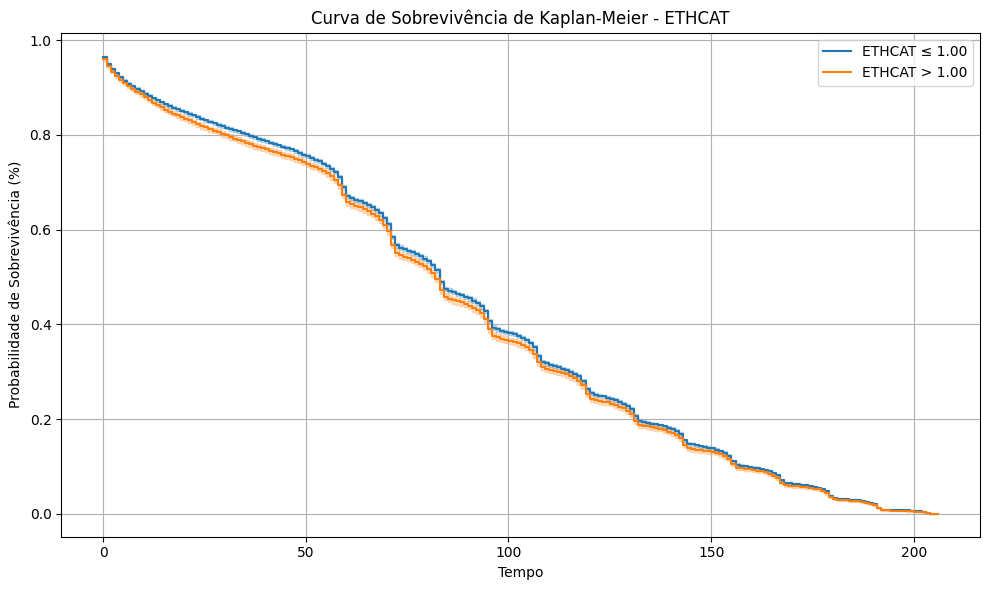

-------------------------------------------------- 

Analisando a variável: ETHCAT_DON

                coef  exp(coef)  se(coef)  coef lower 95%  coef upper 95%  \
covariate                                                                   
ETHCAT_DON  0.031593   1.032097  0.010124        0.011751        0.051435   

            exp(coef) lower 95%  exp(coef) upper 95%  cmp to         z  \
covariate                                                                
ETHCAT_DON              1.01182             1.052781     0.0  3.120655   

                   p  -log2(p)  
covariate                       
ETHCAT_DON  0.001804   9.11419  


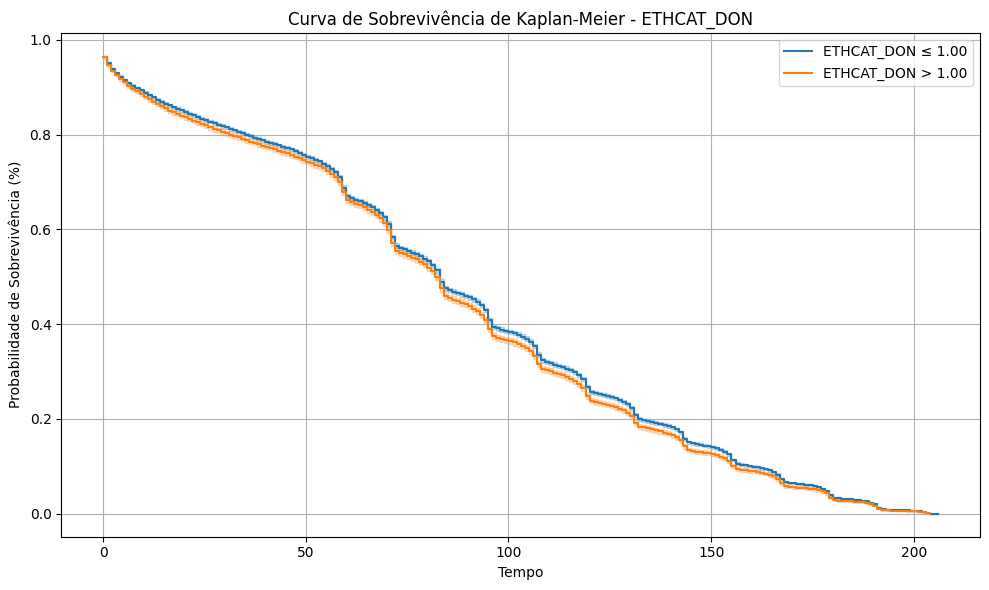

-------------------------------------------------- 

Analisando a variável: GENDER

               coef  exp(coef)  se(coef)  coef lower 95%  coef upper 95%  \
covariate                                                                  
GENDER     0.087026   1.090925   0.02742        0.033284        0.140768   

           exp(coef) lower 95%  exp(coef) upper 95%  cmp to         z  \
covariate                                                               
GENDER                1.033844             1.151158     0.0  3.173822   

                  p  -log2(p)  
covariate                      
GENDER     0.001504  9.376541  


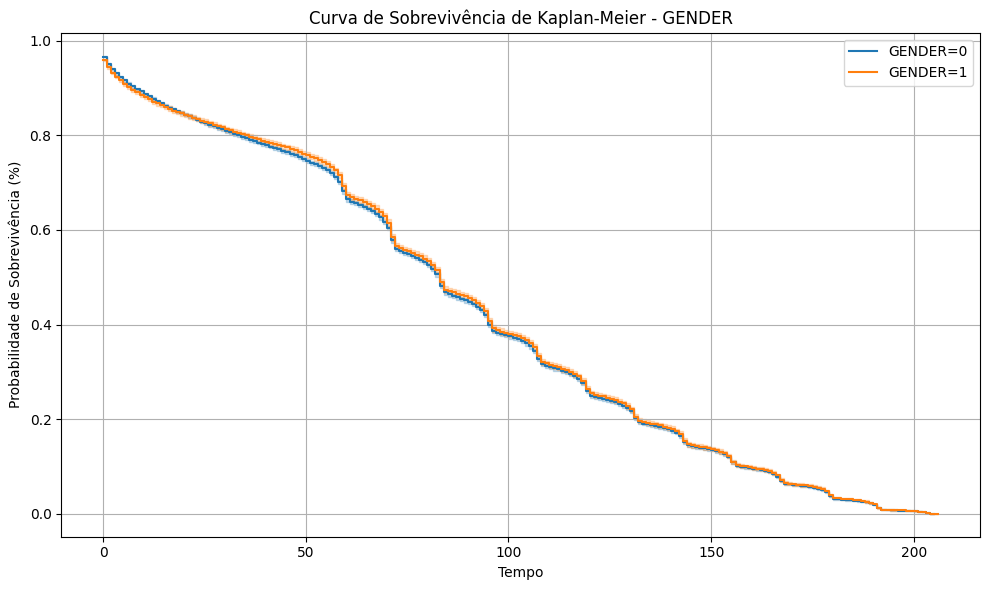

-------------------------------------------------- 

Analisando a variável: GENDER_DON

                coef  exp(coef)  se(coef)  coef lower 95%  coef upper 95%  \
covariate                                                                   
GENDER_DON  0.043825     1.0448  0.026552       -0.008216        0.095867   

            exp(coef) lower 95%  exp(coef) upper 95%  cmp to         z  \
covariate                                                                
GENDER_DON             0.991817             1.100613     0.0  1.650525   

                   p  -log2(p)  
covariate                       
GENDER_DON  0.098836  3.338825  


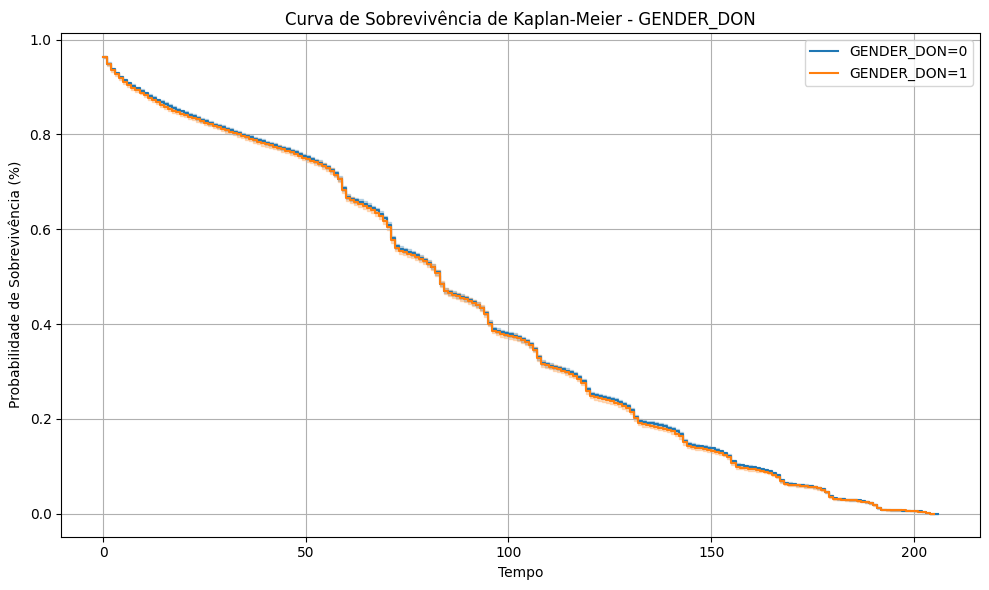

-------------------------------------------------- 

Analisando a variável: INIT_AGE

               coef  exp(coef)  se(coef)  coef lower 95%  coef upper 95%  \
covariate                                                                  
INIT_AGE   0.010169   1.010221  0.001347        0.007529        0.012808   

           exp(coef) lower 95%  exp(coef) upper 95%  cmp to         z  \
covariate                                                               
INIT_AGE              1.007558             1.012891     0.0  7.550732   

                      p   -log2(p)  
covariate                           
INIT_AGE   4.328191e-14  44.393229  


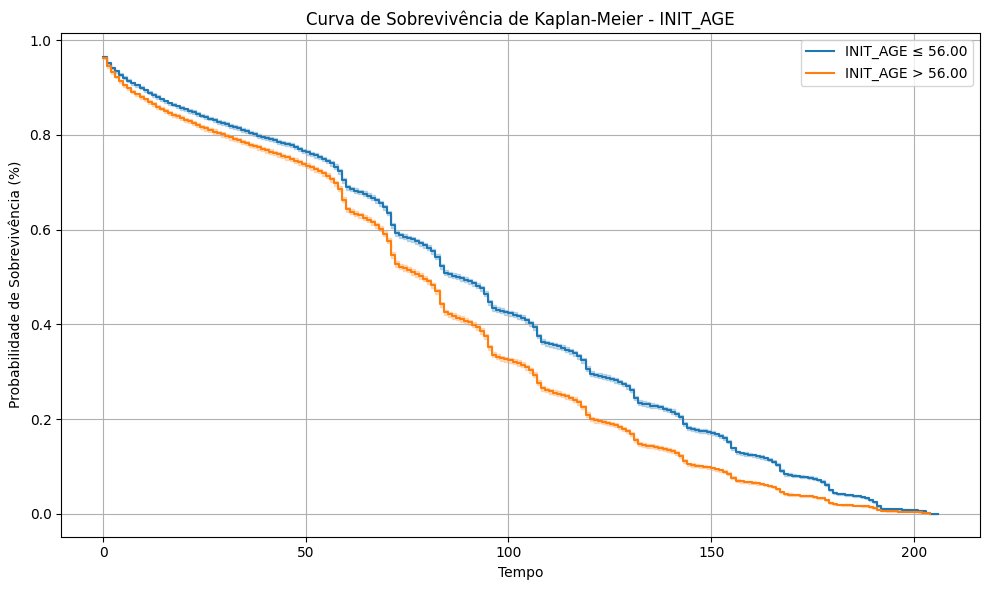

-------------------------------------------------- 

Analisando a variável: AGE_DON

               coef  exp(coef)  se(coef)  coef lower 95%  coef upper 95%  \
covariate                                                                  
AGE_DON    0.004509   1.004519  0.000792        0.002956        0.006062   

           exp(coef) lower 95%  exp(coef) upper 95%  cmp to         z  \
covariate                                                               
AGE_DON                1.00296             1.006081     0.0  5.690318   

                      p  -log2(p)  
covariate                          
AGE_DON    1.268026e-08  26.23284  


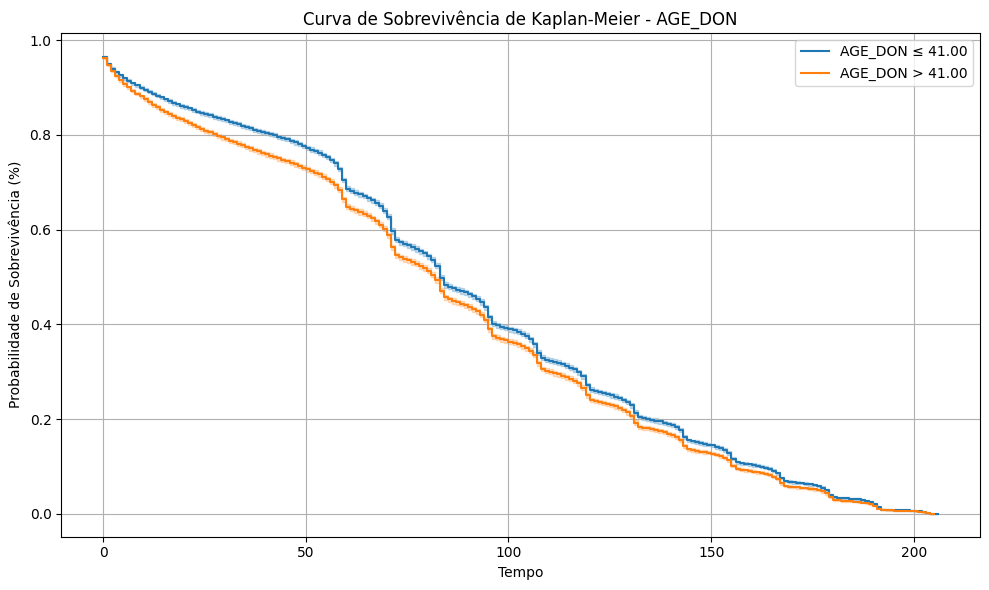

-------------------------------------------------- 

Analisando a variável: DGN_TCR

               coef  exp(coef)  se(coef)  coef lower 95%  coef upper 95%  \
covariate                                                                  
DGN_TCR   -0.000186   0.999814  0.000014       -0.000213       -0.000158   

           exp(coef) lower 95%  exp(coef) upper 95%  cmp to          z  \
covariate                                                                
DGN_TCR               0.999787             0.999842     0.0 -13.242744   

                      p    -log2(p)  
covariate                            
DGN_TCR    4.969939e-40  130.563896  


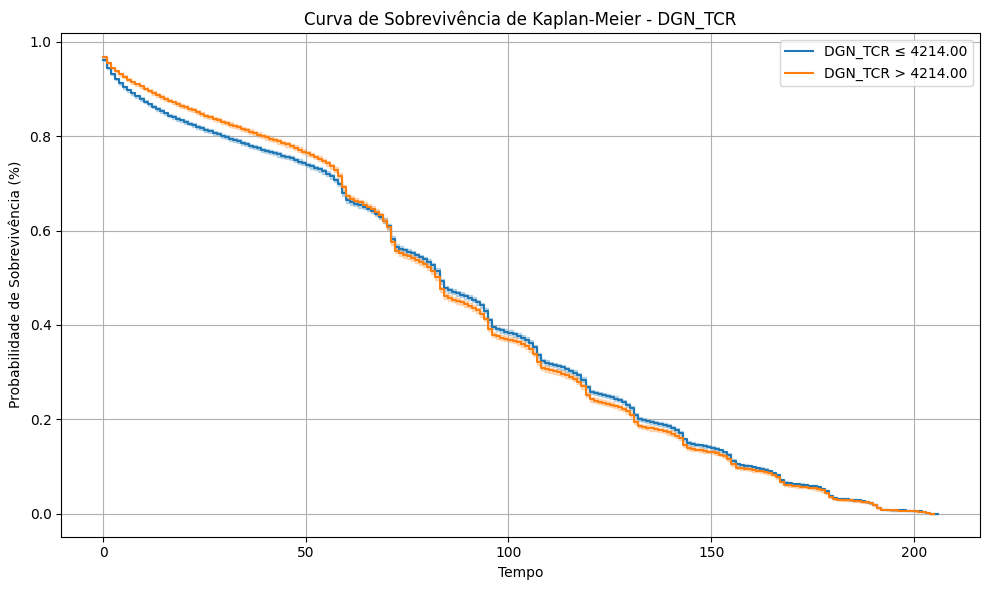

-------------------------------------------------- 

Analisando a variável: INIT_BMI_CALC

                   coef  exp(coef)  se(coef)  coef lower 95%  coef upper 95%  \
covariate                                                                      
INIT_BMI_CALC -0.008895   0.991144  0.002325       -0.013453       -0.004337   

               exp(coef) lower 95%  exp(coef) upper 95%  cmp to         z  \
covariate                                                                   
INIT_BMI_CALC             0.986637             0.995672     0.0 -3.825121   

                      p   -log2(p)  
covariate                           
INIT_BMI_CALC  0.000131  12.901368  


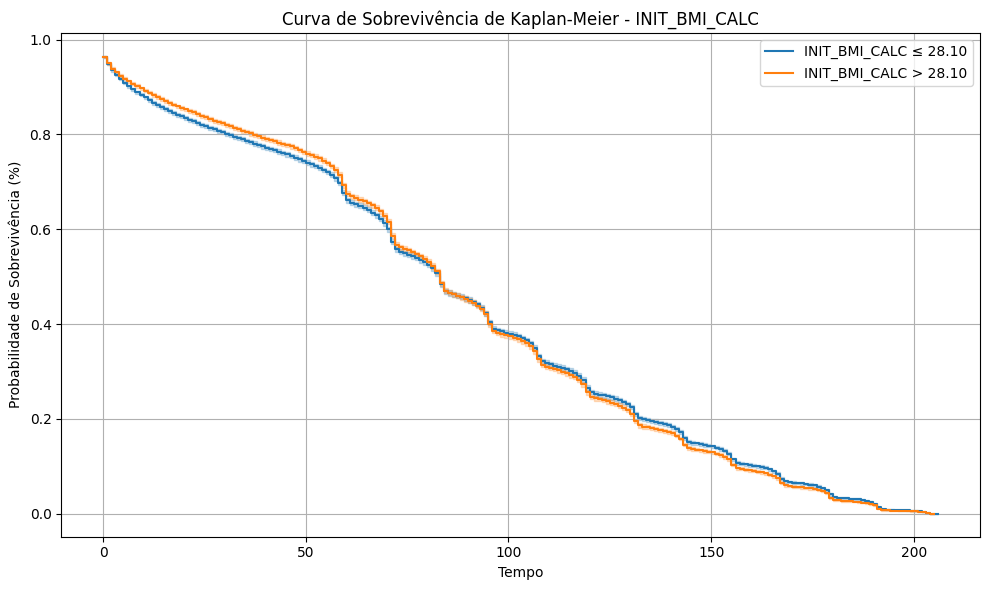

-------------------------------------------------- 

Analisando a variável: END_BMI_CALC

                  coef  exp(coef)  se(coef)  coef lower 95%  coef upper 95%  \
covariate                                                                     
END_BMI_CALC -0.010108   0.989943   0.00236       -0.014734       -0.005481   

              exp(coef) lower 95%  exp(coef) upper 95%  cmp to         z  \
covariate                                                                  
END_BMI_CALC             0.985374             0.994534     0.0 -4.282102   

                     p   -log2(p)  
covariate                          
END_BMI_CALC  0.000019  15.721054  


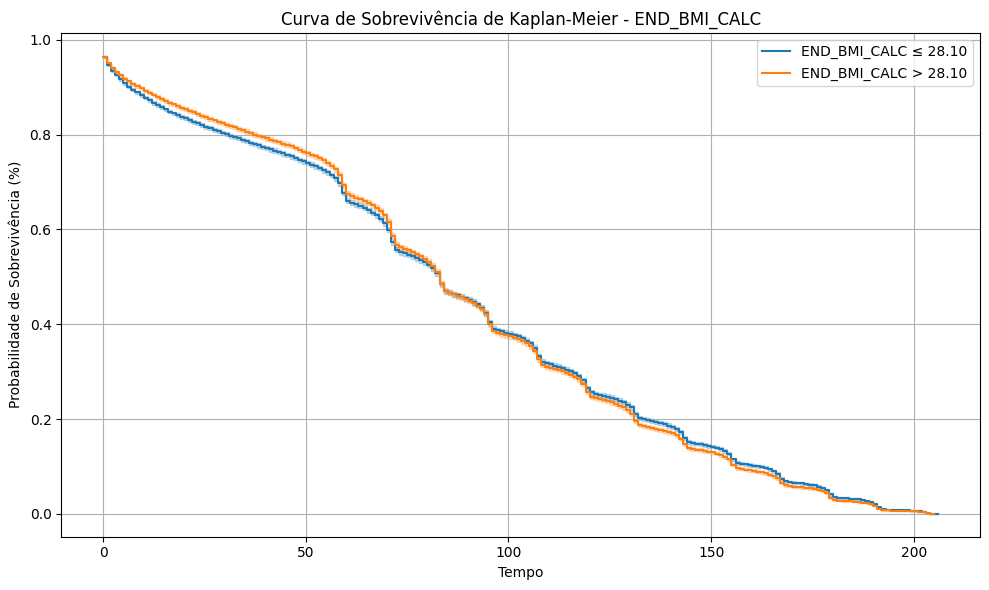

-------------------------------------------------- 

Analisando a variável: BMI_DON_CALC

                  coef  exp(coef)  se(coef)  coef lower 95%  coef upper 95%  \
covariate                                                                     
BMI_DON_CALC  0.000225   1.000225   0.00207       -0.003832        0.004282   

              exp(coef) lower 95%  exp(coef) upper 95%  cmp to         z  \
covariate                                                                  
BMI_DON_CALC             0.996176             1.004291     0.0  0.108759   

                     p  -log2(p)  
covariate                         
BMI_DON_CALC  0.913394  0.130691  


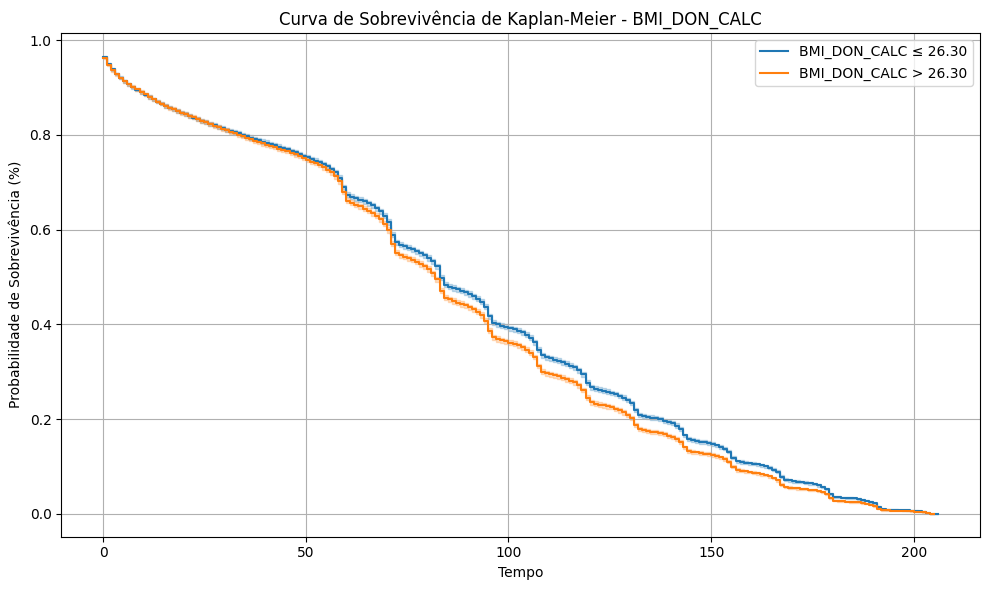

-------------------------------------------------- 

Analisando a variável: INIT_INR

              coef  exp(coef)  se(coef)  coef lower 95%  coef upper 95%  \
covariate                                                                 
INIT_INR   4.10955  60.919285  0.395274        3.334826        4.884273   

           exp(coef) lower 95%  exp(coef) upper 95%  cmp to          z  \
covariate                                                                
INIT_INR             28.073508           132.194352     0.0  10.396703   

                      p   -log2(p)  
covariate                           
INIT_INR   2.566595e-25  81.688347  


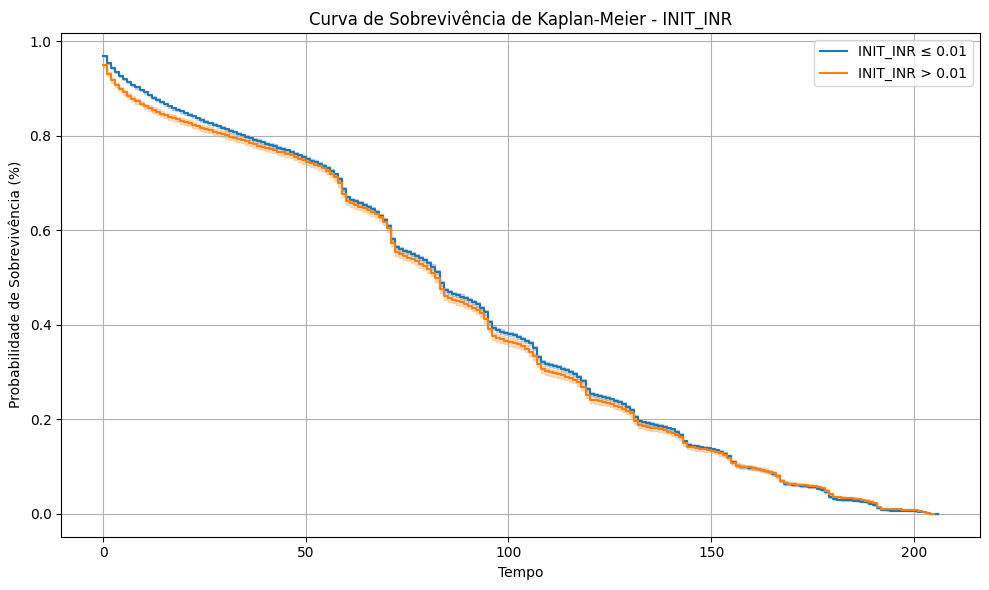

-------------------------------------------------- 

Analisando a variável: FINAL_INR

               coef  exp(coef)  se(coef)  coef lower 95%  coef upper 95%  \
covariate                                                                  
FINAL_INR  3.625419  37.540434  0.373995        2.892402        4.358435   

           exp(coef) lower 95%  exp(coef) upper 95%  cmp to        z  \
covariate                                                              
FINAL_INR             18.03659            78.134736     0.0  9.69377   

                      p   -log2(p)  
covariate                           
FINAL_INR  3.204749e-22  71.402207  


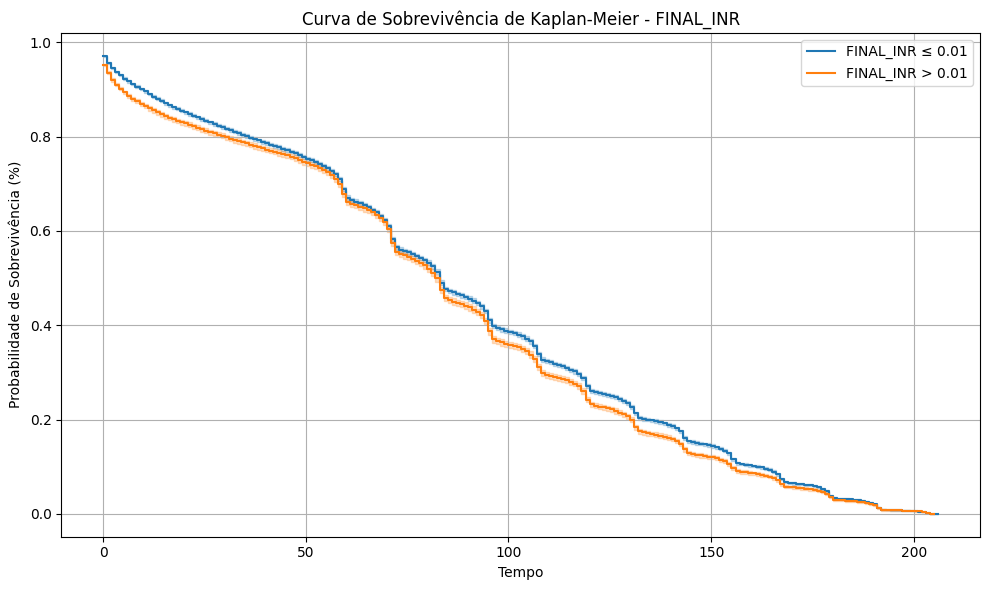

-------------------------------------------------- 

Analisando a variável: INIT_MELD_PELD_LAB_SCORE

                             coef  exp(coef)  se(coef)  coef lower 95%  \
covariate                                                                
INIT_MELD_PELD_LAB_SCORE  0.02515   1.025468  0.001219        0.022761   

                          coef upper 95%  exp(coef) lower 95%  \
covariate                                                       
INIT_MELD_PELD_LAB_SCORE        0.027539             1.023022   

                          exp(coef) upper 95%  cmp to          z  \
covariate                                                          
INIT_MELD_PELD_LAB_SCORE             1.027921     0.0  20.632812   

                                     p    -log2(p)  
covariate                                           
INIT_MELD_PELD_LAB_SCORE  1.393077e-94  311.782966  


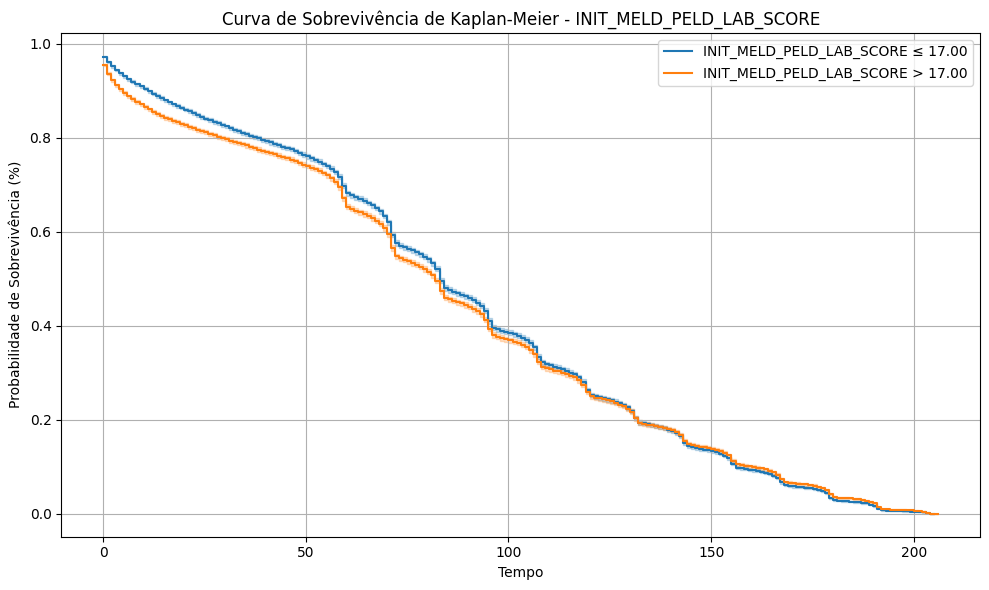

-------------------------------------------------- 

Analisando a variável: FINAL_MELD_PELD_LAB_SCORE

                               coef  exp(coef)  se(coef)  coef lower 95%  \
covariate                                                                  
FINAL_MELD_PELD_LAB_SCORE  0.028856   1.029276  0.001153        0.026596   

                           coef upper 95%  exp(coef) lower 95%  \
covariate                                                        
FINAL_MELD_PELD_LAB_SCORE        0.031116             1.026953   

                           exp(coef) upper 95%  cmp to          z  \
covariate                                                           
FINAL_MELD_PELD_LAB_SCORE             1.031605     0.0  25.025112   

                                       p    -log2(p)  
covariate                                             
FINAL_MELD_PELD_LAB_SCORE  3.258788e-138  456.721742  


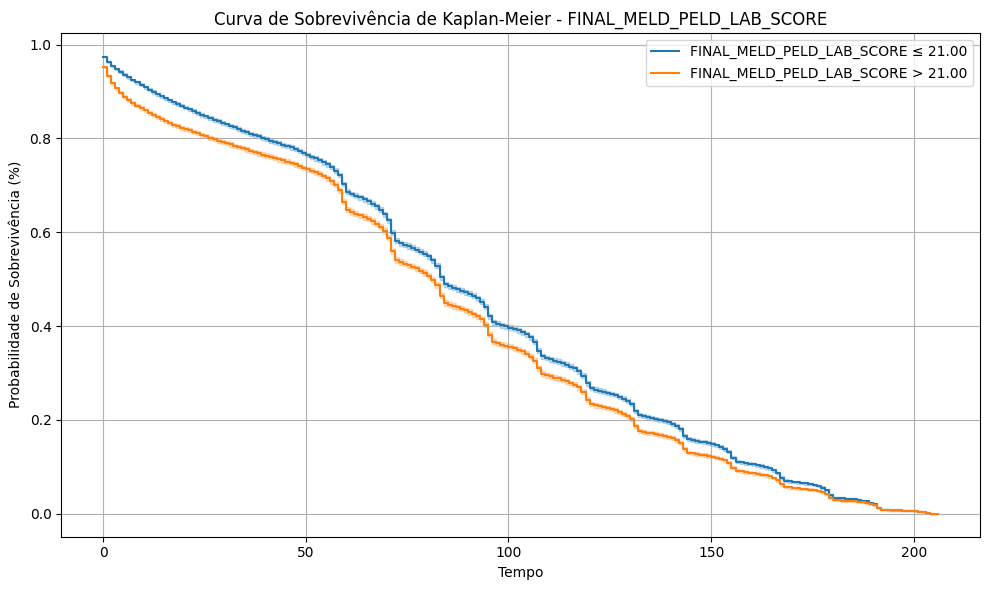

-------------------------------------------------- 

Analisando a variável: INIT_SERUM_SODIUM

                       coef  exp(coef)  se(coef)  coef lower 95%  \
covariate                                                          
INIT_SERUM_SODIUM  0.203285   1.225422  0.265113       -0.316327   

                   coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%  \
covariate                                                                     
INIT_SERUM_SODIUM        0.722897             0.728821             2.060393   

                   cmp to         z         p  -log2(p)  
covariate                                                
INIT_SERUM_SODIUM     0.0  0.766786  0.443209  1.173942  


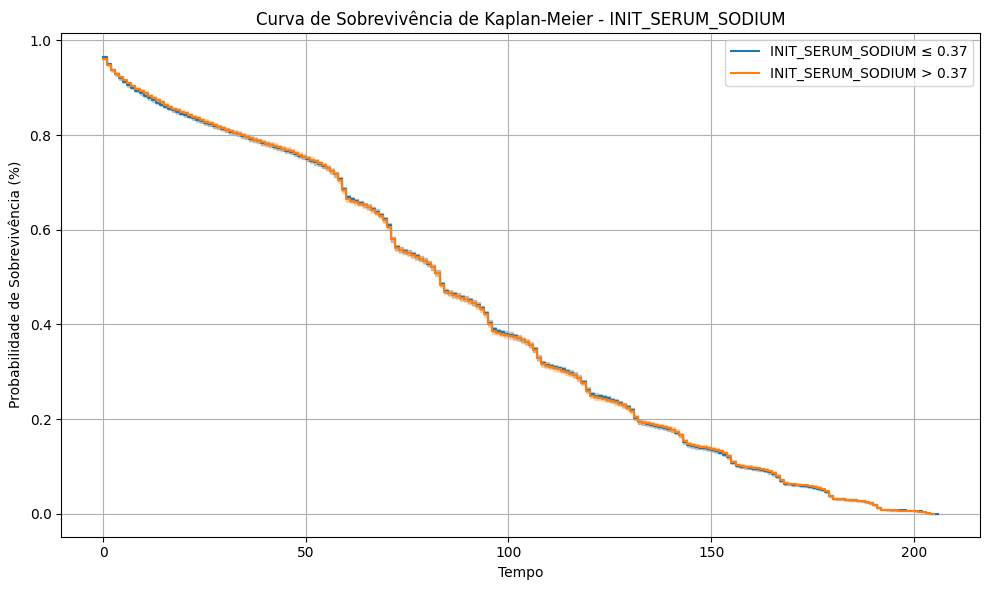

-------------------------------------------------- 

Analisando a variável: FINAL_SERUM_SODIUM

                        coef  exp(coef)  se(coef)  coef lower 95%  \
covariate                                                           
FINAL_SERUM_SODIUM  1.166236   3.209889  0.175071        0.823103   

                    coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%  \
covariate                                                                      
FINAL_SERUM_SODIUM         1.50937             2.277556             4.523878   

                    cmp to         z             p   -log2(p)  
covariate                                                      
FINAL_SERUM_SODIUM     0.0  6.661496  2.710542e-11  35.102628  


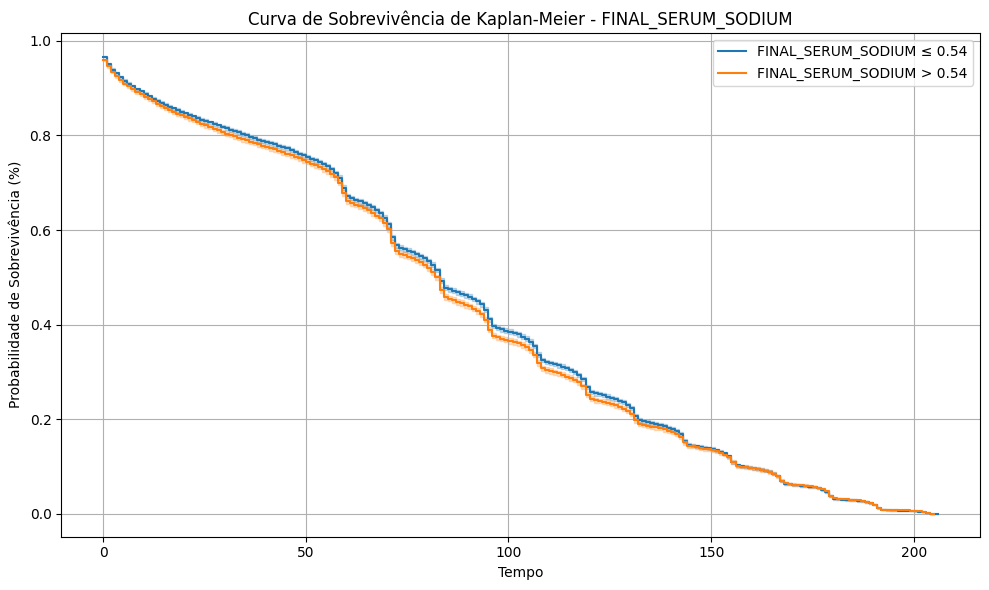

-------------------------------------------------- 

Analisando a variável: PREV_TX

               coef  exp(coef)  se(coef)  coef lower 95%  coef upper 95%  \
covariate                                                                  
PREV_TX    1.073213   2.924763  0.036549        1.001579        1.144848   

           exp(coef) lower 95%  exp(coef) upper 95%  cmp to          z  \
covariate                                                                
PREV_TX               2.722578             3.141963     0.0  29.363868   

                       p    -log2(p)  
covariate                             
PREV_TX    1.589637e-189  627.175713  


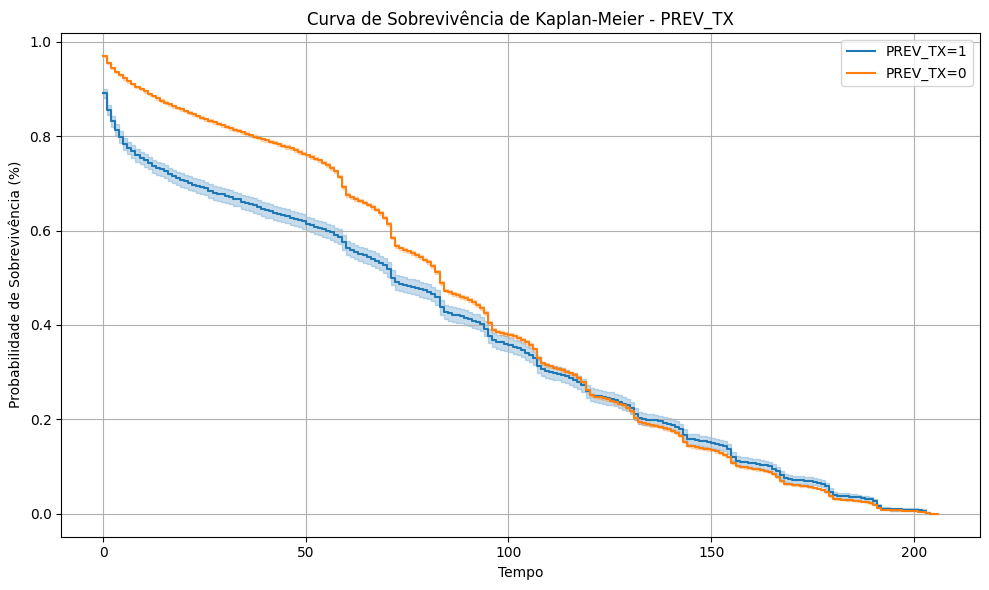

-------------------------------------------------- 

Analisando a variável: PREV_TX_ANY

                 coef  exp(coef)  se(coef)  coef lower 95%  coef upper 95%  \
covariate                                                                    
PREV_TX_ANY  1.053419   2.867438  0.035581         0.98368        1.123157   

             exp(coef) lower 95%  exp(coef) upper 95%  cmp to          z  \
covariate                                                                  
PREV_TX_ANY             2.674281             3.074546     0.0  29.605832   

                         p    -log2(p)  
covariate                               
PREV_TX_ANY  1.257068e-192  637.480131  


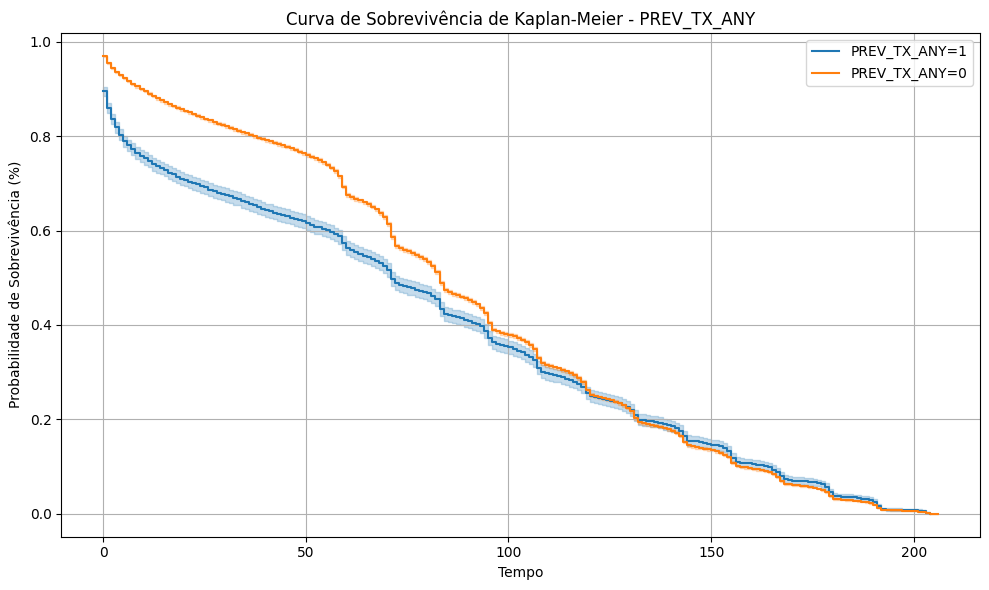

-------------------------------------------------- 

Analisando a variável: NUM_PREV_TX

                 coef  exp(coef)  se(coef)  coef lower 95%  coef upper 95%  \
covariate                                                                    
NUM_PREV_TX  0.464842   1.591762  0.017012        0.431499        0.498185   

             exp(coef) lower 95%  exp(coef) upper 95%  cmp to          z  \
covariate                                                                  
NUM_PREV_TX             1.539563             1.645731     0.0  27.324225   

                         p    -log2(p)  
covariate                               
NUM_PREV_TX  2.186767e-164  543.667408  


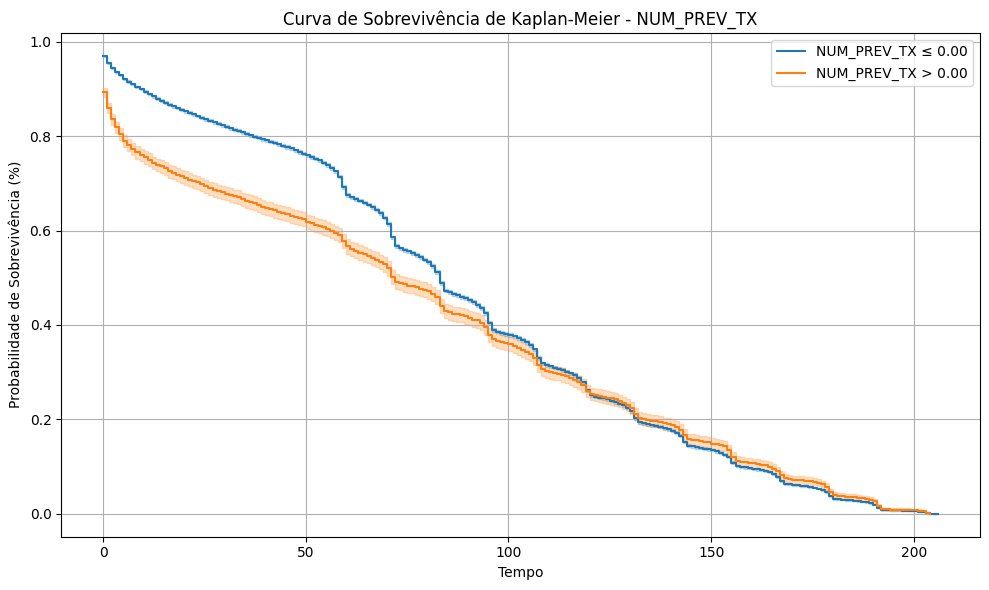

-------------------------------------------------- 

Analisando a variável: COD_CAD_DON

                 coef  exp(coef)  se(coef)  coef lower 95%  coef upper 95%  \
covariate                                                                    
COD_CAD_DON  0.014643    1.01475     0.011       -0.006917        0.036202   

             exp(coef) lower 95%  exp(coef) upper 95%  cmp to         z  \
covariate                                                                 
COD_CAD_DON             0.993107             1.036865     0.0  1.331153   

                    p  -log2(p)  
covariate                        
COD_CAD_DON  0.183139  2.448992  


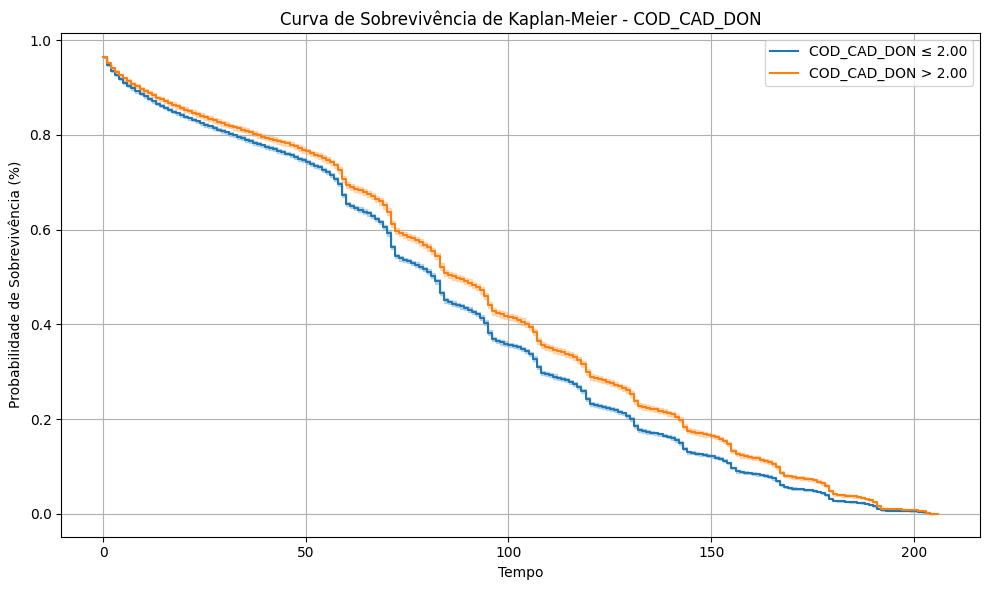

-------------------------------------------------- 

Analisando a variável: COLD_ISCH

               coef  exp(coef)  se(coef)  coef lower 95%  coef upper 95%  \
covariate                                                                  
COLD_ISCH  0.016879   1.017022  0.003682        0.009662        0.024096   

           exp(coef) lower 95%  exp(coef) upper 95%  cmp to         z  \
covariate                                                               
COLD_ISCH             1.009709             1.024388     0.0  4.584006   

                  p   -log2(p)  
covariate                       
COLD_ISCH  0.000005  17.742058  


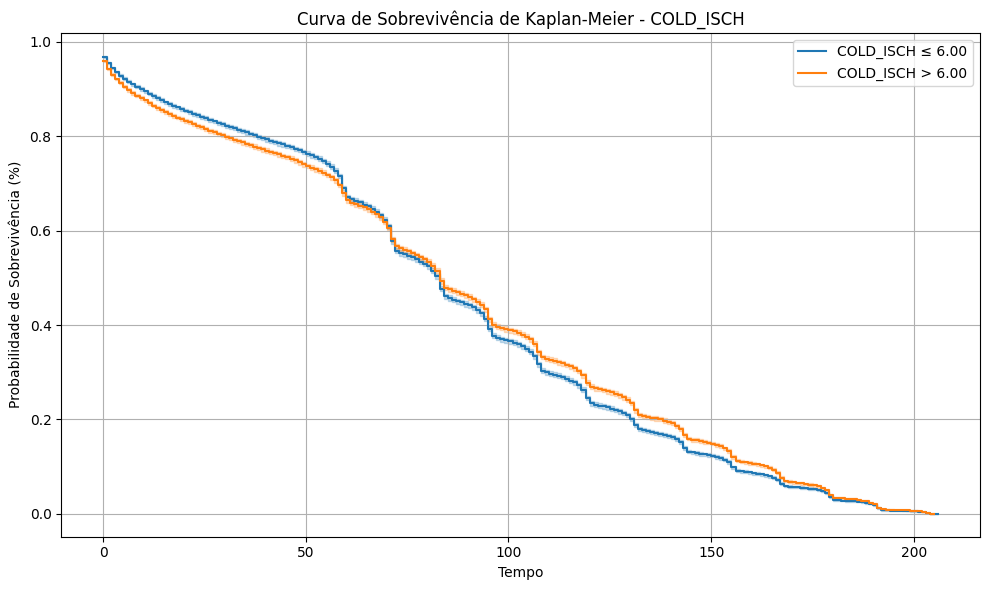

-------------------------------------------------- 



In [ ]:
from lifelines import CoxPHFitter, KaplanMeierFitter
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Criando o DataFrame (caso ainda não esteja carregado)
df_pandas = pd.read_csv("/content/drive/MyDrive/2024-5/liver_data_normalizado2.csv")

# Lista de variáveis independentes (biomarcadores)
variaveis_independentes = [
    "INIT_ALBUMIN", "FINAL_ALBUMIN", "INIT_ASCITES", "FINAL_ASCITES", "INIT_BILIRUBIN", "FINAL_BILIRUBIN",
    "INIT_SERUM_CREAT", "FINAL_SERUM_CREAT", "CREAT_DON", "DIAB", "DIABETES_DON", "HIST_INSULIN_DEP_DON",
    "INIT_DIALYSIS_PRIOR_WEEK", "FINAL_DIALYSIS_PRIOR_WEEK", "INIT_ENCEPH", "FINAL_ENCEPH", "ETHCAT",
    "ETHCAT_DON", "GENDER", "GENDER_DON", "INIT_AGE", "AGE_DON", "DGN_TCR", "INIT_BMI_CALC", "END_BMI_CALC",
    "BMI_DON_CALC", "INIT_INR", "FINAL_INR", "INIT_MELD_PELD_LAB_SCORE", "FINAL_MELD_PELD_LAB_SCORE",
    "INIT_SERUM_SODIUM", "FINAL_SERUM_SODIUM", "PREV_TX", "PREV_TX_ANY", "NUM_PREV_TX", "COD_CAD_DON", "COLD_ISCH"
]

df_pandas["evento"] = (df_pandas["tempo_sobrevida"]  <= 6).astype(int)


# Loop para criar uma análise de sobrevivência para cada biomarcador
for var in variaveis_independentes:
    print(f"Analisando a variável: {var}\n")

    # Criando um DataFrame temporário com apenas a variável de interesse
    df_temp = df_pandas[["tempo_sobrevida", "evento", var]].dropna()

    # Inicializando e ajustando o modelo de Cox
    cph = CoxPHFitter()
    cph.fit(df_temp, duration_col="tempo_sobrevida", event_col="evento")

    # Exibindo o resumo dos resultados
    print(cph.summary)

    plt.figure(figsize=(10, 6))

    if df_temp[var].dtype == 'object' or df_temp[var].nunique() < 5:
        # Para variáveis categóricas
        kmf = KaplanMeierFitter()
        for valor in df_temp[var].unique():
            mask = df_temp[var] == valor
            kmf.fit(
                df_temp[mask]["tempo_sobrevida"],
                ~df_temp[mask]["evento"],  # Invertendo o evento para representar falha ao invés de sucesso
                label=f'{var}={valor}'
            )
            kmf.plot()
    else:
        # Para variáveis contínuas, dividimos em grupos baseados na mediana
        mediana = df_temp[var].median()
        kmf = KaplanMeierFitter()

        # Grupo abaixo da mediana
        mask_baixo = df_temp[var] <= mediana
        kmf.fit(
            df_temp[mask_baixo]["tempo_sobrevida"],
            ~df_temp[mask_baixo]["evento"],
            label=f'{var} ≤ {mediana:.2f}'
        )
        kmf.plot()

        # Grupo acima da mediana
        mask_alto = df_temp[var] > mediana
        kmf.fit(
            df_temp[mask_alto]["tempo_sobrevida"],
            ~df_temp[mask_alto]["evento"],
            label=f'{var} > {mediana:.2f}'
        )
        kmf.plot()

    plt.title(f"Curva de Sobrevivência de Kaplan-Meier - {var}")
    plt.xlabel("Tempo")
    plt.ylabel("Probabilidade de Sobrevivência (%)")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    print("-" * 50, "\n")

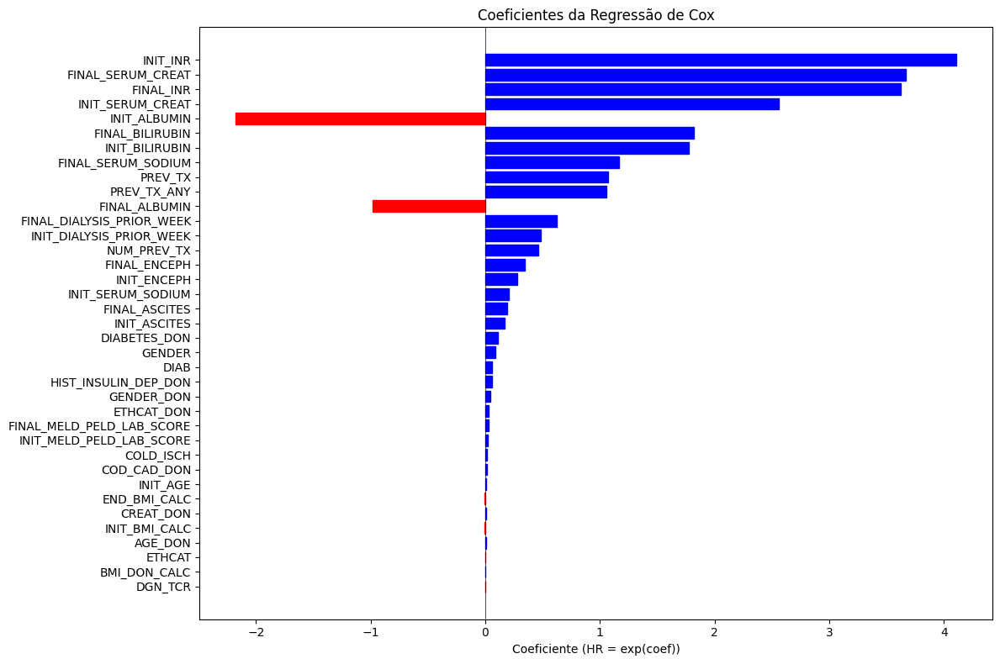

In [ ]:
# Calculando os coeficientes
coef_dict = {}
p_values = {}
for var in variaveis_independentes:
    df_temp = df_pandas[["tempo_sobrevida", "evento", var]].dropna()
    cph = CoxPHFitter()
    cph.fit(df_temp, duration_col="tempo_sobrevida", event_col="evento")
    coef_dict[var] = cph.params_[var]
    # Usando o método correto para obter o p-valor
    p_values[var] = cph.summary.loc[var, 'p']

# Criando um DataFrame com os resultados
import pandas as pd
coef_df = pd.DataFrame({
    'Variável': list(coef_dict.keys()),
    'Coeficiente': list(coef_dict.values()),
    'p_valor': list(p_values.values())
})

# Ordenando por valor absoluto do coeficiente
coef_df['abs_coef'] = abs(coef_df['Coeficiente'])
coef_df = coef_df.sort_values('abs_coef', ascending=True)

# Plotando o gráfico
plt.figure(figsize=(12, 8))

# Criando as barras horizontais
bars = plt.barh(y=range(len(coef_df)), width=coef_df['Coeficiente'])

# Adicionando cores diferentes para coeficientes positivos e negativos
for i, bar in enumerate(bars):
    if bar.get_width() < 0:
        bar.set_color('red')
    else:
        bar.set_color('blue')

# Customizando o gráfico
plt.yticks(range(len(coef_df)), coef_df['Variável'])
plt.xlabel('Coeficiente (HR = exp(coef))')
plt.title('Coeficientes da Regressão de Cox')

# Adicionando uma linha vertical em x=0 para referência
plt.axvline(x=0, color='black', linestyle='-', linewidth=0.5)


# Ajustando o layout para evitar cortes
plt.tight_layout()

plt.show()

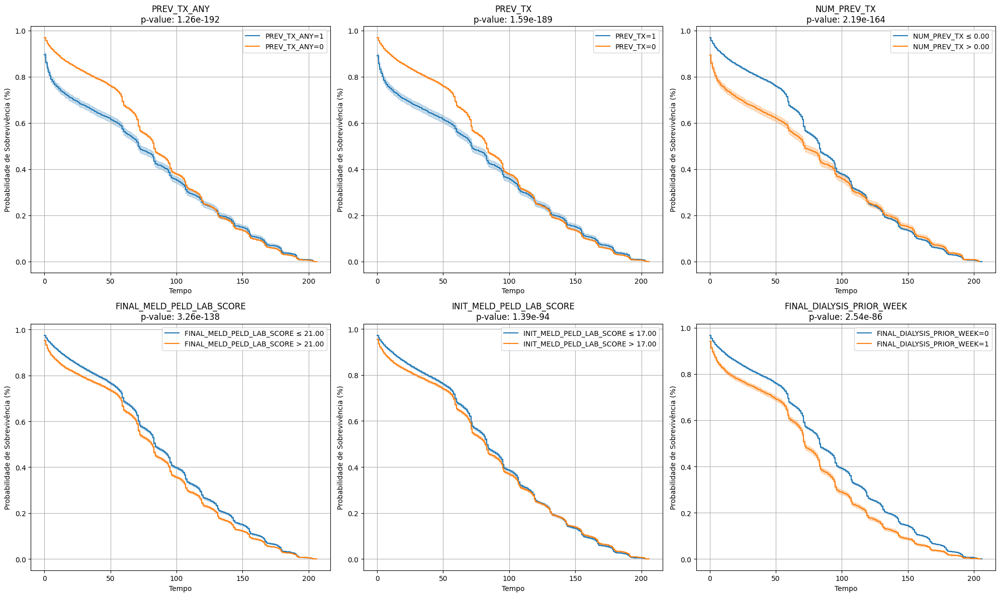


Variáveis ordenadas por significância (p-valor):
PREV_TX_ANY: p-valor = 1.26e-192, coef = 1.053
PREV_TX: p-valor = 1.59e-189, coef = 1.073
NUM_PREV_TX: p-valor = 2.19e-164, coef = 0.465
FINAL_MELD_PELD_LAB_SCORE: p-valor = 3.26e-138, coef = 0.029
INIT_MELD_PELD_LAB_SCORE: p-valor = 1.39e-94, coef = 0.025
FINAL_DIALYSIS_PRIOR_WEEK: p-valor = 2.54e-86, coef = 0.621
FINAL_BILIRUBIN: p-valor = 6.94e-86, coef = 1.823
FINAL_ENCEPH: p-valor = 8.07e-76, coef = 0.345
INIT_BILIRUBIN: p-valor = 4.67e-56, coef = 1.774
FINAL_SERUM_CREAT: p-valor = 3.04e-53, coef = 3.669
INIT_ENCEPH: p-valor = 5.83e-42, coef = 0.282
INIT_SERUM_CREAT: p-valor = 4.28e-40, coef = 2.558
DGN_TCR: p-valor = 4.97e-40, coef = -0.000
INIT_ALBUMIN: p-valor = 2.02e-33, coef = -2.178
INIT_DIALYSIS_PRIOR_WEEK: p-valor = 2.03e-32, coef = 0.488
FINAL_ASCITES: p-valor = 1.15e-28, coef = 0.195
INIT_INR: p-valor = 2.57e-25, coef = 4.110
FINAL_INR: p-valor = 3.20e-22, coef = 3.625
INIT_ASCITES: p-valor = 1.84e-20, coef = 0.168
INIT_A

In [ ]:
from lifelines import CoxPHFitter, KaplanMeierFitter
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Criando dicionário para armazenar os resultados
coef_dict = {}
p_values_dict = {}

for var in variaveis_independentes:
    df_temp = df_pandas[["tempo_sobrevida", "evento", var]].dropna()

    # Ajustando o modelo de Cox
    cph = CoxPHFitter()
    cph.fit(df_temp, duration_col="tempo_sobrevida", event_col="evento")

    # Armazenando coeficiente e p-valor
    coef_dict[var] = cph.params_[var]
    p_values_dict[var] = cph.summary.iloc[0]['p']

# Ordenando variáveis por significância (p-valor)
sorted_vars = sorted(p_values_dict.items(), key=lambda x: x[1])
top_significant_vars = [var for var, p_value in sorted_vars[:6]]  # Pegando as 6 variáveis mais significativas

# Criando subplots para as variáveis mais significativas
fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes = axes.ravel()

for idx, var in enumerate(top_significant_vars):
    df_temp = df_pandas[["tempo_sobrevida", "evento", var]].dropna()

    if df_temp[var].dtype == 'object' or df_temp[var].nunique() < 5:
        # Para variáveis categóricas
        kmf = KaplanMeierFitter()
        for valor in df_temp[var].unique():
            mask = df_temp[var] == valor
            kmf.fit(
                df_temp[mask]["tempo_sobrevida"],
                ~df_temp[mask]["evento"],
                label=f'{var}={valor}'
            )
            kmf.plot(ax=axes[idx])
    else:
        # Para variáveis contínuas, dividimos em grupos baseados na mediana
        mediana = df_temp[var].median()
        kmf = KaplanMeierFitter()

        # Grupo abaixo da mediana
        mask_baixo = df_temp[var] <= mediana
        kmf.fit(
            df_temp[mask_baixo]["tempo_sobrevida"],
            ~df_temp[mask_baixo]["evento"],
            label=f'{var} ≤ {mediana:.2f}'
        )
        kmf.plot(ax=axes[idx])

        # Grupo acima da mediana
        mask_alto = df_temp[var] > mediana
        kmf.fit(
            df_temp[mask_alto]["tempo_sobrevida"],
            ~df_temp[mask_alto]["evento"],
            label=f'{var} > {mediana:.2f}'
        )
        kmf.plot(ax=axes[idx])

    axes[idx].set_title(f'{var}\np-value: {p_values_dict[var]:.2e}')
    axes[idx].grid(True)
    axes[idx].set_xlabel('Tempo')
    axes[idx].set_ylabel('Probabilidade de Sobrevivência (%)')

plt.tight_layout()
plt.show()

# Imprimindo os resultados ordenados por significância
print("\nVariáveis ordenadas por significância (p-valor):")
for var, p_value in sorted_vars:
    print(f"{var}: p-valor = {p_value:.2e}, coef = {coef_dict[var]:.3f}")


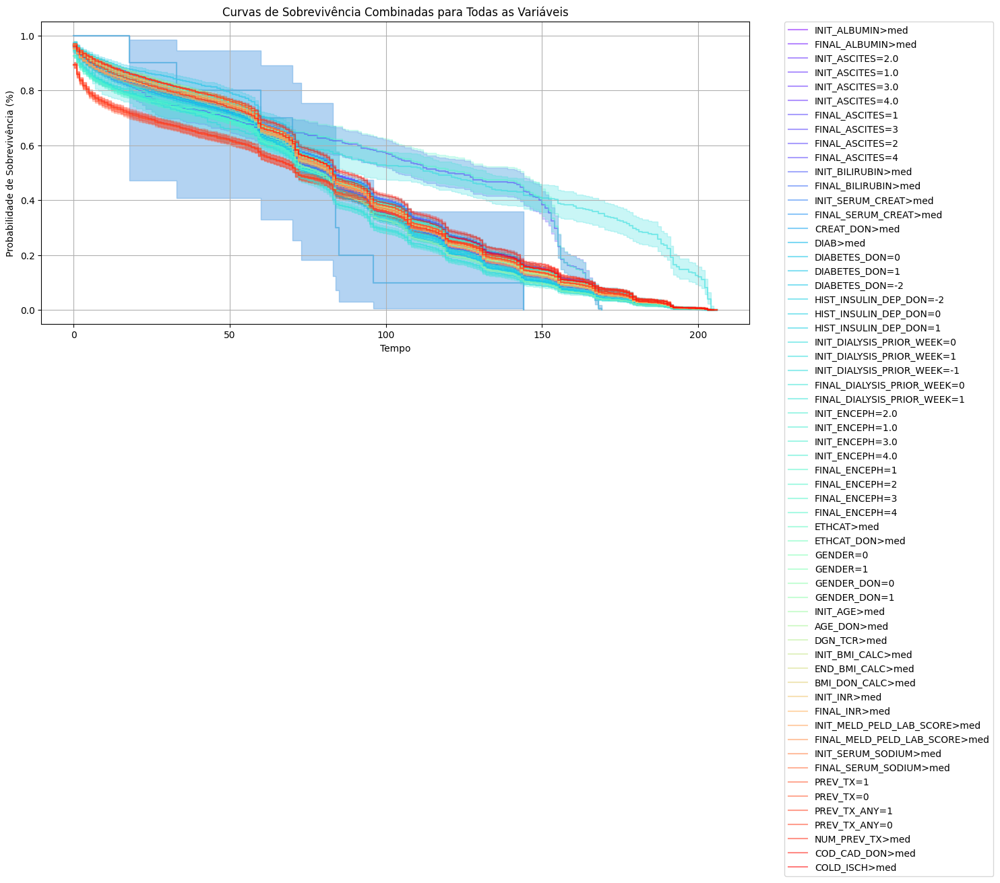


Variáveis ordenadas por significância (p-valor):
PREV_TX_ANY: p-valor = 1.26e-192, coef = 1.053
PREV_TX: p-valor = 1.59e-189, coef = 1.073
NUM_PREV_TX: p-valor = 2.19e-164, coef = 0.465
FINAL_MELD_PELD_LAB_SCORE: p-valor = 3.26e-138, coef = 0.029
INIT_MELD_PELD_LAB_SCORE: p-valor = 1.39e-94, coef = 0.025
FINAL_DIALYSIS_PRIOR_WEEK: p-valor = 2.54e-86, coef = 0.621
FINAL_BILIRUBIN: p-valor = 6.94e-86, coef = 1.823
FINAL_ENCEPH: p-valor = 8.07e-76, coef = 0.345
INIT_BILIRUBIN: p-valor = 4.67e-56, coef = 1.774
FINAL_SERUM_CREAT: p-valor = 3.04e-53, coef = 3.669
INIT_ENCEPH: p-valor = 5.83e-42, coef = 0.282
INIT_SERUM_CREAT: p-valor = 4.28e-40, coef = 2.558
DGN_TCR: p-valor = 4.97e-40, coef = -0.000
INIT_ALBUMIN: p-valor = 2.02e-33, coef = -2.178
INIT_DIALYSIS_PRIOR_WEEK: p-valor = 2.03e-32, coef = 0.488
FINAL_ASCITES: p-valor = 1.15e-28, coef = 0.195
INIT_INR: p-valor = 2.57e-25, coef = 4.110
FINAL_INR: p-valor = 3.20e-22, coef = 3.625
INIT_ASCITES: p-valor = 1.84e-20, coef = 0.168
INIT_A

In [ ]:
from lifelines import CoxPHFitter, KaplanMeierFitter
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Criar uma figura grande para acomodar todas as curvas
plt.figure(figsize=(15, 10))

# Dicionário para armazenar os resultados
coef_dict = {}
p_values_dict = {}
kmf = KaplanMeierFitter()

# Lista para armazenar as linhas do gráfico (para a legenda)
lines = []
labels = []

# Cores diferentes para cada variável
colors = plt.cm.rainbow(np.linspace(0, 1, len(variaveis_independentes)))

for idx, var in enumerate(variaveis_independentes):
    df_temp = df_pandas[["tempo_sobrevida", "evento", var]].dropna()

    # Ajustando o modelo de Cox e armazenando resultados
    cph = CoxPHFitter()
    cph.fit(df_temp, duration_col="tempo_sobrevida", event_col="evento")
    coef_dict[var] = cph.params_[var]
    p_values_dict[var] = cph.summary.iloc[0]['p']

    # Estilo da linha para esta variável
    linestyle = '-'

    if df_temp[var].dtype == 'object' or df_temp[var].nunique() < 5:
        # Para variáveis categóricas, usamos valores únicos
        grupos = df_temp[var].unique()
        for valor in grupos:
            mask = df_temp[var] == valor
            if sum(mask) > 0:  # Verificar se há dados suficientes
                kmf.fit(
                    df_temp[mask]["tempo_sobrevida"],
                    ~df_temp[mask]["evento"]
                )
                line = kmf.plot(
                    label=f'{var}={valor}',
                    color=colors[idx],
                    linestyle=linestyle,
                    alpha=0.5
                )
    else:
        # Para variáveis contínuas, dividimos pela mediana
        mediana = df_temp[var].median()

        # Grupo acima da mediana
        mask_alto = df_temp[var] > mediana
        if sum(mask_alto) > 0:
            kmf.fit(
                df_temp[mask_alto]["tempo_sobrevida"],
                ~df_temp[mask_alto]["evento"]
            )
            line = kmf.plot(
                label=f'{var}>med',
                color=colors[idx],
                linestyle='-',
                alpha=0.5
            )

# Configurações do gráfico
plt.title('Curvas de Sobrevivência Combinadas para Todas as Variáveis')
plt.xlabel('Tempo')
plt.ylabel('Probabilidade de Sobrevivência (%)')
plt.grid(True)

# Ajustando a legenda
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.tight_layout()
plt.show()

# Imprimindo os resultados ordenados por significância
print("\nVariáveis ordenadas por significância (p-valor):")
sorted_vars = sorted(p_values_dict.items(), key=lambda x: x[1])
for var, p_value in sorted_vars:
    print(f"{var}: p-valor = {p_value:.2e}, coef = {coef_dict[var]:.3f}")

## Plote individual da analise multipla

In [ ]:
!pip install lifelines

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 349.3/349.3 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.7/115.7 kB 7.7 MB/s eta 0:00:00
  Created wheel for autograd-gamma: filename=autograd_gamma-0.5.0-py3-none-any.whl size=4031 sha256=2450b6434ed35c1f6ca8ef1d810984668dff91bf9e71daf21a6401154aa456c0
  Stored in directory: /root/.cache/pip/wheels/8b/67/f4/2caaae2146198dcb824f31a303833b07b14a5ec863fb3acd7b
Successfully built autograd-gamma


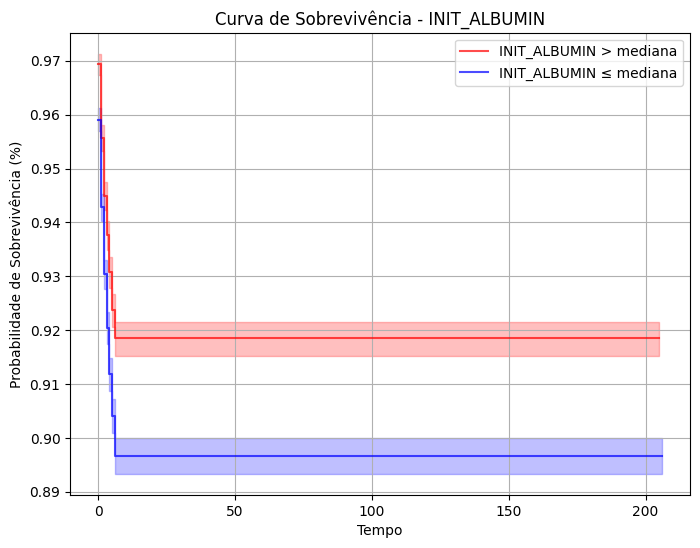

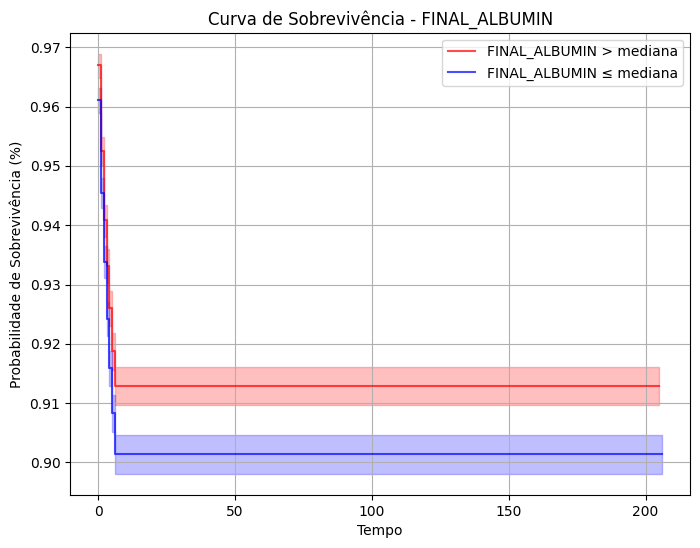

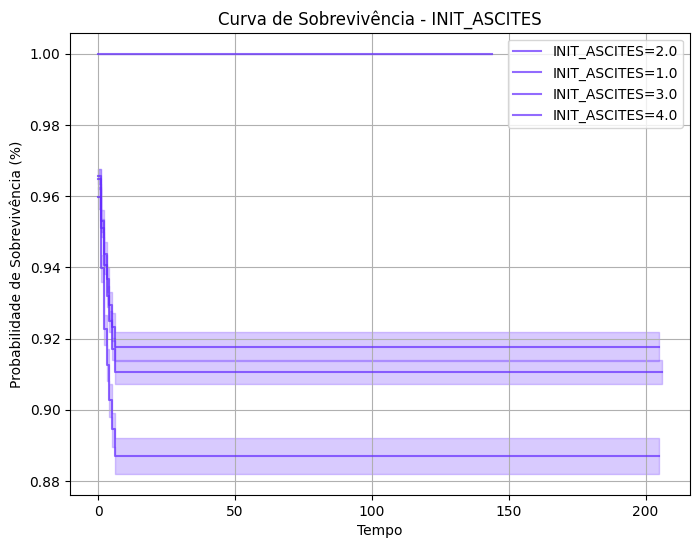

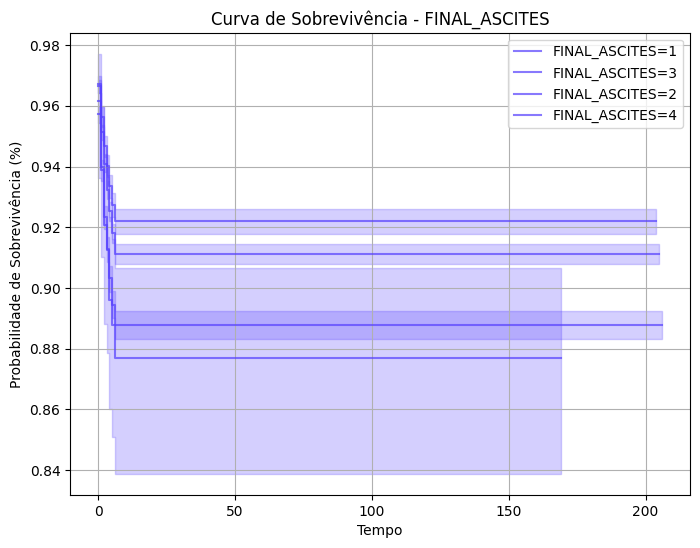

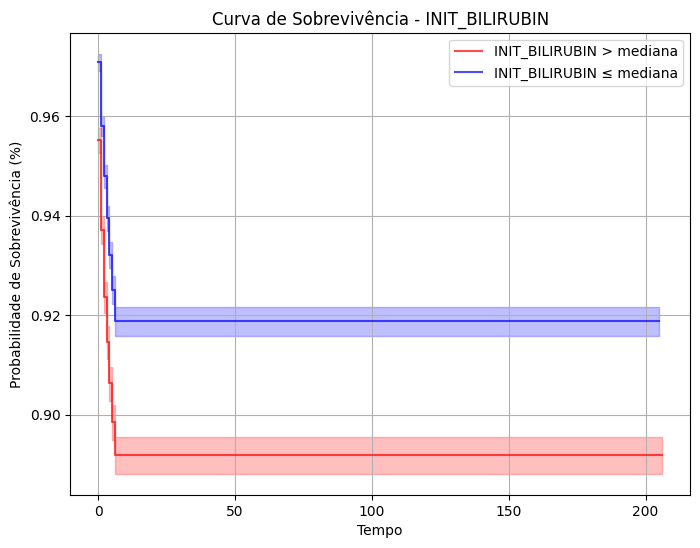

...

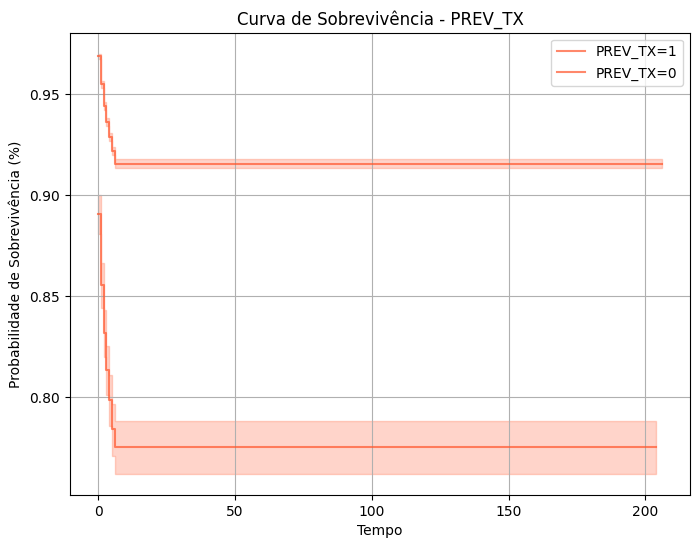

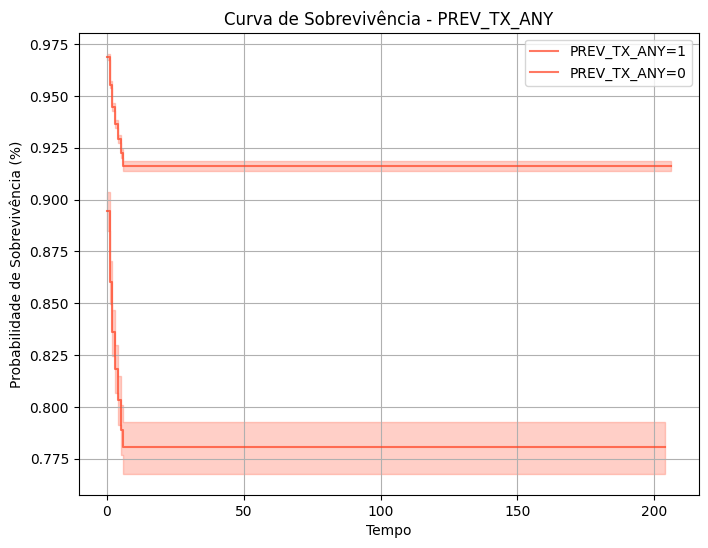

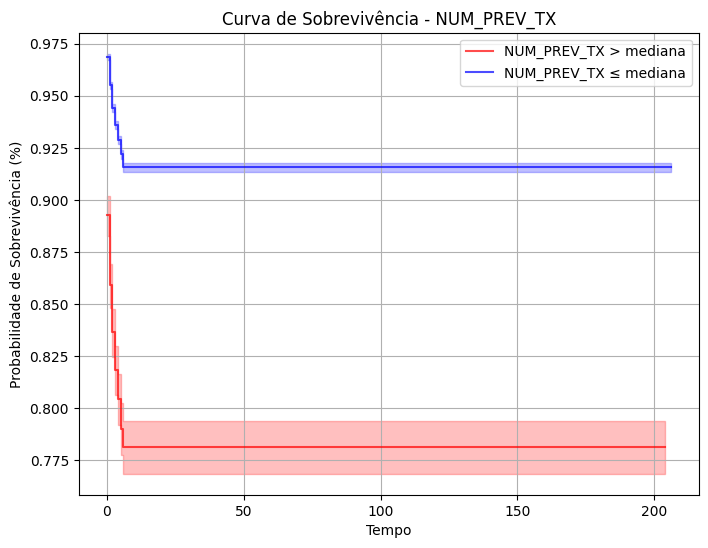

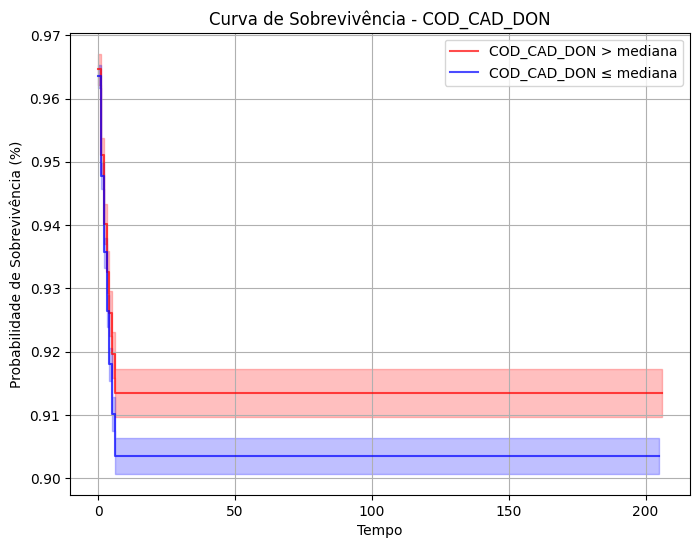

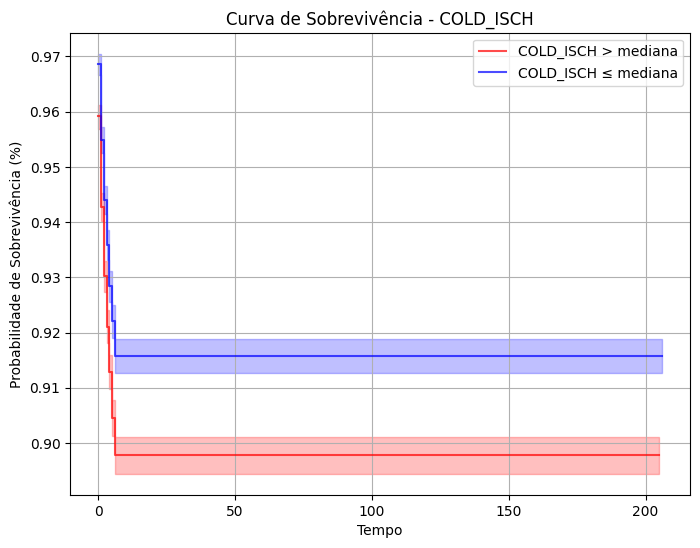


Variáveis ordenadas por significância (p-valor):
PREV_TX_ANY: p-valor = 1.26e-192, coef = 1.053
PREV_TX: p-valor = 1.59e-189, coef = 1.073
NUM_PREV_TX: p-valor = 2.19e-164, coef = 0.465
FINAL_MELD_PELD_LAB_SCORE: p-valor = 3.26e-138, coef = 0.029
INIT_MELD_PELD_LAB_SCORE: p-valor = 1.39e-94, coef = 0.025
FINAL_DIALYSIS_PRIOR_WEEK: p-valor = 2.54e-86, coef = 0.621
FINAL_BILIRUBIN: p-valor = 6.94e-86, coef = 1.823
FINAL_ENCEPH: p-valor = 8.07e-76, coef = 0.345
INIT_BILIRUBIN: p-valor = 4.67e-56, coef = 1.774
FINAL_SERUM_CREAT: p-valor = 3.04e-53, coef = 3.669
INIT_ENCEPH: p-valor = 5.83e-42, coef = 0.282
INIT_SERUM_CREAT: p-valor = 4.28e-40, coef = 2.558
DGN_TCR: p-valor = 4.97e-40, coef = -0.000
INIT_ALBUMIN: p-valor = 2.02e-33, coef = -2.178
INIT_DIALYSIS_PRIOR_WEEK: p-valor = 2.03e-32, coef = 0.488
FINAL_ASCITES: p-valor = 1.15e-28, coef = 0.195
INIT_INR: p-valor = 2.57e-25, coef = 4.110
FINAL_INR: p-valor = 3.20e-22, coef = 3.625
INIT_ASCITES: p-valor = 1.84e-20, coef = 0.168
INIT_A

In [ ]:
from lifelines import CoxPHFitter, KaplanMeierFitter
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Dicionário para armazenar os resultados
coef_dict = {}
p_values_dict = {}
kmf = KaplanMeierFitter()

# Cores diferentes para cada variável
colors = plt.cm.rainbow(np.linspace(0, 1, len(variaveis_independentes)))

for idx, var in enumerate(variaveis_independentes):
    df_temp = df_pandas[["tempo_sobrevida", "evento", var]].dropna()

    # Ajustando o modelo de Cox e armazenando resultados
    cph = CoxPHFitter()
    cph.fit(df_temp, duration_col="tempo_sobrevida", event_col="evento")
    coef_dict[var] = cph.params_[var]
    p_values_dict[var] = cph.summary.iloc[0]['p']

    # Criar uma nova figura para cada variável
    plt.figure(figsize=(8, 6))

    if df_temp[var].dtype == 'object' or df_temp[var].nunique() < 5:
        # Para variáveis categóricas
        grupos = df_temp[var].unique()
        for valor in grupos:
            mask = df_temp[var] == valor
            if sum(mask) > 0:
                kmf.fit(
                    df_temp[mask]["tempo_sobrevida"],
                    event_observed=df_temp[mask]["evento"]
                )
                kmf.plot(label=f'{var}={valor}', color=colors[idx], alpha=0.7)

    else:
        # Para variáveis contínuas, dividimos pela mediana
        mediana = df_temp[var].median()

        mask_alto = df_temp[var] > mediana
        mask_baixo = df_temp[var] <= mediana

        if sum(mask_alto) > 0:
            kmf.fit(
                df_temp[mask_alto]["tempo_sobrevida"],
                event_observed=df_temp[mask_alto]["evento"]
            )
            kmf.plot(label=f'{var} > mediana', color='red', alpha=0.7)

        if sum(mask_baixo) > 0:
            kmf.fit(
                df_temp[mask_baixo]["tempo_sobrevida"],
                event_observed=df_temp[mask_baixo]["evento"]
            )
            kmf.plot(label=f'{var} ≤ mediana', color='blue', alpha=0.7)

    # Configurações do gráfico individual
    plt.title(f'Curva de Sobrevivência - {var}')
    plt.xlabel('Tempo')
    plt.ylabel('Probabilidade de Sobrevivência (%)')
    plt.grid(True)
    plt.legend()
    plt.show()

# Imprimindo os resultados ordenados por significância
print("\nVariáveis ordenadas por significância (p-valor):")
sorted_vars = sorted(p_values_dict.items(), key=lambda x: x[1])
for var, p_value in sorted_vars:
    print(f"{var}: p-valor = {p_value:.2e}, coef = {coef_dict[var]:.3f}")


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from lifelines import CoxPHFitter
import numpy as np

# Lista para armazenar as curvas de risco
hazard_dict = {}

# Ajuste do modelo de Cox e cálculo da função de risco
for var in variaveis_independentes:
    df_temp = df_pandas[["tempo_sobrevida", "evento", var]].dropna()

    # Amostragem para reduzir o uso de memória (opcional)
    df_temp_sample = df_temp.sample(frac=0.1, random_state=42)  # Usando 10% dos dados

    cph = CoxPHFitter()
    cph.fit(df_temp_sample, duration_col="tempo_sobrevida", event_col="evento")

    # Gerando o valor do risco para diferentes valores da variável (usando apenas 2 quantis)
    quantiles = np.percentile(df_temp[var], [25, 75])  # Usando apenas os quartis 25 e 75 para reduzir o número de curvas
    for q in quantiles:
        df_temp_copy = df_temp.copy()
        df_temp_copy[var] = q  # Substitui a variável pelo valor do quantil
        hazard_dict[f'{var}_q{int(q)}'] = cph.predict_cumulative_hazard(df_temp_copy)

# Plotando as curvas de hazard para cada quantil das variáveis
plt.figure(figsize=(12, 8))

for label, hazard in hazard_dict.items():
    plt.plot(hazard.index, hazard.values, label=label)

plt.title("Curvas de Hazard para Diferentes Valores das Variáveis")
plt.xlabel("Tempo")
plt.ylabel("Cumulative Hazard")
plt.legend(title="Variáveis e Quartis")
plt.tight_layout()
plt.show()


/usr/local/lib/python3.11/dist-packages/lifelines/utils/__init__.py:1100: ConvergenceWarning: Column(s) ['INIT_INR'] have very low variance. This may harm convergence. 1) Are you using formula's? Did you mean to add '-1' to the end. 2) Try dropping this redundant column before fitting if convergence fails.

  warnings.warn(dedent(warning_text), ConvergenceWarning)


# Random Forest

## ATé 6 meses

###Com SMOTE

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, classification_report
from imblearn.over_sampling import SMOTE
from google.colab import drive
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
drive.mount('/content/drive')
file_path = "/content/drive/MyDrive/2024-5/liver_data_normalizado2.csv"

# Carregar os dados
df = pd.read_csv("/content/drive/MyDrive/2024-5/liver_data_normalizado2.csv")

# Definir variáveis independentes e dependente
variaveis_independentes = [
    "INIT_ALBUMIN", "FINAL_ALBUMIN", "INIT_ASCITES", "FINAL_ASCITES", "INIT_BILIRUBIN", "FINAL_BILIRUBIN",
    "INIT_SERUM_CREAT", "FINAL_SERUM_CREAT", "CREAT_DON", "DIAB", "DIABETES_DON", "HIST_INSULIN_DEP_DON",
    "INIT_DIALYSIS_PRIOR_WEEK", "FINAL_DIALYSIS_PRIOR_WEEK", "INIT_ENCEPH", "FINAL_ENCEPH", "ETHCAT",
    "ETHCAT_DON", "GENDER", "GENDER_DON", "INIT_AGE", "AGE_DON", "DGN_TCR", "INIT_BMI_CALC", "END_BMI_CALC",
    "BMI_DON_CALC", "INIT_INR", "FINAL_INR", "INIT_MELD_PELD_LAB_SCORE", "FINAL_MELD_PELD_LAB_SCORE",
    "INIT_SERUM_SODIUM", "FINAL_SERUM_SODIUM", "PREV_TX", "PREV_TX_ANY", "NUM_PREV_TX", "COD_CAD_DON", "COLD_ISCH"
]

df["evento"] = (df["tempo_sobrevida"] <= 6).astype(int)  # Criando a variável alvo

# Remover colunas não numéricas e preencher valores ausentes
X = df[variaveis_independentes].select_dtypes(include=[np.number])
y = df["evento"]

# Tratamento de valores ausentes
imputer = SimpleImputer(strategy="median")
X_imputed = imputer.fit_transform(X)

# Normalização dos dados
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Instanciando SMOTE com uma estratégia de amostragem de 0.2 (20%)
smote = SMOTE(sampling_strategy= 0.2, random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_scaled, y)

# Dividir os dados em treino (70%) e teste (30%)
X_train, X_test, y_train, y_test = train_test_split(X_train_resampled, y_train_resampled, test_size=0.3, random_state=42)

# Criar e treinar o modelo
model = RandomForestClassifier(max_depth = None, max_features= 'sqrt', min_samples_leaf= 1, min_samples_split= 2, n_estimators = 200)
model.fit(X_train, y_train)

# Fazer previsões
y_pred = model.predict(X_test)

# Avaliar o modelo

accuracy = accuracy_score(y_test, y_pred)
matriz_confusao = confusion_matrix(y_test, y_pred)
print(f"Acurácia do modelo: {accuracy:.4f}")
print("Relatório de Classificação:")
print(classification_report(y_test, y_pred))
print(matriz_confusao)

KeyboardInterrupt: 

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, auc

# Criar matriz de confusão
cm = confusion_matrix(y_test, y_pred)

# Plotar a matriz de confusão
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Sobreviveu", "Desfecho negativo"], yticklabels=["Sobreviveu", "Desfecho negativo"])
plt.xlabel("Predito")
plt.ylabel("Real")
plt.title("Matriz de Confusão")
plt.show()

importances = model.feature_importances_
features = X.columns

# Criar DataFrame com importâncias
feature_importance_df = pd.DataFrame({"Variável": features, "Importância": importances})
feature_importance_df = feature_importance_df.sort_values(by="Importância", ascending=False)

# Plotar gráfico de barras
plt.figure(figsize=(8,6))
sns.barplot(x="Importância", y="Variável", data=feature_importance_df.head(10), palette="Blues_r")
plt.xlabel("Importância")
plt.ylabel("Variável")
plt.title("Top 10 Variáveis mais Importantes")
plt.show()

# Obter probabilidades do modelo
y_prob = model.predict_proba(X_test)[:, 1]

# Calcular a curva ROC
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Plotar a curva ROC
plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'Área sob a curva (AUC) = {roc_auc:.2f}')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Linha de referência
plt.xlabel("Taxa de Falsos Positivos (FPR)")
plt.ylabel("Taxa de Verdadeiros Positivos (TPR)")
plt.title("Curva ROC")
plt.legend(loc="lower right")
plt.show()

###Sem SMOTE

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Carregar os dados
df = pd.read_csv("/content/drive/MyDrive/2024-5/liver_data_normalizado2.csv")

# Definir variáveis independentes e dependente
variaveis_independentes = [
    "INIT_ALBUMIN", "FINAL_ALBUMIN", "INIT_ASCITES", "FINAL_ASCITES", "INIT_BILIRUBIN", "FINAL_BILIRUBIN",
    "INIT_SERUM_CREAT", "FINAL_SERUM_CREAT", "CREAT_DON", "DIAB", "DIABETES_DON", "HIST_INSULIN_DEP_DON",
    "INIT_DIALYSIS_PRIOR_WEEK", "FINAL_DIALYSIS_PRIOR_WEEK", "INIT_ENCEPH", "FINAL_ENCEPH", "ETHCAT",
    "ETHCAT_DON", "GENDER", "GENDER_DON", "INIT_AGE", "AGE_DON", "DGN_TCR", "INIT_BMI_CALC", "END_BMI_CALC",
    "BMI_DON_CALC", "INIT_INR", "FINAL_INR", "INIT_MELD_PELD_LAB_SCORE", "FINAL_MELD_PELD_LAB_SCORE",
    "INIT_SERUM_SODIUM", "FINAL_SERUM_SODIUM", "PREV_TX", "PREV_TX_ANY", "NUM_PREV_TX", "COD_CAD_DON", "COLD_ISCH"
]

df["evento"] = (df["tempo_sobrevida"] <= 6).astype(int)  # Criando a variável alvo

# Remover colunas não numéricas e preencher valores ausentes
X = df[variaveis_independentes].select_dtypes(include=[np.number])
y = df["evento"]

# Tratamento de valores ausentes
imputer = SimpleImputer(strategy="median")
X_imputed = imputer.fit_transform(X)

# Normalização dos dados
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Dividir os dados em treino (70%) e teste (30%)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

# Criar e treinar o modelo
model = RandomForestClassifier(max_depth = None, max_features= 'sqrt', min_samples_leaf= 1, min_samples_split= 2, n_estimators = 200)
model.fit(X_train, y_train)

# Fazer previsões
y_pred = model.predict(X_test)

# Avaliar o modelo
accuracy = accuracy_score(y_test, y_pred)
matriz_confusao = confusion_matrix(y_test, y_pred)
print(f"Acurácia do modelo: {accuracy:.4f}")
print("Relatório de Classificação:")
print(classification_report(y_test, y_pred))
print(matriz_confusao)


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, auc

# Criar matriz de confusão
cm = confusion_matrix(y_test, y_pred)

# Plotar a matriz de confusão
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Sobreviveu", "Desfecho negativo"], yticklabels=["Sobreviveu", "Desfecho negativo"])
plt.xlabel("Predito")
plt.ylabel("Real")
plt.title("Matriz de Confusão")
plt.show()

importances = model.feature_importances_
features = X.columns

# Criar DataFrame com importâncias
feature_importance_df = pd.DataFrame({"Variável": features, "Importância": importances})
feature_importance_df = feature_importance_df.sort_values(by="Importância", ascending=False)

# Plotar gráfico de barras
plt.figure(figsize=(8,6))
sns.barplot(x="Importância", y="Variável", data=feature_importance_df.head(10), palette="Blues_r")
plt.xlabel("Importância")
plt.ylabel("Variável")
plt.title("Top 10 Variáveis mais Importantes")
plt.show()

# Obter probabilidades do modelo
y_prob = model.predict_proba(X_test)[:, 1]

# Calcular a curva ROC
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Plotar a curva ROC
plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'Área sob a curva (AUC) = {roc_auc:.2f}')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Linha de referência
plt.xlabel("Taxa de Falsos Positivos (FPR)")
plt.ylabel("Taxa de Verdadeiros Positivos (TPR)")
plt.title("Curva ROC")
plt.legend(loc="lower right")
plt.show()

## Até 1 ano

###Com SMOTE

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, classification_report
from imblearn.over_sampling import SMOTE

# Carregar os dados
df = pd.read_csv("/content/drive/MyDrive/2024-5/liver_data_normalizado2.csv")

# Definir variáveis independentes e dependente
variaveis_independentes = [
    "INIT_ALBUMIN", "FINAL_ALBUMIN", "INIT_ASCITES", "FINAL_ASCITES", "INIT_BILIRUBIN", "FINAL_BILIRUBIN",
    "INIT_SERUM_CREAT", "FINAL_SERUM_CREAT", "CREAT_DON", "DIAB", "DIABETES_DON", "HIST_INSULIN_DEP_DON",
    "INIT_DIALYSIS_PRIOR_WEEK", "FINAL_DIALYSIS_PRIOR_WEEK", "INIT_ENCEPH", "FINAL_ENCEPH", "ETHCAT",
    "ETHCAT_DON", "GENDER", "GENDER_DON", "INIT_AGE", "AGE_DON", "DGN_TCR", "INIT_BMI_CALC", "END_BMI_CALC",
    "BMI_DON_CALC", "INIT_INR", "FINAL_INR", "INIT_MELD_PELD_LAB_SCORE", "FINAL_MELD_PELD_LAB_SCORE",
    "INIT_SERUM_SODIUM", "FINAL_SERUM_SODIUM", "PREV_TX", "PREV_TX_ANY", "NUM_PREV_TX", "COD_CAD_DON", "COLD_ISCH"
]

df["evento"] = (df["tempo_sobrevida"] <= 12).astype(int)  # Criando a variável alvo

# Remover colunas não numéricas e preencher valores ausentes
X = df[variaveis_independentes].select_dtypes(include=[np.number])
y = df["evento"]

# Tratamento de valores ausentes
imputer = SimpleImputer(strategy="median")
X_imputed = imputer.fit_transform(X)

# Normalização dos dados
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Instanciando SMOTE com uma estratégia de amostragem de 0.2 (20%)
smote = SMOTE(sampling_strategy= 0.2, random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_scaled, y)

# Dividir os dados em treino (70%) e teste (30%)
X_train, X_test, y_train, y_test = train_test_split(X_train_resampled, y_train_resampled, test_size=0.3, random_state=42)

# Criar e treinar o modelo
model = RandomForestClassifier(max_depth = None, max_features= 'sqrt', min_samples_leaf= 1, min_samples_split= 2, n_estimators = 200)
model.fit(X_train, y_train)

# Fazer previsões
y_pred = model.predict(X_test)

# Avaliar o modelo

accuracy = accuracy_score(y_test, y_pred)
matriz_confusao = confusion_matrix(y_test, y_pred)
print(f"Acurácia do modelo: {accuracy:.4f}")
print("Relatório de Classificação:")
print(classification_report(y_test, y_pred))
print(matriz_confusao)


Acurácia do modelo: 0.8751
Relatório de Classificação:
              precision    recall  f1-score   support

           0       0.88      1.00      0.93     16483
           1       0.50      0.00      0.01      2352

    accuracy                           0.88     18835
   macro avg       0.69      0.50      0.47     18835
weighted avg       0.83      0.88      0.82     18835



<ipython-input-27-2daac8ac9991>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Importância", y="Variável", data=feature_importance_df.head(10), palette="Blues_r")


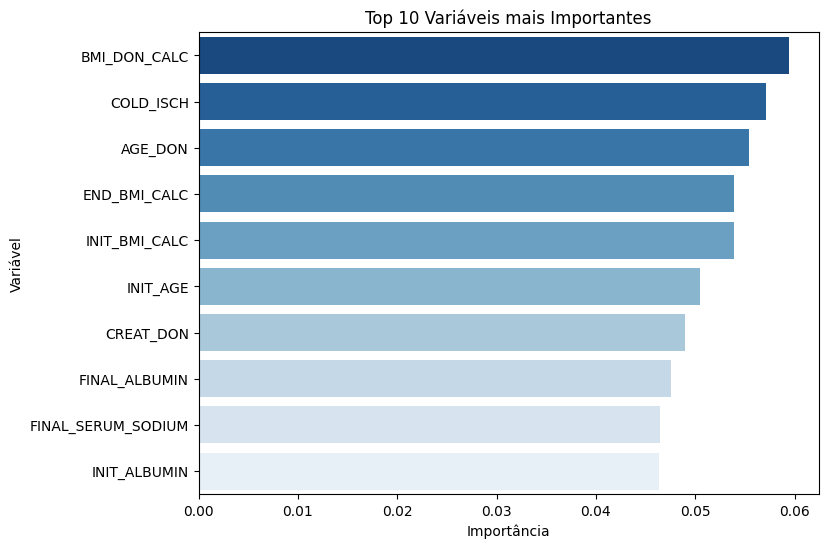

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, auc

# Criar matriz de confusão
cm = confusion_matrix(y_test, y_pred)

# Plotar a matriz de confusão
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Sobreviveu", "Desfecho negativo"], yticklabels=["Sobreviveu", "Desfecho negativo"])
plt.xlabel("Predito")
plt.ylabel("Real")
plt.title("Matriz de Confusão")
plt.show()

importances = model.feature_importances_
features = X.columns

# Criar DataFrame com importâncias
feature_importance_df = pd.DataFrame({"Variável": features, "Importância": importances})
feature_importance_df = feature_importance_df.sort_values(by="Importância", ascending=False)

# Plotar gráfico de barras
plt.figure(figsize=(8,6))
sns.barplot(x="Importância", y="Variável", data=feature_importance_df.head(10), palette="Blues_r")
plt.xlabel("Importância")
plt.ylabel("Variável")
plt.title("Top 10 Variáveis mais Importantes")
plt.show()

# Obter probabilidades do modelo
y_prob = model.predict_proba(X_test)[:, 1]

# Calcular a curva ROC
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Plotar a curva ROC
plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'Área sob a curva (AUC) = {roc_auc:.2f}')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Linha de referência
plt.xlabel("Taxa de Falsos Positivos (FPR)")
plt.ylabel("Taxa de Verdadeiros Positivos (TPR)")
plt.title("Curva ROC")
plt.legend(loc="lower right")
plt.show()

###Sem SMOTE

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Carregar os dados
df = pd.read_csv("/content/drive/MyDrive/2024-5/liver_data_normalizado2.csv")

# Definir variáveis independentes e dependente
variaveis_independentes = [
    "INIT_ALBUMIN", "FINAL_ALBUMIN", "INIT_ASCITES", "FINAL_ASCITES", "INIT_BILIRUBIN", "FINAL_BILIRUBIN",
    "INIT_SERUM_CREAT", "FINAL_SERUM_CREAT", "CREAT_DON", "DIAB", "DIABETES_DON", "HIST_INSULIN_DEP_DON",
    "INIT_DIALYSIS_PRIOR_WEEK", "FINAL_DIALYSIS_PRIOR_WEEK", "INIT_ENCEPH", "FINAL_ENCEPH", "ETHCAT",
    "ETHCAT_DON", "GENDER", "GENDER_DON", "INIT_AGE", "AGE_DON", "DGN_TCR", "INIT_BMI_CALC", "END_BMI_CALC",
    "BMI_DON_CALC", "INIT_INR", "FINAL_INR", "INIT_MELD_PELD_LAB_SCORE", "FINAL_MELD_PELD_LAB_SCORE",
    "INIT_SERUM_SODIUM", "FINAL_SERUM_SODIUM", "PREV_TX", "PREV_TX_ANY", "NUM_PREV_TX", "COD_CAD_DON", "COLD_ISCH"
]

df["evento"] = (df["tempo_sobrevida"] <= 12).astype(int)  # Criando a variável alvo

# Remover colunas não numéricas e preencher valores ausentes
X = df[variaveis_independentes].select_dtypes(include=[np.number])
y = df["evento"]

# Tratamento de valores ausentes
imputer = SimpleImputer(strategy="median")
X_imputed = imputer.fit_transform(X)

# Normalização dos dados
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Dividir os dados em treino (70%) e teste (30%)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

# Criar e treinar o modelo
model = RandomForestClassifier(max_depth = None, max_features= 'sqrt', min_samples_leaf= 1, min_samples_split= 2, n_estimators = 200)
model.fit(X_train, y_train)

# Fazer previsões
y_pred = model.predict(X_test)

# Avaliar o modelo
accuracy = accuracy_score(y_test, y_pred)
matriz_confusao = confusion_matrix(y_test, y_pred)
print(f"Acurácia do modelo: {accuracy:.4f}")
print("Relatório de Classificação:")
print(classification_report(y_test, y_pred))
print(matriz_confusao)


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, auc

# Criar matriz de confusão
cm = confusion_matrix(y_test, y_pred)

# Plotar a matriz de confusão
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Sobreviveu", "Desfecho negativo"], yticklabels=["Sobreviveu", "Desfecho negativo"])
plt.xlabel("Predito")
plt.ylabel("Real")
plt.title("Matriz de Confusão")
plt.show()

importances = model.feature_importances_
features = X.columns

# Criar DataFrame com importâncias
feature_importance_df = pd.DataFrame({"Variável": features, "Importância": importances})
feature_importance_df = feature_importance_df.sort_values(by="Importância", ascending=False)

# Plotar gráfico de barras
plt.figure(figsize=(8,6))
sns.barplot(x="Importância", y="Variável", data=feature_importance_df.head(10), palette="Blues_r")
plt.xlabel("Importância")
plt.ylabel("Variável")
plt.title("Top 10 Variáveis mais Importantes")
plt.show()

# Obter probabilidades do modelo
y_prob = model.predict_proba(X_test)[:, 1]

# Calcular a curva ROC
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Plotar a curva ROC
plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'Área sob a curva (AUC) = {roc_auc:.2f}')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Linha de referência
plt.xlabel("Taxa de Falsos Positivos (FPR)")
plt.ylabel("Taxa de Verdadeiros Positivos (TPR)")
plt.title("Curva ROC")
plt.legend(loc="lower right")
plt.show()

## Até 5 anos

###Com SMOTE

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, classification_report
from imblearn.over_sampling import SMOTE

# Carregar os dados
df = pd.read_csv("/content/drive/MyDrive/2024-5/liver_data_normalizado2.csv")

# Definir variáveis independentes e dependente
variaveis_independentes = [
    "INIT_ALBUMIN", "FINAL_ALBUMIN", "INIT_ASCITES", "FINAL_ASCITES", "INIT_BILIRUBIN", "FINAL_BILIRUBIN",
    "INIT_SERUM_CREAT", "FINAL_SERUM_CREAT", "CREAT_DON", "DIAB", "DIABETES_DON", "HIST_INSULIN_DEP_DON",
    "INIT_DIALYSIS_PRIOR_WEEK", "FINAL_DIALYSIS_PRIOR_WEEK", "INIT_ENCEPH", "FINAL_ENCEPH", "ETHCAT",
    "ETHCAT_DON", "GENDER", "GENDER_DON", "INIT_AGE", "AGE_DON", "DGN_TCR", "INIT_BMI_CALC", "END_BMI_CALC",
    "BMI_DON_CALC", "INIT_INR", "FINAL_INR", "INIT_MELD_PELD_LAB_SCORE", "FINAL_MELD_PELD_LAB_SCORE",
    "INIT_SERUM_SODIUM", "FINAL_SERUM_SODIUM", "PREV_TX", "PREV_TX_ANY", "NUM_PREV_TX", "COD_CAD_DON", "COLD_ISCH"
]

df["evento"] = (df["tempo_sobrevida"] <= 60).astype(int)  # Criando a variável alvo

# Remover colunas não numéricas e preencher valores ausentes
X = df[variaveis_independentes].select_dtypes(include=[np.number])
y = df["evento"]

# Tratamento de valores ausentes
imputer = SimpleImputer(strategy="median")
X_imputed = imputer.fit_transform(X)

# Normalização dos dados
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Instanciando SMOTE com uma estratégia de amostragem de 0.5 (50%)
smote = SMOTE(sampling_strategy= 0.5, random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_scaled, y)

# Dividir os dados em treino (70%) e teste (30%)
X_train, X_test, y_train, y_test = train_test_split(X_train_resampled, y_train_resampled, test_size=0.3, random_state=42)

# Criar e treinar o modelo
model = RandomForestClassifier(max_depth = None, max_features= 'sqrt', min_samples_leaf= 1, min_samples_split= 2, n_estimators = 200)
model.fit(X_train, y_train)

# Fazer previsões
y_pred = model.predict(X_test)

# Avaliar o modelo

accuracy = accuracy_score(y_test, y_pred)
matriz_confusao = confusion_matrix(y_test, y_pred)
print(f"Acurácia do modelo: {accuracy:.4f}")
print("Relatório de Classificação:")
print(classification_report(y_test, y_pred))
print(matriz_confusao)


Acurácia do modelo: 0.6585
Relatório de Classificação:
              precision    recall  f1-score   support

           0       0.68      0.94      0.79     12576
           1       0.44      0.09      0.16      6259

    accuracy                           0.66     18835
   macro avg       0.56      0.52      0.47     18835
weighted avg       0.60      0.66      0.58     18835



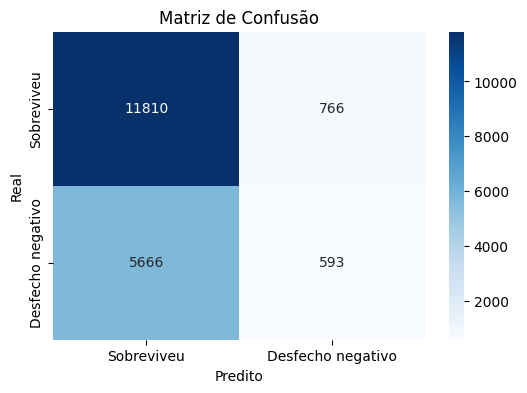

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, auc

# Criar matriz de confusão
cm = confusion_matrix(y_test, y_pred)

# Plotar a matriz de confusão
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Sobreviveu", "Desfecho negativo"], yticklabels=["Sobreviveu", "Desfecho negativo"])
plt.xlabel("Predito")
plt.ylabel("Real")
plt.title("Matriz de Confusão")
plt.show()

importances = model.feature_importances_
features = X.columns

# Criar DataFrame com importâncias
feature_importance_df = pd.DataFrame({"Variável": features, "Importância": importances})
feature_importance_df = feature_importance_df.sort_values(by="Importância", ascending=False)

# Plotar gráfico de barras
plt.figure(figsize=(8,6))
sns.barplot(x="Importância", y="Variável", data=feature_importance_df.head(10), palette="Blues_r")
plt.xlabel("Importância")
plt.ylabel("Variável")
plt.title("Top 10 Variáveis mais Importantes")
plt.show()

# Obter probabilidades do modelo
y_prob = model.predict_proba(X_test)[:, 1]

# Calcular a curva ROC
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Plotar a curva ROC
plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'Área sob a curva (AUC) = {roc_auc:.2f}')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Linha de referência
plt.xlabel("Taxa de Falsos Positivos (FPR)")
plt.ylabel("Taxa de Verdadeiros Positivos (TPR)")
plt.title("Curva ROC")
plt.legend(loc="lower right")
plt.show()

###Sem SMOTE

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Carregar os dados
df = pd.read_csv("/content/drive/MyDrive/2024-5/liver_data_normalizado2.csv")

# Definir variáveis independentes e dependente
variaveis_independentes = [
    "INIT_ALBUMIN", "FINAL_ALBUMIN", "INIT_ASCITES", "FINAL_ASCITES", "INIT_BILIRUBIN", "FINAL_BILIRUBIN",
    "INIT_SERUM_CREAT", "FINAL_SERUM_CREAT", "CREAT_DON", "DIAB", "DIABETES_DON", "HIST_INSULIN_DEP_DON",
    "INIT_DIALYSIS_PRIOR_WEEK", "FINAL_DIALYSIS_PRIOR_WEEK", "INIT_ENCEPH", "FINAL_ENCEPH", "ETHCAT",
    "ETHCAT_DON", "GENDER", "GENDER_DON", "INIT_AGE", "AGE_DON", "DGN_TCR", "INIT_BMI_CALC", "END_BMI_CALC",
    "BMI_DON_CALC", "INIT_INR", "FINAL_INR", "INIT_MELD_PELD_LAB_SCORE", "FINAL_MELD_PELD_LAB_SCORE",
    "INIT_SERUM_SODIUM", "FINAL_SERUM_SODIUM", "PREV_TX", "PREV_TX_ANY", "NUM_PREV_TX", "COD_CAD_DON", "COLD_ISCH"
]

df["evento"] = (df["tempo_sobrevida"] <= 60).astype(int)  # Criando a variável alvo

# Remover colunas não numéricas e preencher valores ausentes
X = df[variaveis_independentes].select_dtypes(include=[np.number])
y = df["evento"]

# Tratamento de valores ausentes
imputer = SimpleImputer(strategy="median")
X_imputed = imputer.fit_transform(X)

# Normalização dos dados
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Dividir os dados em treino (70%) e teste (30%)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

# Criar e treinar o modelo
model = RandomForestClassifier(max_depth = None, max_features= 'sqrt', min_samples_leaf= 1, min_samples_split= 2, n_estimators = 200)
model.fit(X_train, y_train)

# Fazer previsões
y_pred = model.predict(X_test)

# Avaliar o modelo
accuracy = accuracy_score(y_test, y_pred)
matriz_confusao = confusion_matrix(y_test, y_pred)
print(f"Acurácia do modelo: {accuracy:.4f}")
print("Relatório de Classificação:")
print(classification_report(y_test, y_pred))
print(matriz_confusao)


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, auc

# Criar matriz de confusão
cm = confusion_matrix(y_test, y_pred)

# Plotar a matriz de confusão
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Sobreviveu", "Desfecho negativo"], yticklabels=["Sobreviveu", "Desfecho negativo"])
plt.xlabel("Predito")
plt.ylabel("Real")
plt.title("Matriz de Confusão")
plt.show()

importances = model.feature_importances_
features = X.columns

# Criar DataFrame com importâncias
feature_importance_df = pd.DataFrame({"Variável": features, "Importância": importances})
feature_importance_df = feature_importance_df.sort_values(by="Importância", ascending=False)

# Plotar gráfico de barras
plt.figure(figsize=(8,6))
sns.barplot(x="Importância", y="Variável", data=feature_importance_df.head(10), palette="Blues_r")
plt.xlabel("Importância")
plt.ylabel("Variável")
plt.title("Top 10 Variáveis mais Importantes")
plt.show()

# Obter probabilidades do modelo
y_prob = model.predict_proba(X_test)[:, 1]

# Calcular a curva ROC
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Plotar a curva ROC
plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'Área sob a curva (AUC) = {roc_auc:.2f}')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Linha de referência
plt.xlabel("Taxa de Falsos Positivos (FPR)")
plt.ylabel("Taxa de Verdadeiros Positivos (TPR)")
plt.title("Curva ROC")
plt.legend(loc="lower right")
plt.show()

# XGBoost

## Até 6 meses

###Com SMOTE

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [16:23:23] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Acurácia: 0.9106
Relatório de Classificação:
               precision    recall  f1-score   support

           0       0.91      0.99      0.95     17043
           1       0.95      0.50      0.65      3455

    accuracy                           0.91     20498
   macro avg       0.93      0.75      0.80     20498
weighted avg       0.91      0.91      0.90     20498

Matriz de Confusão:
 [[16952    91]
 [ 1742  1713]]


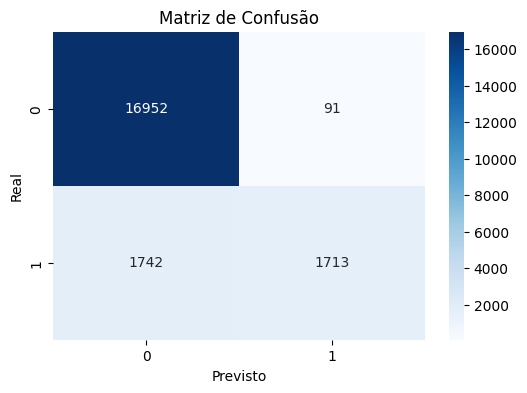

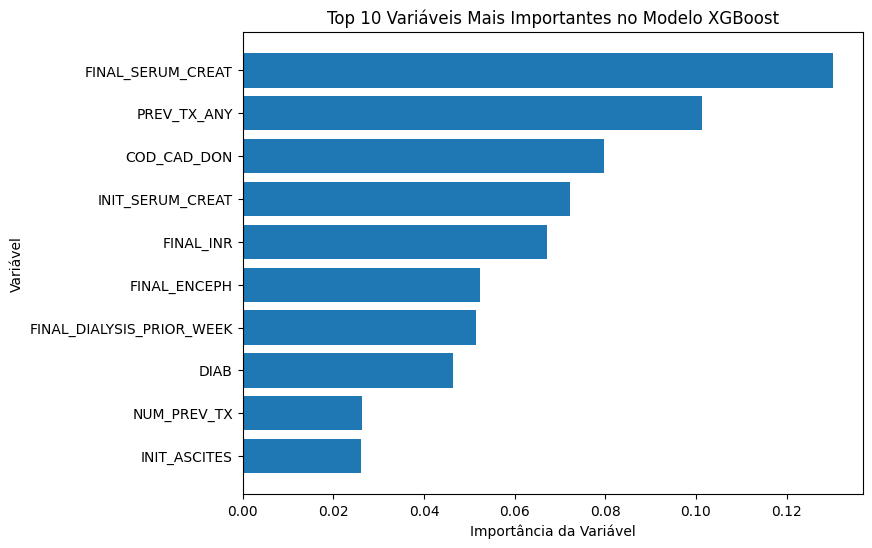

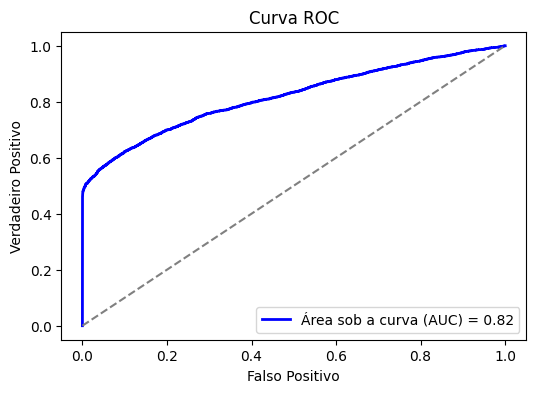

100%|===================| 20407/20498 [02:22<00:00]       

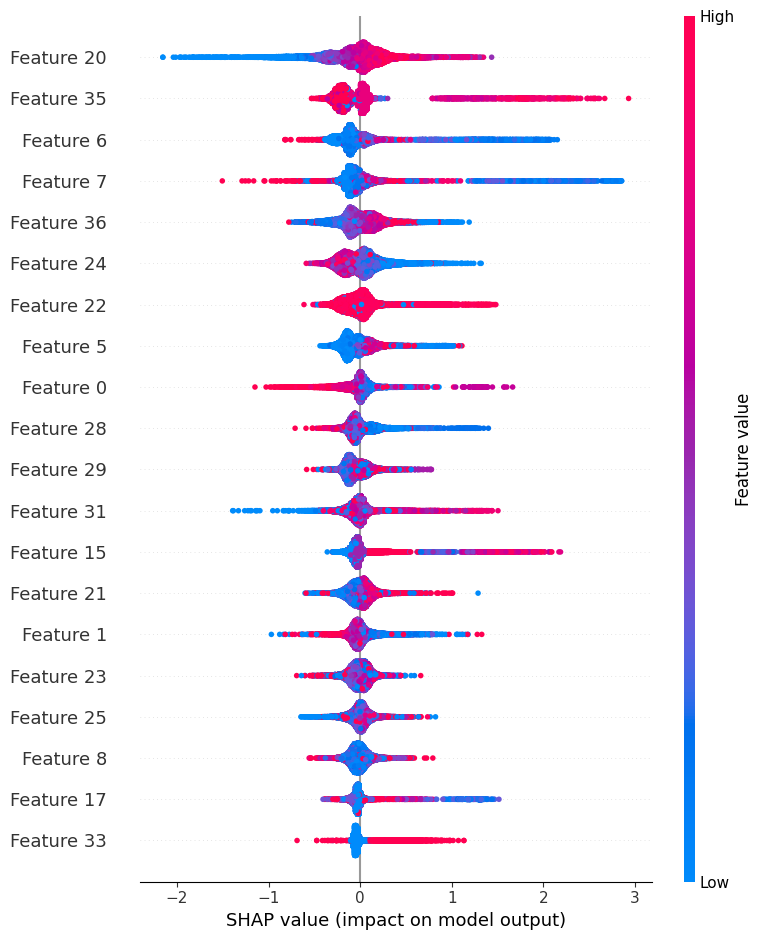

In [ ]:
import xgboost as xgb
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import shap
import pandas as pd
import numpy as np
import seaborn as sns

# Carregar os dados
df = pd.read_csv("/content/drive/MyDrive/2024-5/liver_data_normalizado2.csv")

# Definir variáveis independentes e dependente
variaveis_independentes = [
    "INIT_ALBUMIN", "FINAL_ALBUMIN", "INIT_ASCITES", "FINAL_ASCITES", "INIT_BILIRUBIN", "FINAL_BILIRUBIN",
    "INIT_SERUM_CREAT", "FINAL_SERUM_CREAT", "CREAT_DON", "DIAB", "DIABETES_DON", "HIST_INSULIN_DEP_DON",
    "INIT_DIALYSIS_PRIOR_WEEK", "FINAL_DIALYSIS_PRIOR_WEEK", "INIT_ENCEPH", "FINAL_ENCEPH", "ETHCAT",
    "ETHCAT_DON", "GENDER", "GENDER_DON", "INIT_AGE", "AGE_DON", "DGN_TCR", "INIT_BMI_CALC", "END_BMI_CALC",
    "BMI_DON_CALC", "INIT_INR", "FINAL_INR", "INIT_MELD_PELD_LAB_SCORE", "FINAL_MELD_PELD_LAB_SCORE",
    "INIT_SERUM_SODIUM", "FINAL_SERUM_SODIUM", "PREV_TX", "PREV_TX_ANY", "NUM_PREV_TX", "COD_CAD_DON", "COLD_ISCH"
]

# Definir a variável-alvo
df["Y"] = (df["tempo_sobrevida"] <= 6).astype(int)

# Remover colunas não numéricas e preencher valores ausentes
X = df[variaveis_independentes].select_dtypes(include=[np.number])
y = df["Y"]

# Tratamento de valores ausentes
imputer = SimpleImputer(strategy="median")
X_imputed = imputer.fit_transform(X)

# Normalização dos dados
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Instanciando SMOTE com uma estratégia de amostragem de 0.2 (20%)
smote = SMOTE(sampling_strategy= 0.2, random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_scaled, y)

# Dividir os dados em conjunto de treino e teste
X_train, X_test, y_train, y_test = train_test_split(X_train_resampled, y_train_resampled, test_size=0.3, random_state=42)

# Criar e treinar o modelo XGBoost
xgb_model = xgb.XGBClassifier(colsample_bytree = 0.8, gamma = 0.2, learning_rate = 0.1, max_depth = 10, n_estimators = 200, subsample = 1.0)
xgb_model.fit(X_train, y_train)

# Fazer previsões
y_pred = xgb_model.predict(X_test)
y_pred_proba = xgb_model.predict_proba(X_test)[:, 1]

# Avaliação do modelo
print("Acurácia:", np.round(xgb_model.score(X_test, y_test), 4))
print("Relatório de Classificação:\n", classification_report(y_test, y_pred))
print("Matriz de Confusão:\n", confusion_matrix(y_test, y_pred))

# Plot da matriz de confusão
plt.figure(figsize=(6, 4))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt="d", cmap="Blues")
plt.xlabel("Previsto")
plt.ylabel("Real")
plt.title("Matriz de Confusão")
plt.show()

# Top 10 variáveis mais importantes
feature_importances = xgb_model.feature_importances_
sorted_idx = np.argsort(feature_importances)[-10:]
plt.figure(figsize=(8, 6))
plt.barh(np.array(variaveis_independentes)[sorted_idx], feature_importances[sorted_idx])
plt.xlabel("Importância da Variável")
plt.ylabel("Variável")
plt.title("Top 10 Variáveis Mais Importantes no Modelo XGBoost")
plt.show()

# Curva ROC
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, color="blue", lw=2, label=f"Área sob a curva (AUC) = {roc_auc:.2f}")
plt.plot([0, 1], [0, 1], color="gray", linestyle="--")
plt.xlabel("Falso Positivo")
plt.ylabel("Verdadeiro Positivo")
plt.title("Curva ROC")
plt.legend(loc="lower right")
plt.show()

# Análise com SHAP para interpretar o modelo
#explainer = shap.Explainer(xgb_model, X_train)
#shap_values = explainer(X_test)

# Gráfico de importância das variáveis com SHAP
#shap.summary_plot(shap_values, X_test)

###Sem SMOTE

In [ ]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import shap
import pandas as pd
import numpy as np
import seaborn as sns

# Carregar os dados
df = pd.read_csv("/content/drive/MyDrive/2024-5/liver_data_normalizado2.csv")

# Definir variáveis independentes e dependente
variaveis_independentes = [
    "INIT_ALBUMIN", "FINAL_ALBUMIN", "INIT_ASCITES", "FINAL_ASCITES", "INIT_BILIRUBIN", "FINAL_BILIRUBIN",
    "INIT_SERUM_CREAT", "FINAL_SERUM_CREAT", "CREAT_DON", "DIAB", "DIABETES_DON", "HIST_INSULIN_DEP_DON",
    "INIT_DIALYSIS_PRIOR_WEEK", "FINAL_DIALYSIS_PRIOR_WEEK", "INIT_ENCEPH", "FINAL_ENCEPH", "ETHCAT",
    "ETHCAT_DON", "GENDER", "GENDER_DON", "INIT_AGE", "AGE_DON", "DGN_TCR", "INIT_BMI_CALC", "END_BMI_CALC",
    "BMI_DON_CALC", "INIT_INR", "FINAL_INR", "INIT_MELD_PELD_LAB_SCORE", "FINAL_MELD_PELD_LAB_SCORE",
    "INIT_SERUM_SODIUM", "FINAL_SERUM_SODIUM", "PREV_TX", "PREV_TX_ANY", "NUM_PREV_TX", "COD_CAD_DON", "COLD_ISCH"
]

# Definir a variável-alvo
df["Y"] = (df["tempo_sobrevida"] <= 6).astype(int)

# Remover colunas não numéricas e preencher valores ausentes
X = df[variaveis_independentes].select_dtypes(include=[np.number])
y = df["Y"]

# Tratamento de valores ausentes
imputer = SimpleImputer(strategy="median")
X_imputed = imputer.fit_transform(X)

# Normalização dos dados
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Dividir os dados em conjunto de treino e teste
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

# Criar e treinar o modelo XGBoost
xgb_model = xgb.XGBClassifier(colsample_bytree = 0.8, gamma = 0.2, learning_rate = 0.1, max_depth = 10, n_estimators = 200, subsample = 1.0)
xgb_model.fit(X_train, y_train)

# Fazer previsões
y_pred = xgb_model.predict(X_test)
y_pred_proba = xgb_model.predict_proba(X_test)[:, 1]

# Avaliação do modelo
print("Acurácia:", np.round(xgb_model.score(X_test, y_test), 4))
print("Relatório de Classificação:\n", classification_report(y_test, y_pred))
print("Matriz de Confusão:\n", confusion_matrix(y_test, y_pred))

# Plot da matriz de confusão
plt.figure(figsize=(6, 4))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt="d", cmap="Blues")
plt.xlabel("Previsto")
plt.ylabel("Real")
plt.title("Matriz de Confusão")
plt.show()

# Top 10 variáveis mais importantes
feature_importances = xgb_model.feature_importances_
sorted_idx = np.argsort(feature_importances)[-10:]
plt.figure(figsize=(8, 6))
plt.barh(np.array(variaveis_independentes)[sorted_idx], feature_importances[sorted_idx])
plt.xlabel("Importância da Variável")
plt.ylabel("Variável")
plt.title("Top 10 Variáveis Mais Importantes no Modelo XGBoost")
plt.show()

# Curva ROC
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, color="blue", lw=2, label=f"Área sob a curva (AUC) = {roc_auc:.2f}")
plt.plot([0, 1], [0, 1], color="gray", linestyle="--")
plt.xlabel("Falso Positivo")
plt.ylabel("Verdadeiro Positivo")
plt.title("Curva ROC")
plt.legend(loc="lower right")
plt.show()

# Análise com SHAP para interpretar o modelo
#explainer = shap.Explainer(xgb_model, X_train)
#shap_values = explainer(X_test)

# Gráfico de importância das variáveis com SHAP
#shap.summary_plot(shap_values, X_test)


## Até 1 ano

###Com SMOTE

In [ ]:
import xgboost as xgb
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import shap
import pandas as pd
import numpy as np
import seaborn as sns

# Carregar os dados
df = pd.read_csv("/content/drive/MyDrive/2024-5/liver_data_normalizado2.csv")

# Definir variáveis independentes e dependente
variaveis_independentes = [
    "INIT_ALBUMIN", "FINAL_ALBUMIN", "INIT_ASCITES", "FINAL_ASCITES", "INIT_BILIRUBIN", "FINAL_BILIRUBIN",
    "INIT_SERUM_CREAT", "FINAL_SERUM_CREAT", "CREAT_DON", "DIAB", "DIABETES_DON", "HIST_INSULIN_DEP_DON",
    "INIT_DIALYSIS_PRIOR_WEEK", "FINAL_DIALYSIS_PRIOR_WEEK", "INIT_ENCEPH", "FINAL_ENCEPH", "ETHCAT",
    "ETHCAT_DON", "GENDER", "GENDER_DON", "INIT_AGE", "AGE_DON", "DGN_TCR", "INIT_BMI_CALC", "END_BMI_CALC",
    "BMI_DON_CALC", "INIT_INR", "FINAL_INR", "INIT_MELD_PELD_LAB_SCORE", "FINAL_MELD_PELD_LAB_SCORE",
    "INIT_SERUM_SODIUM", "FINAL_SERUM_SODIUM", "PREV_TX", "PREV_TX_ANY", "NUM_PREV_TX", "COD_CAD_DON", "COLD_ISCH"
]

# Definir a variável-alvo
df["Y"] = (df["tempo_sobrevida"] <= 12).astype(int)

# Remover colunas não numéricas e preencher valores ausentes
X = df[variaveis_independentes].select_dtypes(include=[np.number])
y = df["Y"]

# Tratamento de valores ausentes
imputer = SimpleImputer(strategy="median")
X_imputed = imputer.fit_transform(X)

# Normalização dos dados
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Instanciando SMOTE com uma estratégia de amostragem de 0.2 (20%)
smote = SMOTE(sampling_strategy= 0.2, random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_scaled, y)

# Dividir os dados em conjunto de treino e teste
X_train, X_test, y_train, y_test = train_test_split(X_train_resampled, y_train_resampled, test_size=0.3, random_state=42)

# Criar e treinar o modelo XGBoost
xgb_model = xgb.XGBClassifier(colsample_bytree = 0.8, gamma = 0.2, learning_rate = 0.1, max_depth = 10, n_estimators = 200, subsample = 1.0)
xgb_model.fit(X_train, y_train)

# Fazer previsões
y_pred = xgb_model.predict(X_test)
y_pred_proba = xgb_model.predict_proba(X_test)[:, 1]

# Avaliação do modelo
print("Acurácia:", np.round(xgb_model.score(X_test, y_test), 4))
print("Relatório de Classificação:\n", classification_report(y_test, y_pred))
print("Matriz de Confusão:\n", confusion_matrix(y_test, y_pred))

# Plot da matriz de confusão
plt.figure(figsize=(6, 4))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt="d", cmap="Blues")
plt.xlabel("Previsto")
plt.ylabel("Real")
plt.title("Matriz de Confusão")
plt.show()

# Top 10 variáveis mais importantes
feature_importances = xgb_model.feature_importances_
sorted_idx = np.argsort(feature_importances)[-10:]
plt.figure(figsize=(8, 6))
plt.barh(np.array(variaveis_independentes)[sorted_idx], feature_importances[sorted_idx])
plt.xlabel("Importância da Variável")
plt.ylabel("Variável")
plt.title("Top 10 Variáveis Mais Importantes no Modelo XGBoost")
plt.show()

# Curva ROC
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, color="blue", lw=2, label=f"Área sob a curva (AUC) = {roc_auc:.2f}")
plt.plot([0, 1], [0, 1], color="gray", linestyle="--")
plt.xlabel("Falso Positivo")
plt.ylabel("Verdadeiro Positivo")
plt.title("Curva ROC")
plt.legend(loc="lower right")
plt.show()

# Análise com SHAP para interpretar o modelo
#explainer = shap.Explainer(xgb_model, X_train)
#shap_values = explainer(X_test)

# Gráfico de importância das variáveis com SHAP
#shap.summary_plot(shap_values, X_test)


###Sem SMOTE

In [ ]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import shap
import pandas as pd
import numpy as np
import seaborn as sns

# Carregar os dados
df = pd.read_csv("/content/drive/MyDrive/2024-5/liver_data_normalizado2.csv")

# Definir variáveis independentes e dependente
variaveis_independentes = [
    "INIT_ALBUMIN", "FINAL_ALBUMIN", "INIT_ASCITES", "FINAL_ASCITES", "INIT_BILIRUBIN", "FINAL_BILIRUBIN",
    "INIT_SERUM_CREAT", "FINAL_SERUM_CREAT", "CREAT_DON", "DIAB", "DIABETES_DON", "HIST_INSULIN_DEP_DON",
    "INIT_DIALYSIS_PRIOR_WEEK", "FINAL_DIALYSIS_PRIOR_WEEK", "INIT_ENCEPH", "FINAL_ENCEPH", "ETHCAT",
    "ETHCAT_DON", "GENDER", "GENDER_DON", "INIT_AGE", "AGE_DON", "DGN_TCR", "INIT_BMI_CALC", "END_BMI_CALC",
    "BMI_DON_CALC", "INIT_INR", "FINAL_INR", "INIT_MELD_PELD_LAB_SCORE", "FINAL_MELD_PELD_LAB_SCORE",
    "INIT_SERUM_SODIUM", "FINAL_SERUM_SODIUM", "PREV_TX", "PREV_TX_ANY", "NUM_PREV_TX", "COD_CAD_DON", "COLD_ISCH"
]

# Definir a variável-alvo
df["Y"] = (df["tempo_sobrevida"] <= 12).astype(int)

# Remover colunas não numéricas e preencher valores ausentes
X = df[variaveis_independentes].select_dtypes(include=[np.number])
y = df["Y"]

# Tratamento de valores ausentes
imputer = SimpleImputer(strategy="median")
X_imputed = imputer.fit_transform(X)

# Normalização dos dados
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Dividir os dados em conjunto de treino e teste
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

# Criar e treinar o modelo XGBoost
xgb_model = xgb.XGBClassifier(colsample_bytree = 0.8, gamma = 0.2, learning_rate = 0.1, max_depth = 10, n_estimators = 200, subsample = 1.0)
xgb_model.fit(X_train, y_train)

# Fazer previsões
y_pred = xgb_model.predict(X_test)
y_pred_proba = xgb_model.predict_proba(X_test)[:, 1]

# Avaliação do modelo
print("Acurácia:", np.round(xgb_model.score(X_test, y_test), 4))
print("Relatório de Classificação:\n", classification_report(y_test, y_pred))
print("Matriz de Confusão:\n", confusion_matrix(y_test, y_pred))

# Plot da matriz de confusão
plt.figure(figsize=(6, 4))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt="d", cmap="Blues")
plt.xlabel("Previsto")
plt.ylabel("Real")
plt.title("Matriz de Confusão")
plt.show()

# Top 10 variáveis mais importantes
feature_importances = xgb_model.feature_importances_
sorted_idx = np.argsort(feature_importances)[-10:]
plt.figure(figsize=(8, 6))
plt.barh(np.array(variaveis_independentes)[sorted_idx], feature_importances[sorted_idx])
plt.xlabel("Importância da Variável")
plt.ylabel("Variável")
plt.title("Top 10 Variáveis Mais Importantes no Modelo XGBoost")
plt.show()

# Curva ROC
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, color="blue", lw=2, label=f"Área sob a curva (AUC) = {roc_auc:.2f}")
plt.plot([0, 1], [0, 1], color="gray", linestyle="--")
plt.xlabel("Falso Positivo")
plt.ylabel("Verdadeiro Positivo")
plt.title("Curva ROC")
plt.legend(loc="lower right")
plt.show()

# Análise com SHAP para interpretar o modelo
#explainer = shap.Explainer(xgb_model, X_train)
#shap_values = explainer(X_test)

# Gráfico de importância das variáveis com SHAP
#shap.summary_plot(shap_values, X_test)


## Até 5 anos

###Com SMOTE

In [ ]:
import xgboost as xgb
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import shap
import pandas as pd
import numpy as np
import seaborn as sns

# Carregar os dados
df = pd.read_csv("/content/drive/MyDrive/2024-5/liver_data_normalizado2.csv")

# Definir variáveis independentes e dependente
variaveis_independentes = [
    "INIT_ALBUMIN", "FINAL_ALBUMIN", "INIT_ASCITES", "FINAL_ASCITES", "INIT_BILIRUBIN", "FINAL_BILIRUBIN",
    "INIT_SERUM_CREAT", "FINAL_SERUM_CREAT", "CREAT_DON", "DIAB", "DIABETES_DON", "HIST_INSULIN_DEP_DON",
    "INIT_DIALYSIS_PRIOR_WEEK", "FINAL_DIALYSIS_PRIOR_WEEK", "INIT_ENCEPH", "FINAL_ENCEPH", "ETHCAT",
    "ETHCAT_DON", "GENDER", "GENDER_DON", "INIT_AGE", "AGE_DON", "DGN_TCR", "INIT_BMI_CALC", "END_BMI_CALC",
    "BMI_DON_CALC", "INIT_INR", "FINAL_INR", "INIT_MELD_PELD_LAB_SCORE", "FINAL_MELD_PELD_LAB_SCORE",
    "INIT_SERUM_SODIUM", "FINAL_SERUM_SODIUM", "PREV_TX", "PREV_TX_ANY", "NUM_PREV_TX", "COD_CAD_DON", "COLD_ISCH"
]

# Definir a variável-alvo
df["Y"] = (df["tempo_sobrevida"] <= 60).astype(int)

# Remover colunas não numéricas e preencher valores ausentes
X = df[variaveis_independentes].select_dtypes(include=[np.number])
y = df["Y"]

# Tratamento de valores ausentes
imputer = SimpleImputer(strategy="median")
X_imputed = imputer.fit_transform(X)

# Normalização dos dados
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Instanciando SMOTE com uma estratégia de amostragem de 0.5 (50%)
smote = SMOTE(sampling_strategy= 0.5, random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_scaled, y)

# Dividir os dados em conjunto de treino e teste
X_train, X_test, y_train, y_test = train_test_split(X_train_resampled, y_train_resampled, test_size=0.3, random_state=42)

# Criar e treinar o modelo XGBoost
xgb_model = xgb.XGBClassifier(colsample_bytree = 0.8, gamma = 0.2, learning_rate = 0.1, max_depth = 10, n_estimators = 200, subsample = 1.0)
xgb_model.fit(X_train, y_train)

# Fazer previsões
y_pred = xgb_model.predict(X_test)
y_pred_proba = xgb_model.predict_proba(X_test)[:, 1]

# Avaliação do modelo
print("Acurácia:", np.round(xgb_model.score(X_test, y_test), 4))
print("Relatório de Classificação:\n", classification_report(y_test, y_pred))
print("Matriz de Confusão:\n", confusion_matrix(y_test, y_pred))

# Plot da matriz de confusão
plt.figure(figsize=(6, 4))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt="d", cmap="Blues")
plt.xlabel("Previsto")
plt.ylabel("Real")
plt.title("Matriz de Confusão")
plt.show()

# Top 10 variáveis mais importantes
feature_importances = xgb_model.feature_importances_
sorted_idx = np.argsort(feature_importances)[-10:]
plt.figure(figsize=(8, 6))
plt.barh(np.array(variaveis_independentes)[sorted_idx], feature_importances[sorted_idx])
plt.xlabel("Importância da Variável")
plt.ylabel("Variável")
plt.title("Top 10 Variáveis Mais Importantes no Modelo XGBoost")
plt.show()

# Curva ROC
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, color="blue", lw=2, label=f"Área sob a curva (AUC) = {roc_auc:.2f}")
plt.plot([0, 1], [0, 1], color="gray", linestyle="--")
plt.xlabel("Falso Positivo")
plt.ylabel("Verdadeiro Positivo")
plt.title("Curva ROC")
plt.legend(loc="lower right")
plt.show()

# Análise com SHAP para interpretar o modelo
#explainer = shap.Explainer(xgb_model, X_train)
#shap_values = explainer(X_test)

# Gráfico de importância das variáveis com SHAP
#shap.summary_plot(shap_values, X_test)


###Sem SMOTE

In [ ]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import shap
import pandas as pd
import numpy as np
import seaborn as sns

# Carregar os dados
df = pd.read_csv("/content/drive/MyDrive/2024-5/liver_data_normalizado2.csv")

# Definir variáveis independentes e dependente
variaveis_independentes = [
    "INIT_ALBUMIN", "FINAL_ALBUMIN", "INIT_ASCITES", "FINAL_ASCITES", "INIT_BILIRUBIN", "FINAL_BILIRUBIN",
    "INIT_SERUM_CREAT", "FINAL_SERUM_CREAT", "CREAT_DON", "DIAB", "DIABETES_DON", "HIST_INSULIN_DEP_DON",
    "INIT_DIALYSIS_PRIOR_WEEK", "FINAL_DIALYSIS_PRIOR_WEEK", "INIT_ENCEPH", "FINAL_ENCEPH", "ETHCAT",
    "ETHCAT_DON", "GENDER", "GENDER_DON", "INIT_AGE", "AGE_DON", "DGN_TCR", "INIT_BMI_CALC", "END_BMI_CALC",
    "BMI_DON_CALC", "INIT_INR", "FINAL_INR", "INIT_MELD_PELD_LAB_SCORE", "FINAL_MELD_PELD_LAB_SCORE",
    "INIT_SERUM_SODIUM", "FINAL_SERUM_SODIUM", "PREV_TX", "PREV_TX_ANY", "NUM_PREV_TX", "COD_CAD_DON", "COLD_ISCH"
]

# Definir a variável-alvo
df["Y"] = (df["tempo_sobrevida"] <= 60).astype(int)

# Remover colunas não numéricas e preencher valores ausentes
X = df[variaveis_independentes].select_dtypes(include=[np.number])
y = df["Y"]

# Tratamento de valores ausentes
imputer = SimpleImputer(strategy="median")
X_imputed = imputer.fit_transform(X)

# Normalização dos dados
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Dividir os dados em conjunto de treino e teste
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

# Criar e treinar o modelo XGBoost
xgb_model = xgb.XGBClassifier(colsample_bytree = 0.8, gamma = 0.2, learning_rate = 0.1, max_depth = 10, n_estimators = 200, subsample = 1.0)
xgb_model.fit(X_train, y_train)

# Fazer previsões
y_pred = xgb_model.predict(X_test)
y_pred_proba = xgb_model.predict_proba(X_test)[:, 1]

# Avaliação do modelo
print("Acurácia:", np.round(xgb_model.score(X_test, y_test), 4))
print("Relatório de Classificação:\n", classification_report(y_test, y_pred))
print("Matriz de Confusão:\n", confusion_matrix(y_test, y_pred))

# Plot da matriz de confusão
plt.figure(figsize=(6, 4))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt="d", cmap="Blues")
plt.xlabel("Previsto")
plt.ylabel("Real")
plt.title("Matriz de Confusão")
plt.show()

# Top 10 variáveis mais importantes
feature_importances = xgb_model.feature_importances_
sorted_idx = np.argsort(feature_importances)[-10:]
plt.figure(figsize=(8, 6))
plt.barh(np.array(variaveis_independentes)[sorted_idx], feature_importances[sorted_idx])
plt.xlabel("Importância da Variável")
plt.ylabel("Variável")
plt.title("Top 10 Variáveis Mais Importantes no Modelo XGBoost")
plt.show()

# Curva ROC
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, color="blue", lw=2, label=f"Área sob a curva (AUC) = {roc_auc:.2f}")
plt.plot([0, 1], [0, 1], color="gray", linestyle="--")
plt.xlabel("Falso Positivo")
plt.ylabel("Verdadeiro Positivo")
plt.title("Curva ROC")
plt.legend(loc="lower right")
plt.show()

# Análise com SHAP para interpretar o modelo
#explainer = shap.Explainer(xgb_model, X_train)
#shap_values = explainer(X_test)

# Gráfico de importância das variáveis com SHAP
#shap.summary_plot(shap_values, X_test)


#Árvore de Decisão

##Até 6 meses

###Com SMOTE

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Acurácia: 0.9239925846424042
Relatório de Classificação:
              precision    recall  f1-score   support

           0       0.93      0.98      0.96     17043
           1       0.86      0.66      0.74      3455

    accuracy                           0.92     20498
   macro avg       0.90      0.82      0.85     20498
weighted avg       0.92      0.92      0.92     20498

Matriz de Confusão:
[[16676   367]
 [ 1191  2264]]


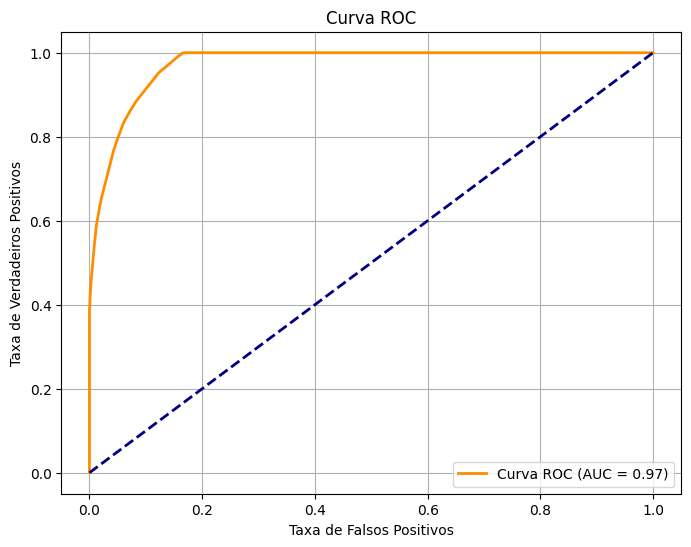

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
from sklearn.utils import resample
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE  # Importando a técnica SMOTE
from google.colab import drive
import numpy as np
from sklearn.metrics import f1_score
import seaborn as sns

drive.mount('/content/drive')
file_path = "/content/drive/MyDrive/2024-5/liver_data_normalizado2.csv"

# Carregar os dados (já foi carregado anteriormente)
df_pandas = pd.read_csv("/content/drive/MyDrive/2024-5/liver_data_normalizado2.csv")

# Definir variáveis independentes e a variável dependente (evento)
variaveis_independentes = [
    "INIT_ALBUMIN", "FINAL_ALBUMIN", "INIT_ASCITES", "FINAL_ASCITES", "INIT_BILIRUBIN", "FINAL_BILIRUBIN",
    "INIT_SERUM_CREAT", "FINAL_SERUM_CREAT", "CREAT_DON", "DIAB", "DIABETES_DON", "HIST_INSULIN_DEP_DON",
    "INIT_DIALYSIS_PRIOR_WEEK", "FINAL_DIALYSIS_PRIOR_WEEK", "INIT_ENCEPH", "FINAL_ENCEPH", "ETHCAT",
    "ETHCAT_DON", "GENDER", "GENDER_DON", "INIT_AGE", "AGE_DON", "DGN_TCR", "INIT_BMI_CALC", "END_BMI_CALC",
    "BMI_DON_CALC", "INIT_INR", "FINAL_INR", "INIT_MELD_PELD_LAB_SCORE", "FINAL_MELD_PELD_LAB_SCORE",
    "INIT_SERUM_SODIUM", "FINAL_SERUM_SODIUM", "PREV_TX", "PREV_TX_ANY", "NUM_PREV_TX", "COD_CAD_DON", "COLD_ISCH"
]

"""# VARIAVEIS ESCOLHIDAS PELO FEATURE_IMPORTANCES DO RANDOM_FOREST_CLASSIFIER
variaveis_importantes = [
    "FINAL_SERUM_CREAT",
    "INIT_SERUM_CREAT",
    "COD_CAD_DON",
    "DGN_TCR",
    "INIT_BILIRUBIN",
    "FINAL_INR",
    "FINAL_BILIRUBIN",
    "INIT_AGE",
    "FINAL_ASCITES",
    "ETHCAT_DON"
]"""

# Variável dependente
df_pandas["evento"] = (df_pandas["tempo_sobrevida"] <= 6).astype(int)

# Separar as variáveis independentes e a variável dependente
X = df_pandas[variaveis_independentes]
y = df_pandas["evento"]

# Remover colunas não numéricas e preencher valores ausentes
X = X.select_dtypes(include=[np.number])

# Tratamento de valores ausentes
imputer = SimpleImputer(strategy="median")
X_imputed = imputer.fit_transform(X)

# Normalização dos dados
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)


# Instanciando SMOTE com uma estratégia de amostragem de 0.2 (20%)
smote = SMOTE(sampling_strategy= 0.2, random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_scaled, y)

# Dividir os dados em conjunto de treino e teste
X_train, X_test, y_train, y_test = train_test_split(X_train_resampled, y_train_resampled, test_size=0.3, random_state=42)

# Criar o modelo de árvore de decisão
modelo = DecisionTreeClassifier(criterion='gini', max_depth=None, max_features=None, min_samples_leaf=4,
                                min_samples_split=2, splitter='random')



# Treinar o modelo com os dados balanceados
modelo.fit(X_train_resampled, y_train_resampled)

# Fazer previsões
y_pred = modelo.predict(X_test)

# Avaliar o modelo
acuracia = accuracy_score(y_test, y_pred)
relatorio = classification_report(y_test, y_pred)
matriz_confusao = confusion_matrix(y_test, y_pred)

# Exibir os resultados
print("Acurácia:", acuracia)
print("Relatório de Classificação:")
print(relatorio)
print("Matriz de Confusão:")
print(matriz_confusao)

# Calcular as probabilidades para a curva ROC
y_prob = modelo.predict_proba(X_test)[:, 1]


# Calcular a curva ROC
fpr, tpr, thresholds = roc_curve(y_test, y_prob)

# Calcular a AUC
roc_auc = auc(fpr, tpr)

# Plotar a curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'Curva ROC (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('Taxa de Falsos Positivos')
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.title('Curva ROC')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

# Criar matriz de confusão
cm = confusion_matrix(y_test, y_pred)

# Plotar a matriz de confusão
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Sobreviveu", "Desfecho negativo"], yticklabels=["Sobreviveu", "Desfecho negativo"])
plt.xlabel("Predito")
plt.ylabel("Real")
plt.title("Matriz de Confusão")
plt.show()

# Obter probabilidades do modelo
y_prob = modelo.predict_proba(X_test)[:, 1]

# Calcular a curva ROC
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Plotar a curva ROC
plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'Área sob a curva (AUC) = {roc_auc:.2f}')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Linha de referência
plt.xlabel("Taxa de Falsos Positivos (FPR)")
plt.ylabel("Taxa de Verdadeiros Positivos (TPR)")
plt.title("Curva ROC")
plt.legend(loc="lower right")
plt.show()

importances = modelo.feature_importances_
features = X.columns

# Criar DataFrame com importâncias
feature_importance_df = pd.DataFrame({"Variável": features, "Importância": importances})
feature_importance_df = feature_importance_df.sort_values(by="Importância", ascending=False)

# Plotar gráfico de barras
plt.figure(figsize=(8,6))
sns.barplot(x="Importância", y="Variável", data=feature_importance_df.head(10), palette="Blues_r")
plt.xlabel("Importância")
plt.ylabel("Variável")
plt.title("Top 10 Variáveis mais Importantes")
plt.show()
plt.show()

###Sem SMOTE

Acurácia: 0.8730023891691001
Relatório de Classificação:
              precision    recall  f1-score   support

           0       0.91      0.95      0.93     17058
           1       0.18      0.10      0.13      1777

    accuracy                           0.87     18835
   macro avg       0.54      0.53      0.53     18835
weighted avg       0.84      0.87      0.86     18835

Matriz de Confusão:
[[16271   787]
 [ 1605   172]]


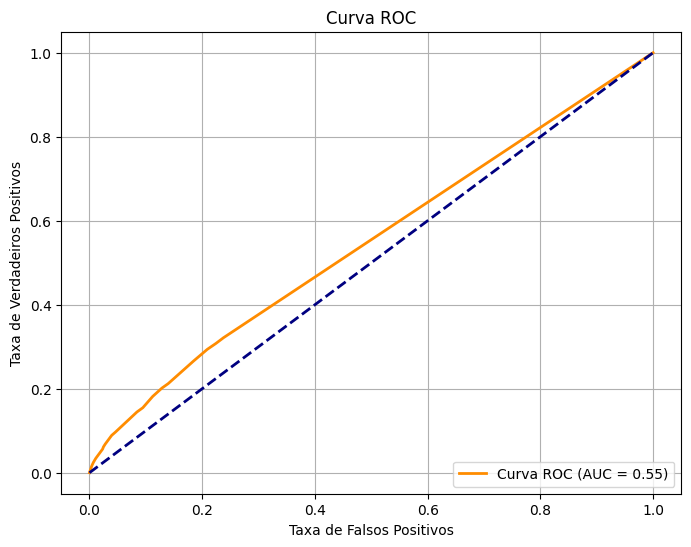

In [ ]:


import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt

#Carregar os dados (já foi carregado anteriormente)
df_pandas = pd.read_csv("/content/drive/MyDrive/Colab_Notebooks/liver_data_normalizado2.csv")

# Definir variáveis independentes e a variável dependente (evento)
variaveis_independentes = [
    "INIT_ALBUMIN", "FINAL_ALBUMIN", "INIT_ASCITES", "FINAL_ASCITES", "INIT_BILIRUBIN", "FINAL_BILIRUBIN",
    "INIT_SERUM_CREAT", "FINAL_SERUM_CREAT", "CREAT_DON", "DIAB", "DIABETES_DON", "HIST_INSULIN_DEP_DON",
    "INIT_DIALYSIS_PRIOR_WEEK", "FINAL_DIALYSIS_PRIOR_WEEK", "INIT_ENCEPH", "FINAL_ENCEPH", "ETHCAT",
    "ETHCAT_DON", "GENDER", "GENDER_DON", "INIT_AGE", "AGE_DON", "DGN_TCR", "INIT_BMI_CALC", "END_BMI_CALC",
    "BMI_DON_CALC", "INIT_INR", "FINAL_INR", "INIT_MELD_PELD_LAB_SCORE", "FINAL_MELD_PELD_LAB_SCORE",
    "INIT_SERUM_SODIUM", "FINAL_SERUM_SODIUM", "PREV_TX", "PREV_TX_ANY", "NUM_PREV_TX", "COD_CAD_DON", "COLD_ISCH"
]


"""#VARIAVEIS ESCOLHIDAS PELO FEATURE_IMPORTANCES DO RANDOM_FOREST_CLASSIFIER
variaveis_importantes = [
    "FINAL_SERUM_CREAT",
    "INIT_SERUM_CREAT",
    "COD_CAD_DON",
    "DGN_TCR",
    "INIT_BILIRUBIN",
    "FINAL_INR",
    "FINAL_BILIRUBIN",
    "INIT_AGE",
    "FINAL_ASCITES",
    "ETHCAT_DON"
]"""

# Variável dependente
df_pandas["evento"] = (df_pandas["tempo_sobrevida"] <= 6).astype(int)

"""# Contagem da quantidade de elementos do df_pandas["eventos"]
print("Distribuição:")
print(df_pandas["evento"].value_counts())"""

# Separar as variáveis independentes e a variável dependente
X = df_pandas[variaveis_independentes]
y = df_pandas["evento"]

# Remover colunas não numéricas e preencher valores ausentes
X = df_pandas[variaveis_independentes].select_dtypes(include=[np.number])
y = df_pandas["evento"]

# Tratamento de valores ausentes
imputer = SimpleImputer(strategy="median")
X_imputed = imputer.fit_transform(X)

# Normalização dos dados
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Dividir os dados em conjunto de treino e teste
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

# Criar o modelo de árvore de decisão
modelo = DecisionTreeClassifier(criterion = 'gini', max_depth = None, max_features = None, min_samples_leaf= 4, min_samples_split = 2, splitter = 'random')

# Treinar o modelo
modelo.fit(X_train, y_train)

# Fazer previsões
y_pred = modelo.predict(X_test)

# Avaliar o modelo
acuracia = accuracy_score(y_test, y_pred)
relatorio = classification_report(y_test, y_pred)
matriz_confusao = confusion_matrix(y_test, y_pred)

# Exibir os resultados
print("Acurácia:", acuracia)
print("Relatório de Classificação:")
print(relatorio)
print("Matriz de Confusão:")
print(matriz_confusao)

# Calcular as probabilidades para a curva ROC
y_prob = modelo.predict_proba(X_test)[:, 1]

# Calcular a curva ROC
fpr, tpr, thresholds = roc_curve(y_test, y_prob)

# Calcular a AUC
roc_auc = auc(fpr, tpr)

# Plotar a curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'Curva ROC (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('Taxa de Falsos Positivos')
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.title('Curva ROC')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()


##Até 1 ano

###Com SMOTE

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Acurácia: 0.9100055614540674
Relatório de Classificação:
              precision    recall  f1-score   support

           0       0.92      0.97      0.95     16500
           1       0.82      0.58      0.68      3279

    accuracy                           0.91     19779
   macro avg       0.87      0.78      0.82     19779
weighted avg       0.91      0.91      0.90     19779

Matriz de Confusão:
[[16084   416]
 [ 1364  1915]]


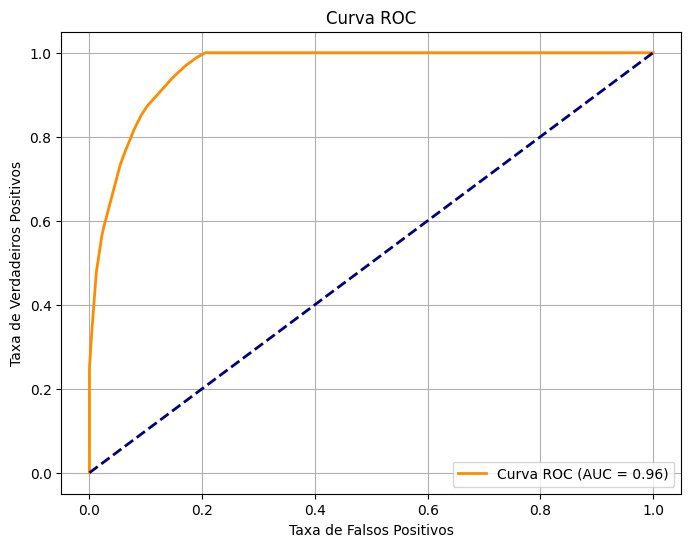

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
from sklearn.utils import resample
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE  # Importando a técnica SMOTE
from google.colab import drive


drive.mount('/content/drive')
file_path = "/content/drive/MyDrive/2024-5/liver_data_normalizado2.csv"

# Carregar os dados (já foi carregado anteriormente)
df_pandas = pd.read_csv("/content/drive/MyDrive/2024-5/liver_data_normalizado2.csv")

# Definir variáveis independentes e a variável dependente (evento)
variaveis_independentes = [
    "INIT_ALBUMIN", "FINAL_ALBUMIN", "INIT_ASCITES", "FINAL_ASCITES", "INIT_BILIRUBIN", "FINAL_BILIRUBIN",
    "INIT_SERUM_CREAT", "FINAL_SERUM_CREAT", "CREAT_DON", "DIAB", "DIABETES_DON", "HIST_INSULIN_DEP_DON",
    "INIT_DIALYSIS_PRIOR_WEEK", "FINAL_DIALYSIS_PRIOR_WEEK", "INIT_ENCEPH", "FINAL_ENCEPH", "ETHCAT",
    "ETHCAT_DON", "GENDER", "GENDER_DON", "INIT_AGE", "AGE_DON", "DGN_TCR", "INIT_BMI_CALC", "END_BMI_CALC",
    "BMI_DON_CALC", "INIT_INR", "FINAL_INR", "INIT_MELD_PELD_LAB_SCORE", "FINAL_MELD_PELD_LAB_SCORE",
    "INIT_SERUM_SODIUM", "FINAL_SERUM_SODIUM", "PREV_TX", "PREV_TX_ANY", "NUM_PREV_TX", "COD_CAD_DON", "COLD_ISCH"
]

"""# VARIAVEIS ESCOLHIDAS PELO FEATURE_IMPORTANCES DO RANDOM_FOREST_CLASSIFIER
variaveis_importantes = [
    "FINAL_SERUM_CREAT",
    "INIT_SERUM_CREAT",
    "COD_CAD_DON",
    "DGN_TCR",
    "INIT_BILIRUBIN",
    "FINAL_INR",
    "FINAL_BILIRUBIN",
    "INIT_AGE",
    "FINAL_ASCITES",
    "ETHCAT_DON"
]"""

# Variável dependente
df_pandas["evento"] = (df_pandas["tempo_sobrevida"] <= 12).astype(int)

# Separar as variáveis independentes e a variável dependente
X = df_pandas[variaveis_independentes]
y = df_pandas["evento"]

# Remover colunas não numéricas e preencher valores ausentes
X = X.select_dtypes(include=[np.number])

# Tratamento de valores ausentes
imputer = SimpleImputer(strategy="median")
X_imputed = imputer.fit_transform(X)

# Normalização dos dados
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Dividir os dados em conjunto de treino e teste
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

# Instanciando SMOTE com uma estratégia de amostragem de 0.2 (20%)
smote = SMOTE(sampling_strategy= 0.2, random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_scaled, y)

# Dividir os dados em conjunto de treino e teste
X_train, X_test, y_train, y_test = train_test_split(X_train_resampled, y_train_resampled, test_size=0.3, random_state=42)

# Criar o modelo de árvore de decisão
modelo = DecisionTreeClassifier(criterion='gini', max_depth=None, max_features=None, min_samples_leaf=4,
                                min_samples_split=2, splitter='random')

# Treinar o modelo com os dados balanceados
modelo.fit(X_train_resampled, y_train_resampled)

# Fazer previsões
y_pred = modelo.predict(X_test)

# Avaliar o modelo
acuracia = accuracy_score(y_test, y_pred)
relatorio = classification_report(y_test, y_pred)
matriz_confusao = confusion_matrix(y_test, y_pred)

# Exibir os resultados
print("Acurácia:", acuracia)
print("Relatório de Classificação:")
print(relatorio)
print("Matriz de Confusão:")
print(matriz_confusao)

# Calcular as probabilidades para a curva ROC
y_prob = modelo.predict_proba(X_test)[:, 1]

# Calcular a curva ROC
fpr, tpr, thresholds = roc_curve(y_test, y_prob)

# Calcular a AUC
roc_auc = auc(fpr, tpr)

# Plotar a curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'Curva ROC (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('Taxa de Falsos Positivos')
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.title('Curva ROC')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

###Sem SMOTE

Acurácia: 0.823732413060791
Relatório de Classificação:
              precision    recall  f1-score   support

           0       0.88      0.93      0.90     16475
           1       0.17      0.10      0.13      2360

    accuracy                           0.82     18835
   macro avg       0.52      0.52      0.52     18835
weighted avg       0.79      0.82      0.80     18835

Matriz de Confusão:
[[15271  1204]
 [ 2116   244]]


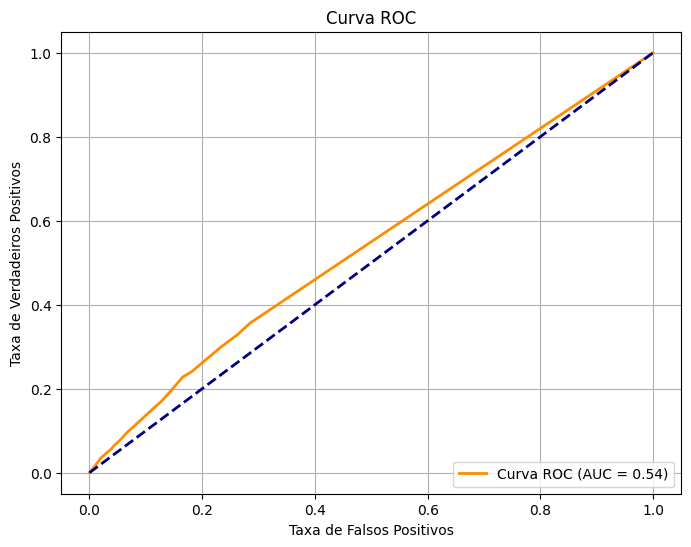

In [ ]:


import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt

#Carregar os dados (já foi carregado anteriormente)
df_pandas = pd.read_csv("/content/drive/MyDrive/2024-5/liver_data_normalizado2.csv")

# Definir variáveis independentes e a variável dependente (evento)
variaveis_independentes = [
    "INIT_ALBUMIN", "FINAL_ALBUMIN", "INIT_ASCITES", "FINAL_ASCITES", "INIT_BILIRUBIN", "FINAL_BILIRUBIN",
    "INIT_SERUM_CREAT", "FINAL_SERUM_CREAT", "CREAT_DON", "DIAB", "DIABETES_DON", "HIST_INSULIN_DEP_DON",
    "INIT_DIALYSIS_PRIOR_WEEK", "FINAL_DIALYSIS_PRIOR_WEEK", "INIT_ENCEPH", "FINAL_ENCEPH", "ETHCAT",
    "ETHCAT_DON", "GENDER", "GENDER_DON", "INIT_AGE", "AGE_DON", "DGN_TCR", "INIT_BMI_CALC", "END_BMI_CALC",
    "BMI_DON_CALC", "INIT_INR", "FINAL_INR", "INIT_MELD_PELD_LAB_SCORE", "FINAL_MELD_PELD_LAB_SCORE",
    "INIT_SERUM_SODIUM", "FINAL_SERUM_SODIUM", "PREV_TX", "PREV_TX_ANY", "NUM_PREV_TX", "COD_CAD_DON", "COLD_ISCH"
]


"""#VARIAVEIS ESCOLHIDAS PELO FEATURE_IMPORTANCES DO RANDOM_FOREST_CLASSIFIER
variaveis_importantes = [
    "FINAL_SERUM_CREAT",
    "INIT_SERUM_CREAT",
    "COD_CAD_DON",
    "DGN_TCR",
    "INIT_BILIRUBIN",
    "FINAL_INR",
    "FINAL_BILIRUBIN",
    "INIT_AGE",
    "FINAL_ASCITES",
    "ETHCAT_DON"
]"""

# Variável dependente
df_pandas["evento"] = (df_pandas["tempo_sobrevida"] <= 12).astype(int)

"""# Contagem da quantidade de elementos do df_pandas["eventos"]
print("Distribuição:")
print(df_pandas["evento"].value_counts())"""

# Separar as variáveis independentes e a variável dependente
X = df_pandas[variaveis_independentes]
y = df_pandas["evento"]

# Remover colunas não numéricas e preencher valores ausentes
X = df_pandas[variaveis_independentes].select_dtypes(include=[np.number])
y = df_pandas["evento"]

# Tratamento de valores ausentes
imputer = SimpleImputer(strategy="median")
X_imputed = imputer.fit_transform(X)

# Normalização dos dados
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Dividir os dados em conjunto de treino e teste
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

# Criar o modelo de árvore de decisão
modelo = DecisionTreeClassifier(criterion = 'gini', max_depth = None, max_features = None, min_samples_leaf= 4, min_samples_split = 2, splitter = 'random')

# Treinar o modelo
modelo.fit(X_train, y_train)

# Fazer previsões
y_pred = modelo.predict(X_test)

# Avaliar o modelo
acuracia = accuracy_score(y_test, y_pred)
relatorio = classification_report(y_test, y_pred)
matriz_confusao = confusion_matrix(y_test, y_pred)

# Exibir os resultados
print("Acurácia:", acuracia)
print("Relatório de Classificação:")
print(relatorio)
print("Matriz de Confusão:")
print(matriz_confusao)

# Calcular as probabilidades para a curva ROC
y_prob = modelo.predict_proba(X_test)[:, 1]

# Calcular a curva ROC
fpr, tpr, thresholds = roc_curve(y_test, y_prob)

# Calcular a AUC
roc_auc = auc(fpr, tpr)

# Plotar a curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'Curva ROC (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('Taxa de Falsos Positivos')
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.title('Curva ROC')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()


##Até 5 anos

###Com Smote

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Acurácia: 0.8623966284987278
Relatório de Classificação:
              precision    recall  f1-score   support

           0       0.83      0.90      0.87     12559
           1       0.89      0.82      0.86     12593

    accuracy                           0.86     25152
   macro avg       0.86      0.86      0.86     25152
weighted avg       0.86      0.86      0.86     25152

Matriz de Confusão:
[[11340  1219]
 [ 2242 10351]]


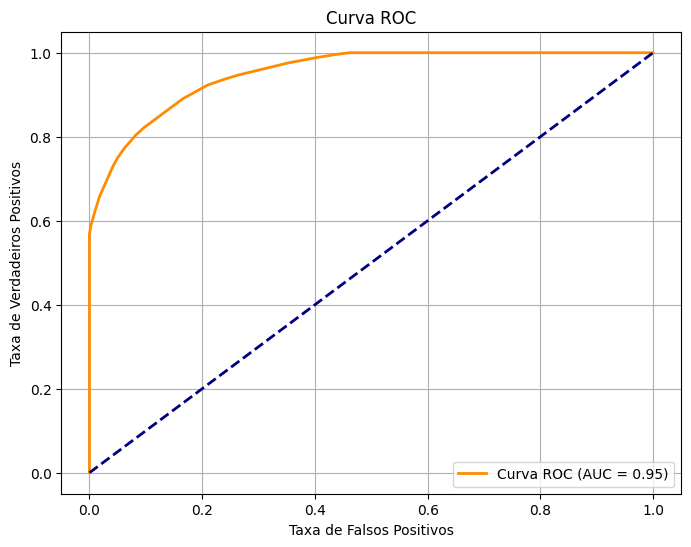

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np
from sklearn.utils import resample
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE  # Importando a técnica SMOTE
from google.colab import drive

drive.mount('/content/drive')
file_path = "/content/drive/MyDrive/2024-5/liver_data_normalizado2.csv"

# Carregar os dados (já foi carregado anteriormente)
df_pandas = pd.read_csv("/content/drive/MyDrive/2024-5/liver_data_normalizado2.csv")

# Definir variáveis independentes e a variável dependente (evento)
variaveis_independentes = [
    "INIT_ALBUMIN", "FINAL_ALBUMIN", "INIT_ASCITES", "FINAL_ASCITES", "INIT_BILIRUBIN", "FINAL_BILIRUBIN",
    "INIT_SERUM_CREAT", "FINAL_SERUM_CREAT", "CREAT_DON", "DIAB", "DIABETES_DON", "HIST_INSULIN_DEP_DON",
    "INIT_DIALYSIS_PRIOR_WEEK", "FINAL_DIALYSIS_PRIOR_WEEK", "INIT_ENCEPH", "FINAL_ENCEPH", "ETHCAT",
    "ETHCAT_DON", "GENDER", "GENDER_DON", "INIT_AGE", "AGE_DON", "DGN_TCR", "INIT_BMI_CALC", "END_BMI_CALC",
    "BMI_DON_CALC", "INIT_INR", "FINAL_INR", "INIT_MELD_PELD_LAB_SCORE", "FINAL_MELD_PELD_LAB_SCORE",
    "INIT_SERUM_SODIUM", "FINAL_SERUM_SODIUM", "PREV_TX", "PREV_TX_ANY", "NUM_PREV_TX", "COD_CAD_DON", "COLD_ISCH"
]

"""# VARIAVEIS ESCOLHIDAS PELO FEATURE_IMPORTANCES DO RANDOM_FOREST_CLASSIFIER
variaveis_importantes = [
    "FINAL_SERUM_CREAT",
    "INIT_SERUM_CREAT",
    "COD_CAD_DON",
    "DGN_TCR",
    "INIT_BILIRUBIN",
    "FINAL_INR",
    "FINAL_BILIRUBIN",
    "INIT_AGE",
    "FINAL_ASCITES",
    "ETHCAT_DON"
]"""

# Variável dependente
df_pandas["evento"] = (df_pandas["tempo_sobrevida"] <= 60).astype(int)

# Separar as variáveis independentes e a variável dependente
X = df_pandas[variaveis_independentes]
y = df_pandas["evento"]

# Remover colunas não numéricas e preencher valores ausentes
X = X.select_dtypes(include=[np.number])

# Tratamento de valores ausentes
imputer = SimpleImputer(strategy="median")
X_imputed = imputer.fit_transform(X)

# Normalização dos dados
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Dividir os dados em conjunto de treino e teste
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

# Instanciando SMOTE
smote = SMOTE( random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_scaled, y)

# Dividir os dados em conjunto de treino e teste
X_train, X_test, y_train, y_test = train_test_split(X_train_resampled, y_train_resampled, test_size=0.3, random_state=42)

# Criar o modelo de árvore de decisão
modelo = DecisionTreeClassifier(criterion='gini', max_depth=None, max_features=None, min_samples_leaf=4,
                                min_samples_split=2, splitter='random')

# Treinar o modelo com os dados balanceados
modelo.fit(X_train_resampled, y_train_resampled)

# Fazer previsões
y_pred = modelo.predict(X_test)

# Avaliar o modelo
acuracia = accuracy_score(y_test, y_pred)
relatorio = classification_report(y_test, y_pred)
matriz_confusao = confusion_matrix(y_test, y_pred)

# Exibir os resultados
print("Acurácia:", acuracia)
print("Relatório de Classificação:")
print(relatorio)
print("Matriz de Confusão:")
print(matriz_confusao)

# Calcular as probabilidades para a curva ROC
y_prob = modelo.predict_proba(X_test)[:, 1]

# Calcular a curva ROC
fpr, tpr, thresholds = roc_curve(y_test, y_prob)

# Calcular a AUC
roc_auc = auc(fpr, tpr)

# Plotar a curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'Curva ROC (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('Taxa de Falsos Positivos')
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.title('Curva ROC')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

###Sem SMOTE

Acurácia: 0.5785505707459517
Relatório de Classificação:
              precision    recall  f1-score   support

           0       0.67      0.72      0.70     12536
           1       0.35      0.29      0.32      6299

    accuracy                           0.58     18835
   macro avg       0.51      0.51      0.51     18835
weighted avg       0.56      0.58      0.57     18835

Matriz de Confusão:
[[9047 3489]
 [4449 1850]]


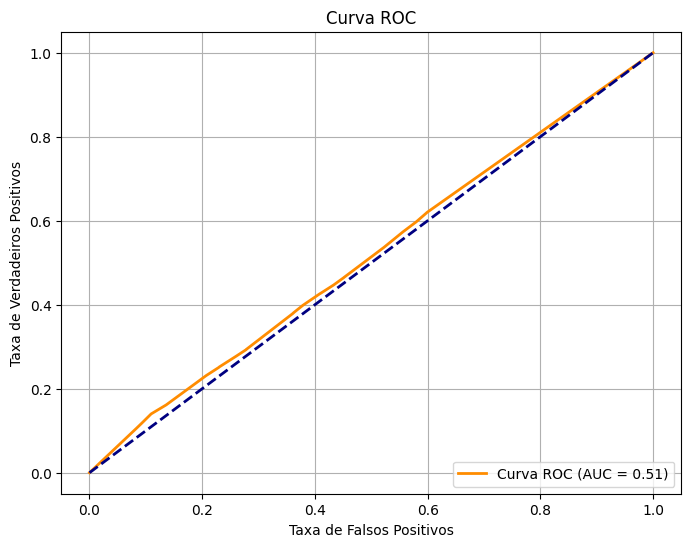

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt

#Carregar os dados (já foi carregado anteriormente)
df_pandas = pd.read_csv("/content/drive/MyDrive/2024-5/liver_data_normalizado2.csv")

# Definir variáveis independentes e a variável dependente (evento)
variaveis_independentes = [
    "INIT_ALBUMIN", "FINAL_ALBUMIN", "INIT_ASCITES", "FINAL_ASCITES", "INIT_BILIRUBIN", "FINAL_BILIRUBIN",
    "INIT_SERUM_CREAT", "FINAL_SERUM_CREAT", "CREAT_DON", "DIAB", "DIABETES_DON", "HIST_INSULIN_DEP_DON",
    "INIT_DIALYSIS_PRIOR_WEEK", "FINAL_DIALYSIS_PRIOR_WEEK", "INIT_ENCEPH", "FINAL_ENCEPH", "ETHCAT",
    "ETHCAT_DON", "GENDER", "GENDER_DON", "INIT_AGE", "AGE_DON", "DGN_TCR", "INIT_BMI_CALC", "END_BMI_CALC",
    "BMI_DON_CALC", "INIT_INR", "FINAL_INR", "INIT_MELD_PELD_LAB_SCORE", "FINAL_MELD_PELD_LAB_SCORE",
    "INIT_SERUM_SODIUM", "FINAL_SERUM_SODIUM", "PREV_TX", "PREV_TX_ANY", "NUM_PREV_TX", "COD_CAD_DON", "COLD_ISCH"
]


"""#VARIAVEIS ESCOLHIDAS PELO FEATURE_IMPORTANCES DO RANDOM_FOREST_CLASSIFIER
variaveis_importantes = [
    "FINAL_SERUM_CREAT",
    "INIT_SERUM_CREAT",
    "COD_CAD_DON",
    "DGN_TCR",
    "INIT_BILIRUBIN",
    "FINAL_INR",
    "FINAL_BILIRUBIN",
    "INIT_AGE",
    "FINAL_ASCITES",
    "ETHCAT_DON"
]"""

# Variável dependente
df_pandas["evento"] = (df_pandas["tempo_sobrevida"] <= 60).astype(int)

"""# Contagem da quantidade de elementos do df_pandas["eventos"]
print("Distribuição:")
print(df_pandas["evento"].value_counts())"""

# Separar as variáveis independentes e a variável dependente
X = df_pandas[variaveis_independentes]
y = df_pandas["evento"]

# Remover colunas não numéricas e preencher valores ausentes
X = df_pandas[variaveis_independentes].select_dtypes(include=[np.number])
y = df_pandas["evento"]

# Tratamento de valores ausentes
imputer = SimpleImputer(strategy="median")
X_imputed = imputer.fit_transform(X)

# Normalização dos dados
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Dividir os dados em conjunto de treino e teste
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

# Criar o modelo de árvore de decisão
modelo = DecisionTreeClassifier(criterion = 'gini', max_depth = None, max_features = None, min_samples_leaf= 4, min_samples_split = 2, splitter = 'random')

# Treinar o modelo
modelo.fit(X_train, y_train)

# Fazer previsões
y_pred = modelo.predict(X_test)

# Avaliar o modelo
acuracia = accuracy_score(y_test, y_pred)
relatorio = classification_report(y_test, y_pred)
matriz_confusao = confusion_matrix(y_test, y_pred)

# Exibir os resultados
print("Acurácia:", acuracia)
print("Relatório de Classificação:")
print(relatorio)
print("Matriz de Confusão:")
print(matriz_confusao)

# Calcular as probabilidades para a curva ROC
y_prob = modelo.predict_proba(X_test)[:, 1]

# Calcular a curva ROC
fpr, tpr, thresholds = roc_curve(y_test, y_prob)

# Calcular a AUC
roc_auc = auc(fpr, tpr)

# Plotar a curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'Curva ROC (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('Taxa de Falsos Positivos')
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.title('Curva ROC')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()
